In [1]:
import numpy as np
import matplotlib.pyplot as plt
import math
import pandas as pd
#import uproot
import uproot3
from scipy import optimize as op

In [2]:
#Gain access to functions used to change some of the aspects regarding arrays and the things in them
%run /Users/cmc/analysis_phd/analysis_twopi_clas6/cut_determinations/e16/Bin\ Conversions.ipynb

#Gain Access to functions used to work with momentum binning
%run /Users/cmc/analysis_phd/analysis_twopi_clas6/cut_determinations/e16/Momentum\ Bins.ipynb

#Gain Access to functions used to work with Fitting Functions
%run /Users/cmc/analysis_phd/analysis_twopi_clas6/cut_determinations/e16/Fitting\ Functions.ipynb

#Gain Access to functions used for TH2s 
#uproot or uproo4
#%run /Users/cmc/analysis_phd/analysis_twopi_clas6/cut_determinations/e16/TH2\ Functions.ipynb
#uproot3
%run /Users/cmc/analysis_phd/analysis_twopi_clas6/cut_determinations/e16/TH2\ Functions-uproot3.ipynb

*Bin Conversions*
Available Functions:
Note: All functions return new arrays rather than altering the previous array
	New_Merged_Size(array_,merge_size_) returns what the size of the new merged array will be
	Merge_Bin_Edges(edges_,merge_size) merges the bin edges 
	Merge_Bins(array_,merge_size_) adds together every <merge_size_> values in an array
	Merge_Vals(yarray_,merge_size_) adds together every <merge_size_> ybin together in an array
	Merge_Bins(xarray_,merge_size_) averages every <merge_size_> xbins together in an array
	Count_Non_Zero(array_) counts the number of nonzero values in an array
	Count_Zero(array_) counts the number of zeros in an array
	Remove_Zeros(array_) remove zeros from an array
	Remove_Zeros_Y(yarray_) removes zero values from yarray
	Remove_Zeros_X(xarray_,yarray_) removes xbins where the corresponding y value was zero
	Count_InBounds(yarray_,low_,high_) counts the number of values that fall between bounds (or equal to)
	Count_OutBounds(yarray_,low_,high_) co

In [3]:
dir="/Users/cmc/analysis_phd/root_files/cut_determination/cut_det_e16/06-13-2022"
root_file=dir+"/exp_sf_e16_06-13-2022_13866485.root"
#file=uproot.open(root_file)
sf_file=uproot3.open(root_file)
#sf_selection 0-> pid in experimental W range, 1->event selection in full W range
sf_selection = 1

In [4]:
#The Various layers of TDirectories to get to the histograms
sf_layer1='SF'
sf_layer2=['sf_pid','sf_event']
sf_layer3=sf_layer2[sf_selection]+'_cut'
sf_layer4=[sf_layer3+'_mnone',sf_layer3+'_mall']
sf_layer5=[sf_layer4[sf_selection]+'_sec'+str(i+1) for i in range(6)]
sf_layer6=[sf_layer5[i]+'_W_range' for i in range(6)]
sf_dir_loc = [sf_layer1+'/'+sf_layer2[sf_selection]+'/'+sf_layer3+'/'+sf_layer4[sf_selection]+'/'+sf_layer5[i]+'/'+sf_layer6[i] for i in range(6)]
#Histogram Names
sf_hist_name=[sf_file[sf_dir_loc[i]].keys()[sf_selection] for i in range(6)]

In [5]:
#Convenient List of Histograms
sf_hist=[sf_file[sf_dir_loc[i]][sf_hist_name[i]] for i in range(6)]

In [6]:
#Extracting X and Y bins
#X and Y binning is the same for all sectors
sf_xbins=Center_Xbins(sf_hist[0])
sf_ybins=Center_Ybins(sf_hist[0])

In [7]:
#Extracting Zvals for 2d histograms
sf_zvals_xy=[XY_Values(sf_hist[i]) for i in range(6)]
sf_zvals_yx=[YX_Values(sf_hist[i]) for i in range(6)]

In [8]:
#Determining Cell Merging 
_sf_xmerge=2
_sf_ymerge=2
_sf_xname="p(GeV)"
_sf_yname="sf"
#Merge -> No Zeros
sf_x = Merge_Bins(sf_xbins,_sf_xmerge)
sf_y = Merge_Bins(sf_ybins,_sf_ymerge)
sf_xedges = Merge_Bin_Edges(XEdges_2d(sf_hist[0]),_sf_xmerge)
sf_yedges = Merge_Bin_Edges(YEdges_2d(sf_hist[0]),_sf_ymerge)
sf_z_xy=[Merge_Z(sf_zvals_xy[i],_sf_xmerge,_sf_ymerge) for i in range(6)]
sf_z_yx=[Merge_Z(sf_zvals_xy[i],_sf_ymerge,_sf_xmerge) for i in range(6)]
sf_fit_x = [[Remove_Zeros_X(sf_y,sf_z_xy[sec][xbin]) for xbin in range(len(sf_x))] for sec in range(6)]
sf_fit_y = [[Remove_Zeros_Y(sf_z_xy[sec][xbin]) for xbin in range(len(sf_x))] for sec in range(6)]

In [9]:
def Pbin_low(xbin_):
    return round(sf_xedges[xbin_],3)
def Pbin_top(xbin_):
    return round(sf_xedges[xbin_+1],3)

[4.87265083e+01 2.83325499e-01 2.98148769e-02]


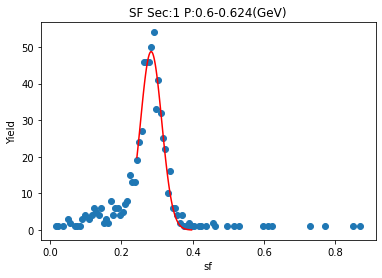

[6.20358095e+01 2.77521282e-01 2.83180992e-02]


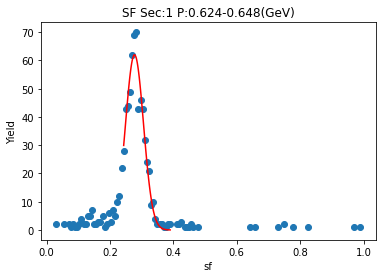

[7.21937910e+01 2.72253280e-01 3.19377578e-02]


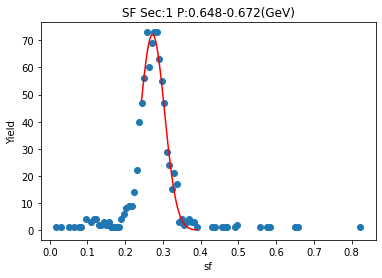

[7.84572768e+01 2.74474481e-01 2.89419294e-02]


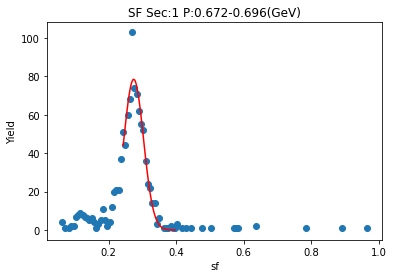

[7.85096017e+01 2.66791475e-01 3.43658152e-02]


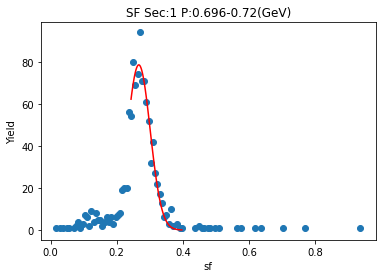

[8.54747986e+01 2.68093773e-01 3.51758530e-02]


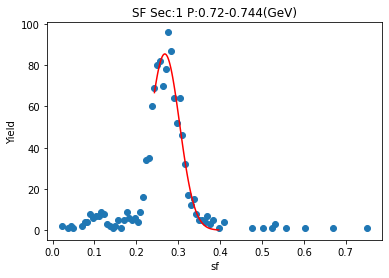

[9.06284630e+01 2.60520867e-01 3.51500868e-02]


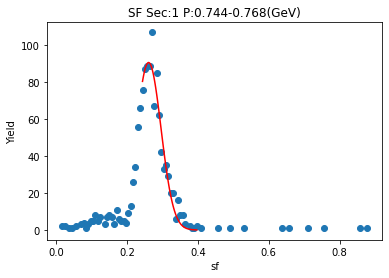

[9.62978959e+01 2.70454894e-01 3.03440936e-02]


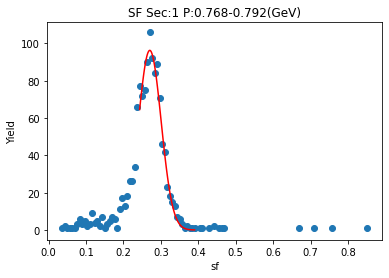

[9.25670307e+01 2.63376085e-01 3.87499912e-02]


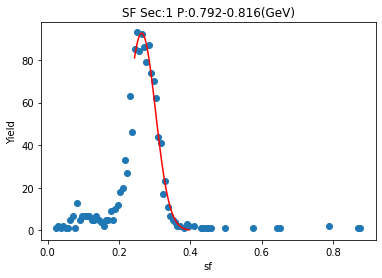

[1.00775413e+02 2.68739030e-01 3.30819421e-02]


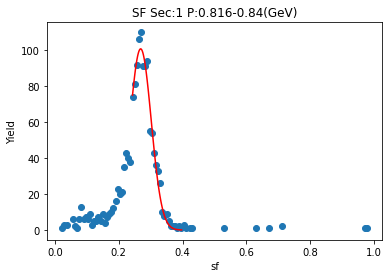

[1.03320437e+02 2.69821268e-01 3.03743835e-02]


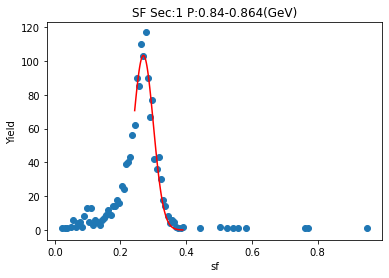

[1.05173240e+02 2.68682199e-01 3.45883383e-02]


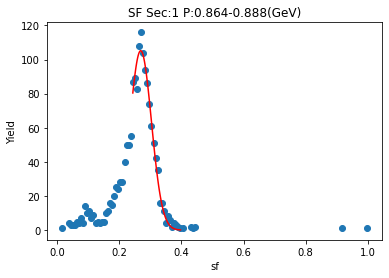

[1.04019641e+02 2.73170023e-01 2.96203945e-02]


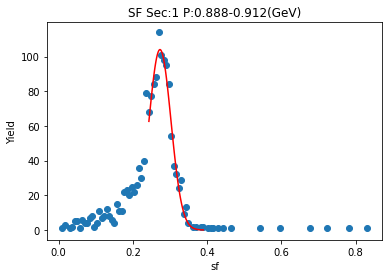

[1.18794695e+02 2.71721083e-01 2.84253392e-02]


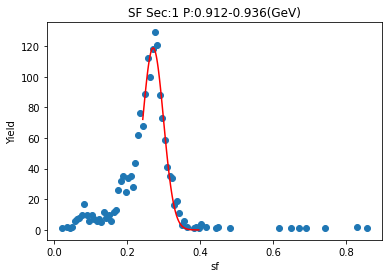

[1.17360103e+02 2.72619357e-01 3.04601397e-02]


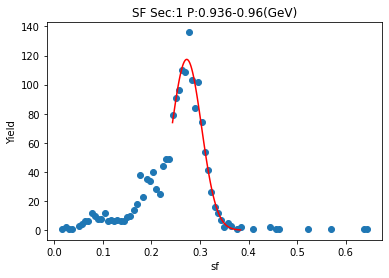

[1.15041057e+02 2.71505286e-01 3.16960147e-02]


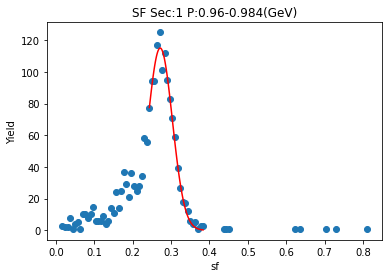

[1.28457063e+02 2.72741704e-01 2.87004461e-02]


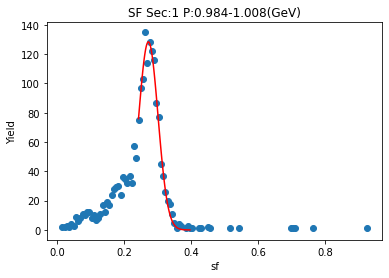

[1.22582695e+02 2.72158211e-01 3.30851004e-02]


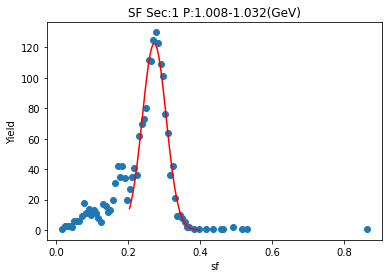

[1.25276785e+02 2.73295835e-01 3.09405856e-02]


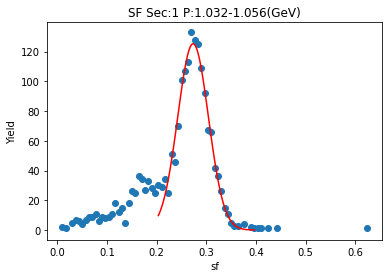

[1.26288777e+02 2.70911492e-01 3.28577535e-02]


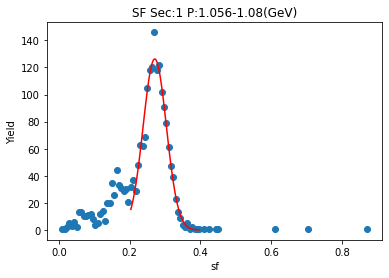

[1.42671600e+02 2.74306000e-01 2.98780521e-02]


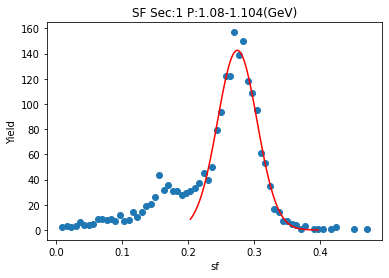

[1.28607381e+02 2.75854051e-01 3.12254699e-02]


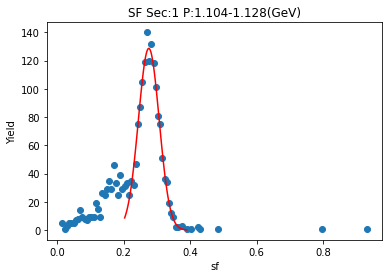

[1.35432559e+02 2.75327682e-01 2.99575745e-02]


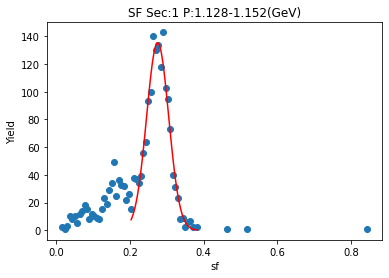

[1.41411938e+02 2.76124260e-01 3.03618925e-02]


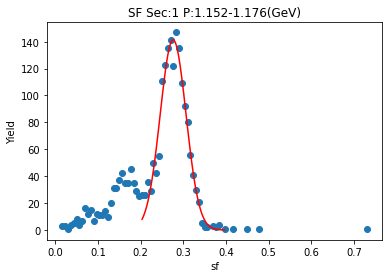

[1.38583549e+02 2.75066093e-01 3.04354254e-02]


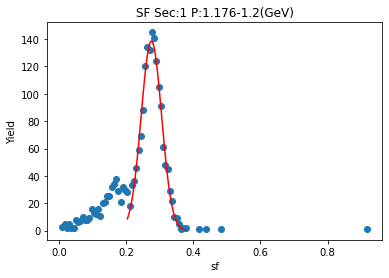

[1.48076288e+02 2.77157170e-01 2.92542647e-02]


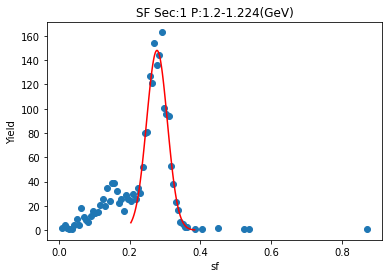

[1.50939173e+02 2.78718138e-01 2.74616474e-02]


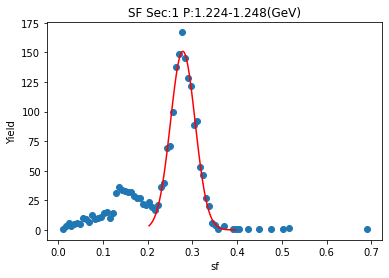

[1.58076625e+02 2.78345777e-01 2.72176911e-02]


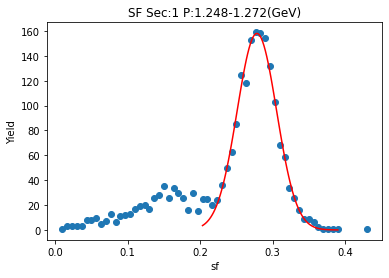

[1.66305320e+02 2.78789139e-01 2.62618984e-02]


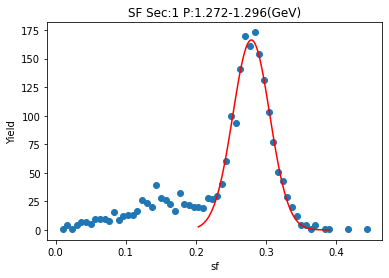

[1.51440623e+02 2.79940942e-01 2.89140474e-02]


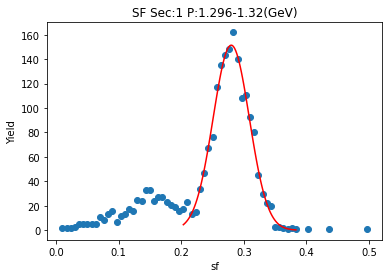

[1.75060023e+02 2.80689124e-01 2.64259571e-02]


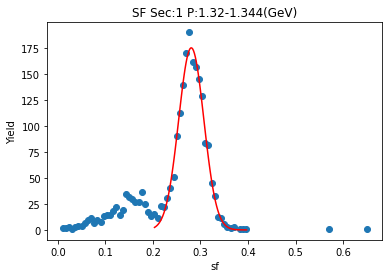

[1.84735258e+02 2.79838479e-01 2.47717672e-02]


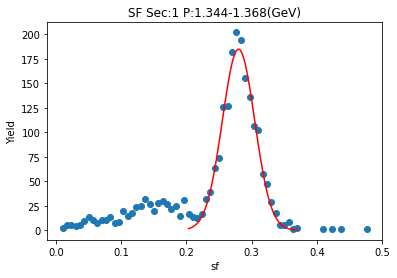

[1.83416370e+02 2.79934929e-01 2.56879831e-02]


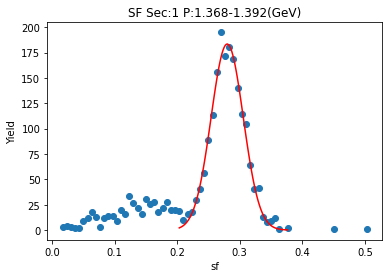

[1.76195149e+02 2.81549087e-01 2.57067674e-02]


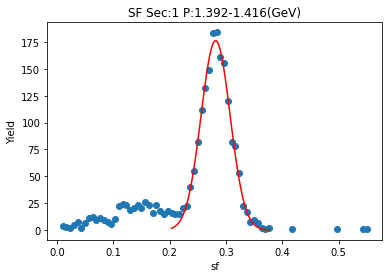

[1.82432220e+02 2.80473306e-01 2.66761310e-02]


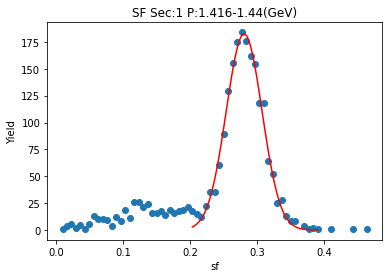

[1.79567817e+02 2.81166495e-01 2.64073503e-02]


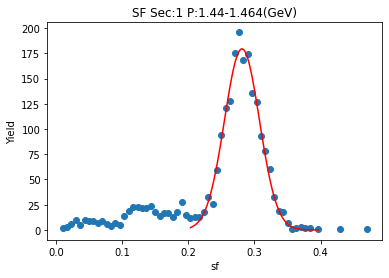

[2.04400673e+02 2.83390075e-01 2.40350727e-02]


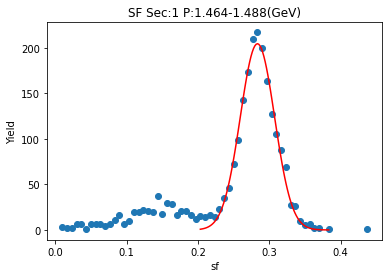

[2.07948280e+02 2.83368296e-01 2.39682931e-02]


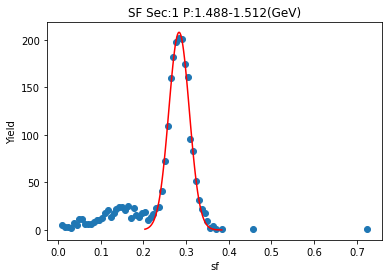

[1.98228186e+02 2.84209894e-01 2.44811275e-02]


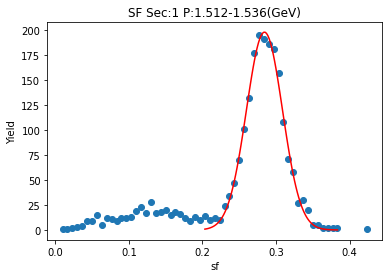

[2.09572003e+02 2.83259074e-01 2.39896527e-02]


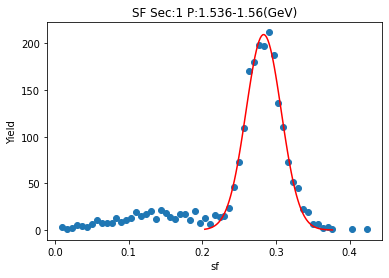

[1.95342088e+02 2.84846653e-01 2.41564334e-02]


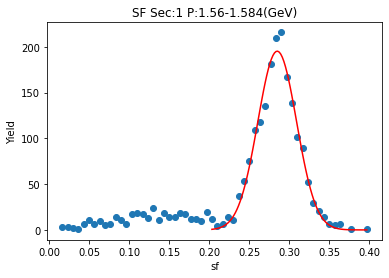

[2.13964514e+02 2.84407834e-01 2.33678889e-02]


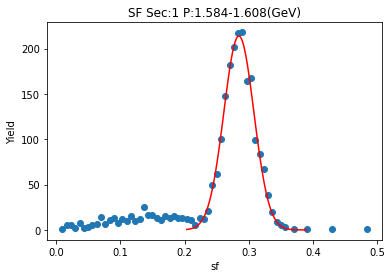

[2.15447255e+02 2.85179629e-01 2.42127486e-02]


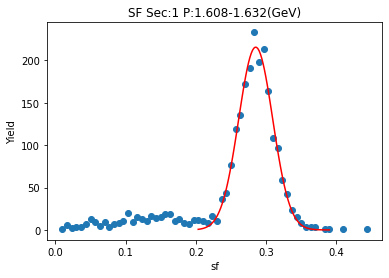

[2.24114219e+02 2.85413868e-01 2.38167065e-02]


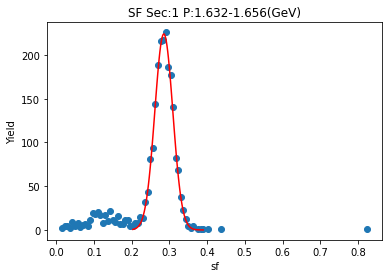

[2.29089530e+02 2.86041699e-01 2.31620302e-02]


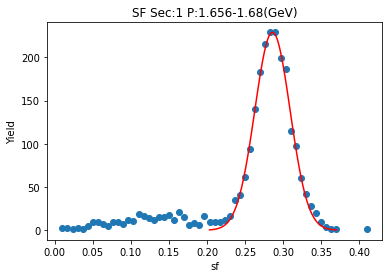

[2.49509898e+02 2.86257058e-01 2.23933970e-02]


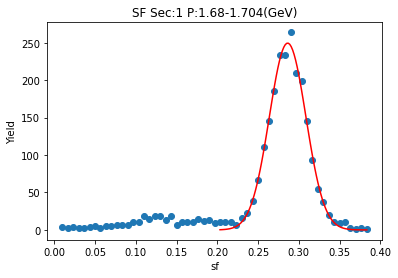

[2.44304864e+02 2.86270832e-01 2.29161493e-02]


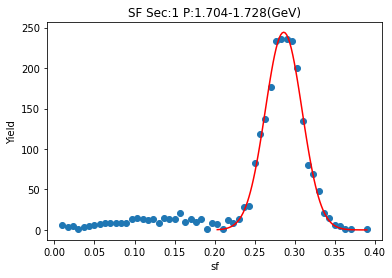

[2.41774710e+02 2.85838614e-01 2.27685611e-02]


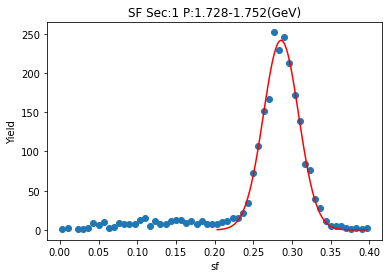

[2.64787632e+02 2.87174773e-01 2.25572175e-02]


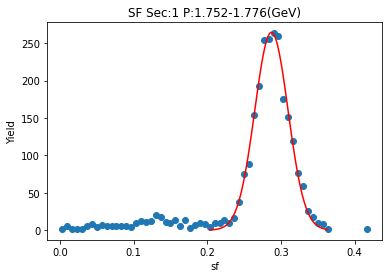

[2.69451035e+02 2.86795805e-01 2.20703846e-02]


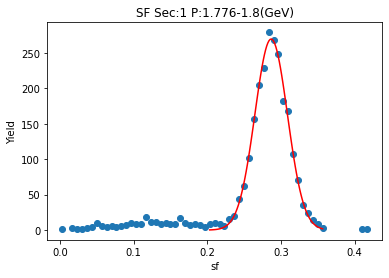

[2.58633018e+02 2.87767276e-01 2.27240715e-02]


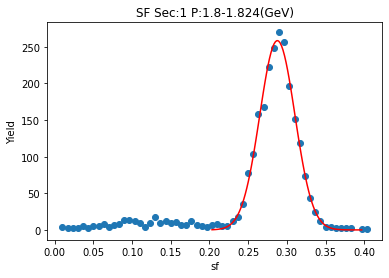

[2.56240597e+02 2.88034595e-01 2.28451094e-02]


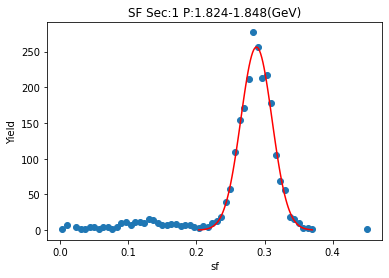

[2.68900678e+02 2.87159204e-01 2.23344228e-02]


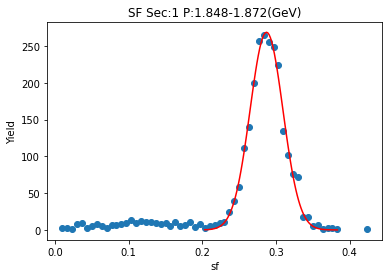

[2.83054604e+02 2.87440527e-01 2.23212787e-02]


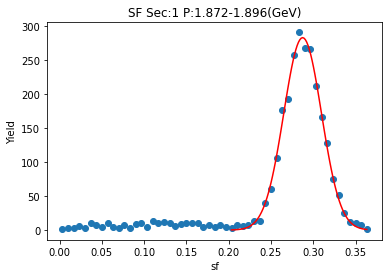

[2.75740073e+02 2.87507392e-01 2.24945169e-02]


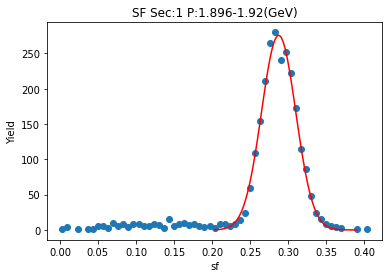

[2.85761423e+02 2.87875901e-01 2.17660440e-02]


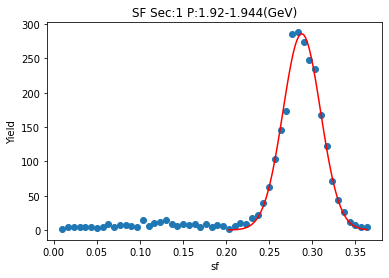

[2.98335198e+02 2.88105728e-01 2.16351212e-02]


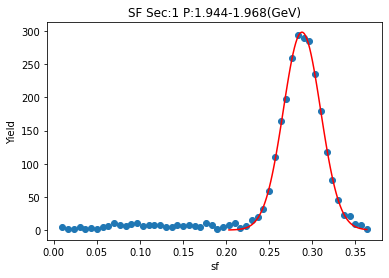

[3.11069288e+02 2.88603524e-01 2.11796659e-02]


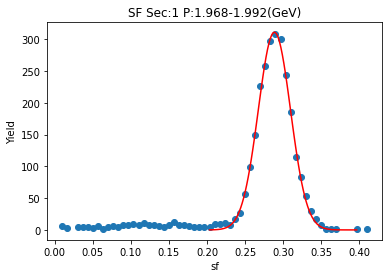

[3.15223420e+02 2.89534816e-01 2.10788079e-02]


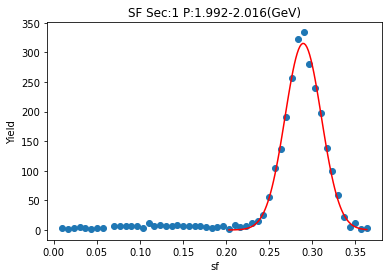

[3.24578530e+02 2.89401089e-01 2.14147288e-02]


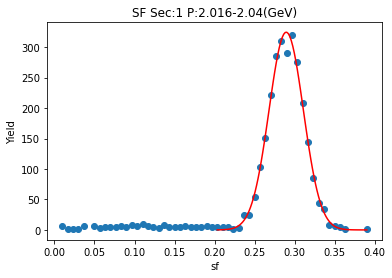

[3.35706147e+02 2.89390102e-01 2.08873056e-02]


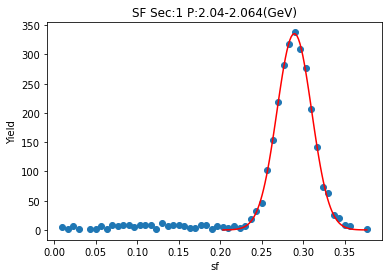

[3.36598195e+02 2.89277068e-01 2.07998126e-02]


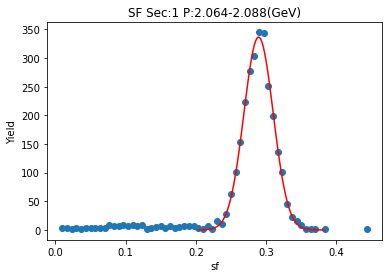

[3.36901418e+02 2.89258799e-01 2.10531768e-02]


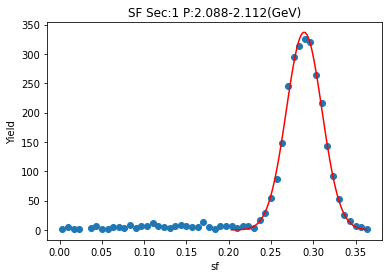

[3.56498586e+02 2.89102269e-01 2.06397748e-02]


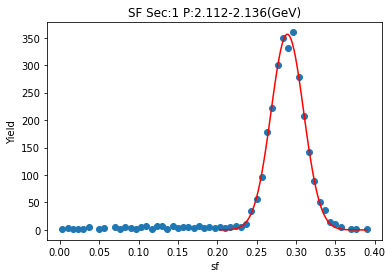

[3.49971816e+02 2.89854976e-01 2.07448139e-02]


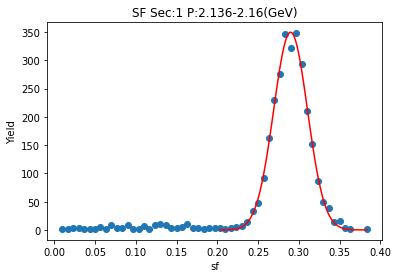

[3.52621069e+02 2.89637620e-01 2.07716750e-02]


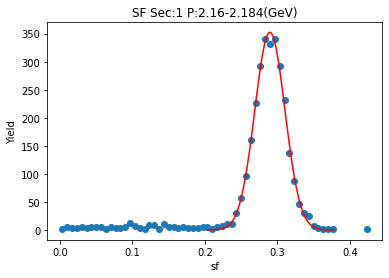

[3.54476299e+02 2.90889881e-01 2.01769059e-02]


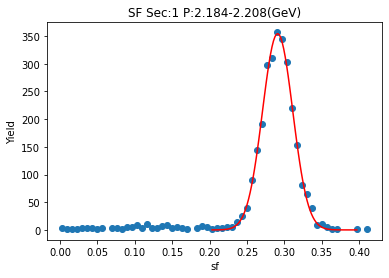

[3.69046974e+02 2.90073940e-01 2.11056800e-02]


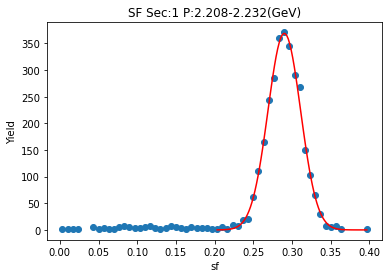

[3.82916155e+02 2.90360460e-01 2.03095104e-02]


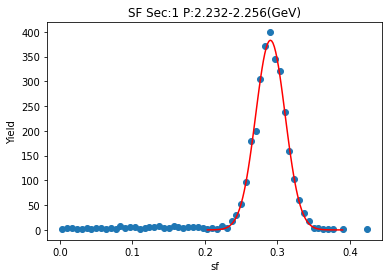

[3.93626137e+02 2.90402038e-01 1.98782529e-02]


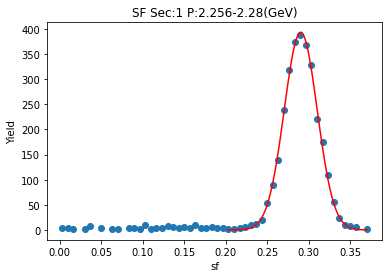

[3.92754996e+02 2.90425891e-01 1.99161260e-02]


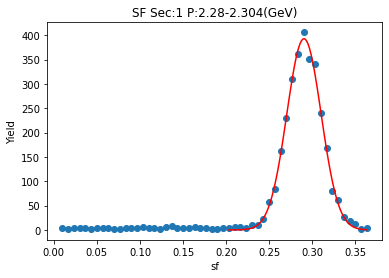

[4.01761278e+02 2.90593978e-01 1.92789800e-02]


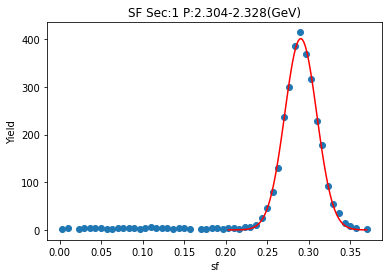

[3.90179634e+02 2.90673155e-01 2.01449754e-02]


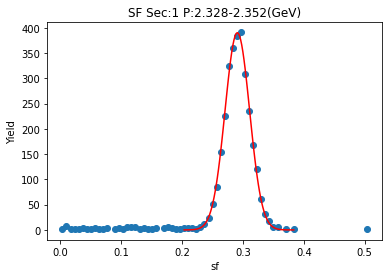

[4.06297437e+02 2.91641960e-01 2.05306305e-02]


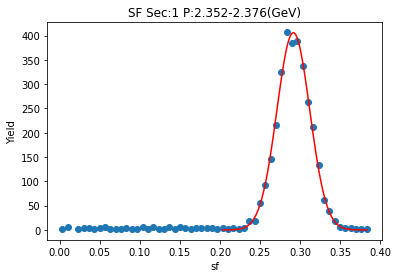

[4.14589934e+02 2.91480662e-01 1.96721027e-02]


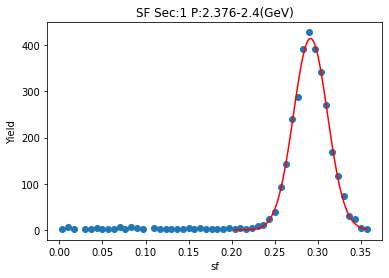

[4.38786395e+02 2.92001244e-01 1.91574869e-02]


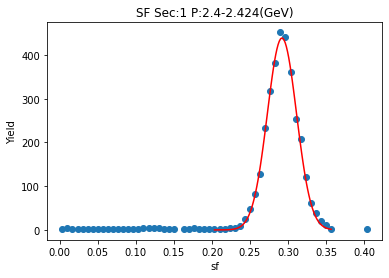

[4.55662544e+02 2.91311125e-01 1.81421069e-02]


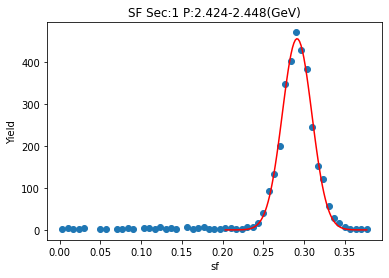

[4.33927365e+02 2.91451769e-01 1.96419720e-02]


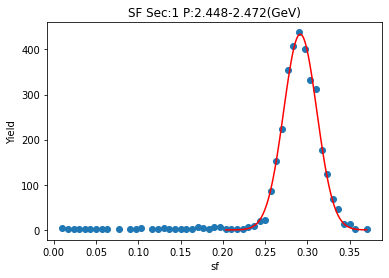

[4.51347660e+02 2.91805573e-01 1.86547332e-02]


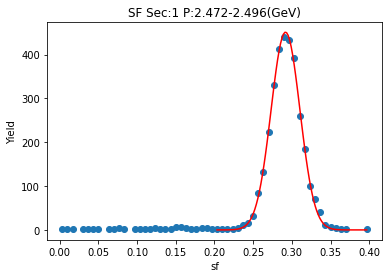

[4.66690457e+02 2.91762953e-01 1.85496694e-02]


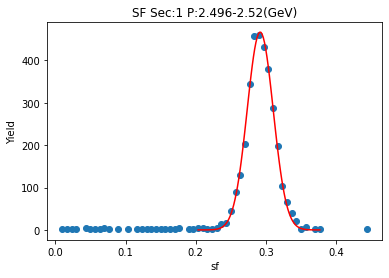

[4.54462633e+02 2.92027760e-01 1.91056870e-02]


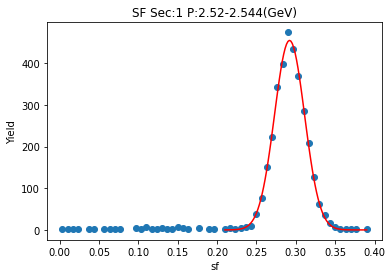

[4.57864231e+02 2.92656699e-01 1.91113715e-02]


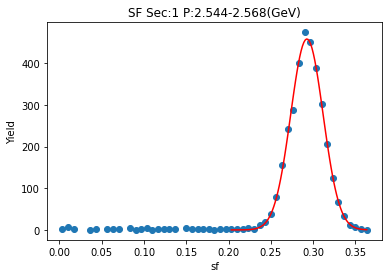

[4.63266387e+02 2.92248553e-01 1.90700486e-02]


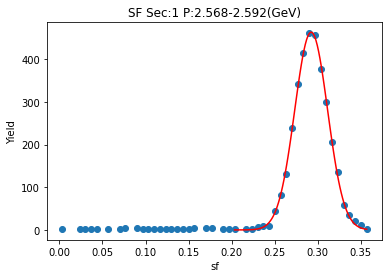

[4.77753680e+02 2.92961630e-01 1.85682316e-02]


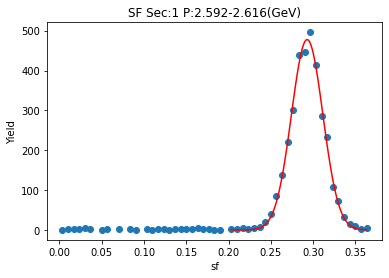

[4.69700232e+02 2.92438778e-01 1.86665948e-02]


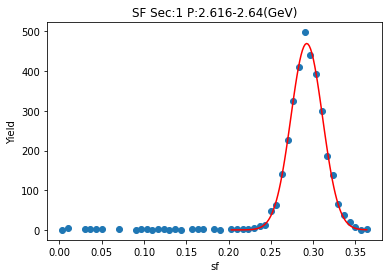

[4.78242003e+02 2.92432310e-01 1.95201965e-02]


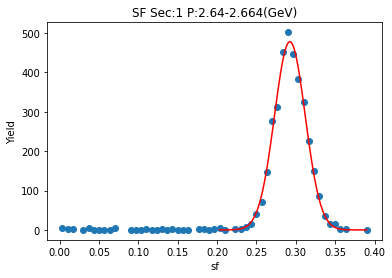

[4.94093745e+02 2.93694016e-01 1.84034241e-02]


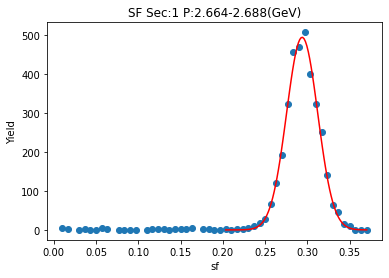

[4.90688706e+02 2.92357895e-01 1.89111963e-02]


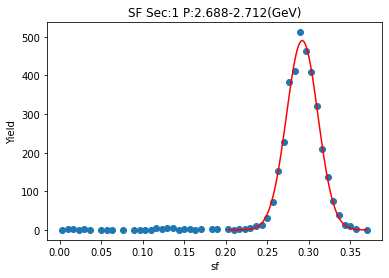

[4.67325106e+02 2.93727763e-01 1.88992867e-02]


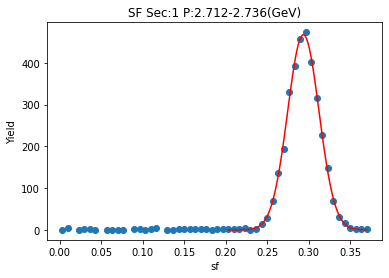

[4.85507949e+02 2.93514206e-01 1.84610926e-02]


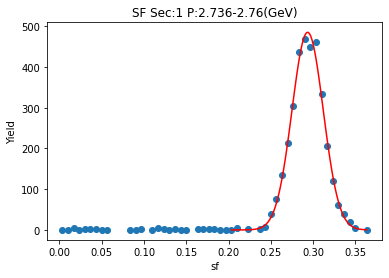

[4.76525527e+02 2.93841832e-01 1.83309093e-02]


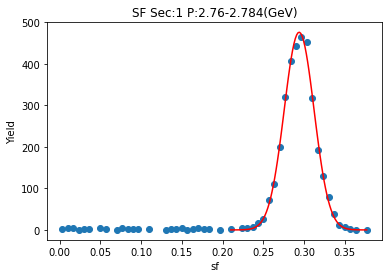

[4.88199855e+02 2.93518597e-01 1.81918916e-02]


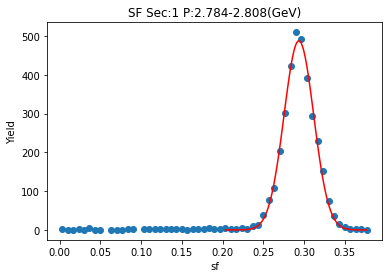

[4.85137586e+02 2.93381683e-01 1.86921210e-02]


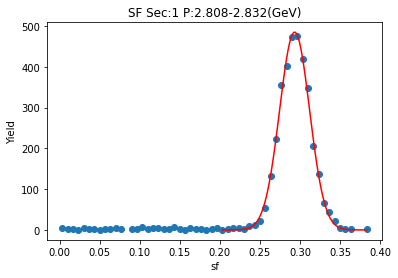

[4.74790796e+02 2.92881874e-01 1.89014389e-02]


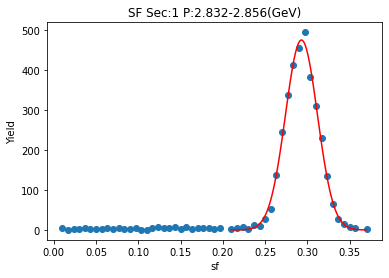

[4.68532899e+02 2.94401592e-01 1.91316538e-02]


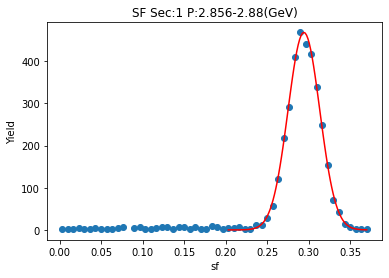

[4.85329481e+02 2.94474355e-01 1.86460903e-02]


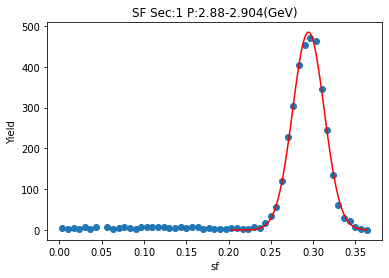

[5.19836995e+02 2.93828542e-01 1.79014070e-02]


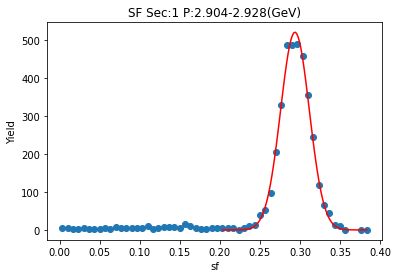

[4.94116550e+02 2.94319964e-01 1.74420821e-02]


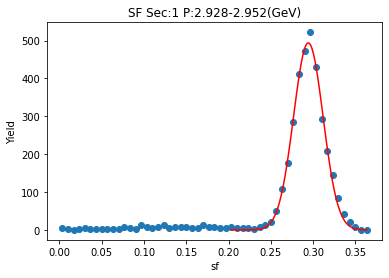

[4.85442421e+02 2.94694165e-01 1.78331149e-02]


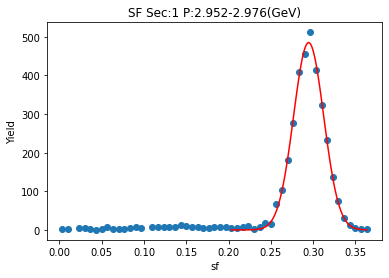

[4.78210691e+02 2.94509984e-01 1.79330966e-02]


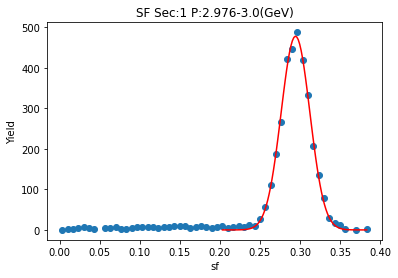

[4.81827916e+02 2.94035468e-01 1.81662456e-02]


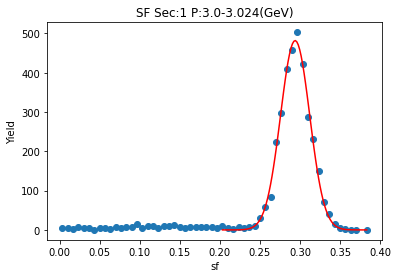

[4.76392965e+02 2.95086453e-01 1.84114260e-02]


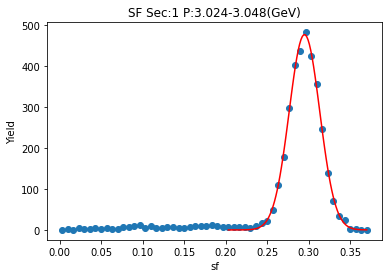

[4.66764399e+02 2.95381070e-01 1.82815588e-02]


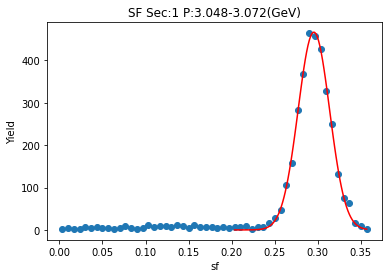

[4.52147108e+02 2.94843713e-01 1.85220503e-02]


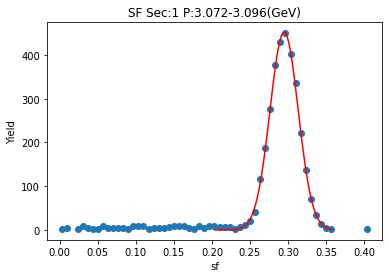

[4.57074041e+02 2.94481547e-01 1.80823996e-02]


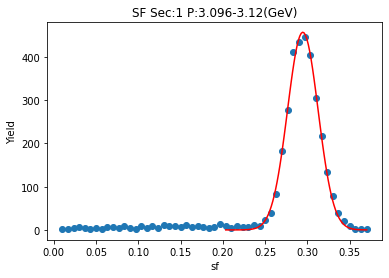

[4.41127140e+02 2.95395922e-01 1.81914124e-02]


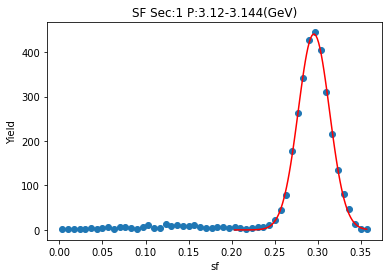

[4.35543682e+02 2.95551207e-01 1.85803852e-02]


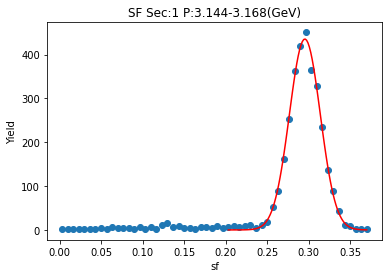

[4.18103850e+02 2.95596669e-01 1.87150234e-02]


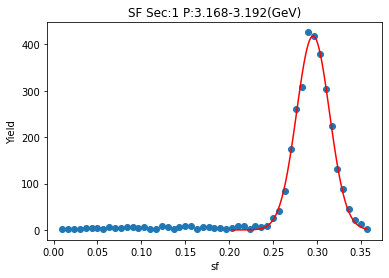

[4.08909294e+02 2.95599780e-01 1.84337472e-02]


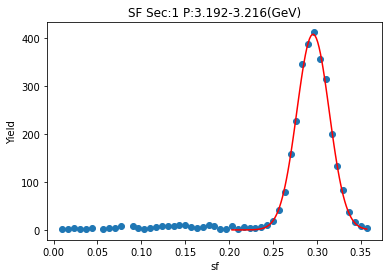

[3.89957719e+02 2.95508169e-01 1.91427086e-02]


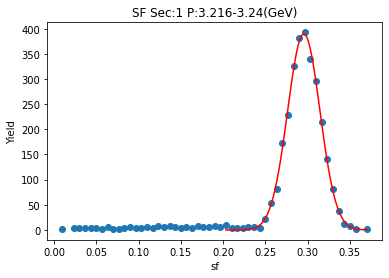

[4.03086569e+02 2.96276356e-01 1.80847962e-02]


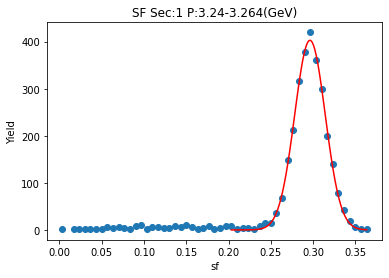

[3.83957984e+02 2.96170404e-01 1.83167464e-02]


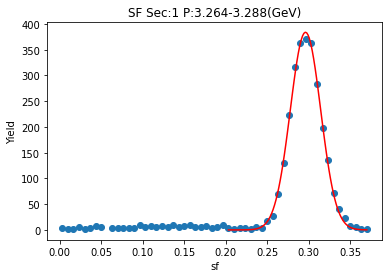

[3.62757483e+02 2.97036675e-01 1.81377805e-02]


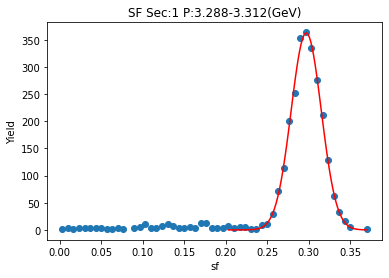

[3.66558136e+02 2.96114031e-01 1.82055255e-02]


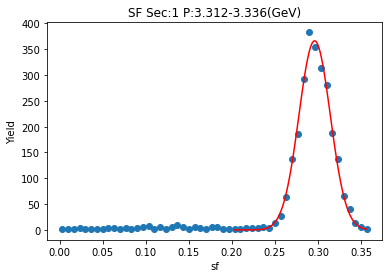

[3.41520342e+02 2.96354289e-01 1.82702784e-02]


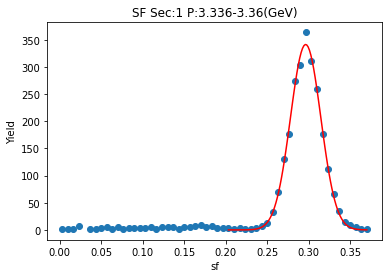

[3.27941673e+02 2.96269421e-01 1.87260809e-02]


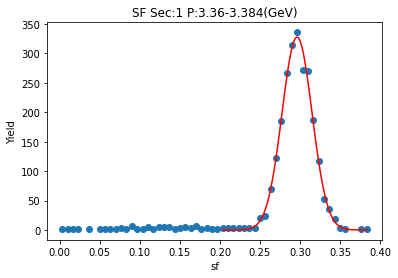

[3.12545469e+02 2.96494538e-01 1.83835800e-02]


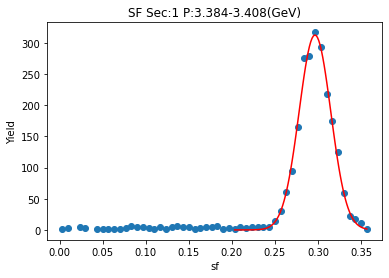

[2.85264122e+02 2.96776108e-01 1.93899315e-02]


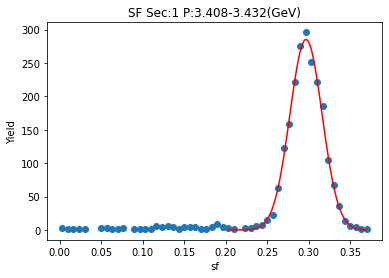

[2.87185390e+02 2.95837525e-01 1.80307170e-02]


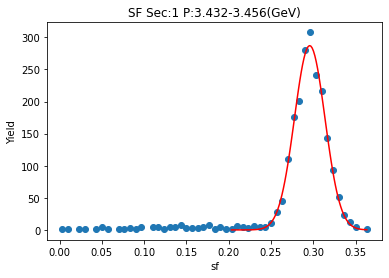

[2.65478529e+02 2.95762053e-01 1.86987840e-02]


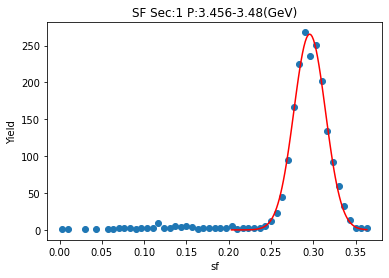

[2.49715391e+02 2.96265179e-01 1.80565577e-02]


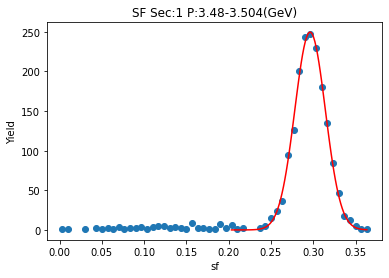

[2.18303688e+02 2.97025854e-01 1.92724261e-02]


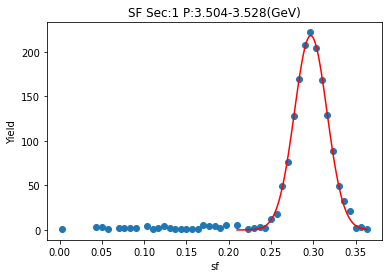

[2.04532409e+02 2.96910341e-01 1.81048082e-02]


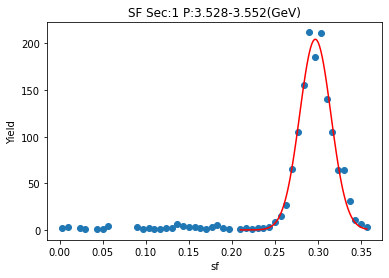

[1.80225535e+02 2.96495696e-01 1.93003412e-02]


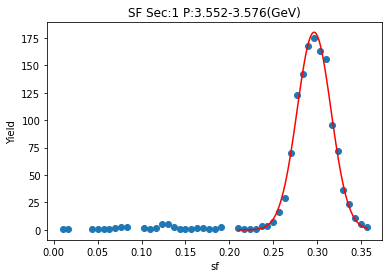

[1.74790494e+02 2.96620773e-01 1.81846149e-02]


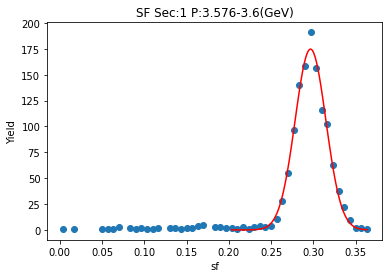

[1.57098210e+02 2.98030869e-01 1.76966681e-02]


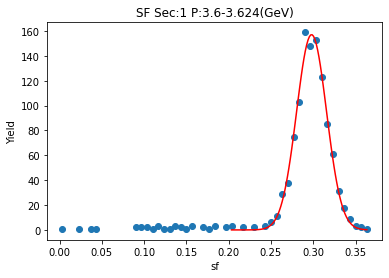

[1.47064351e+02 2.96550318e-01 1.86400197e-02]


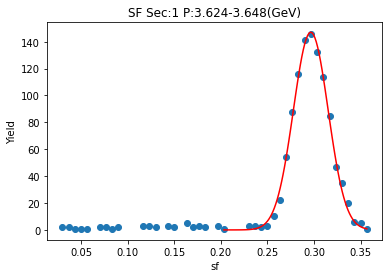

[1.29003582e+02 2.94760295e-01 1.94562580e-02]


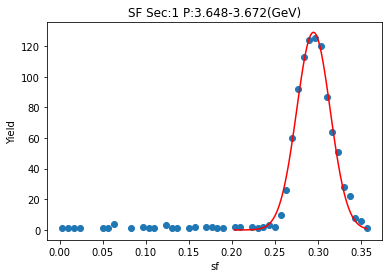

[1.31217615e+02 2.97243535e-01 1.86186161e-02]


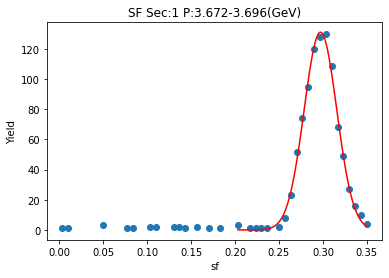

[1.13513051e+02 2.95699446e-01 1.84344672e-02]


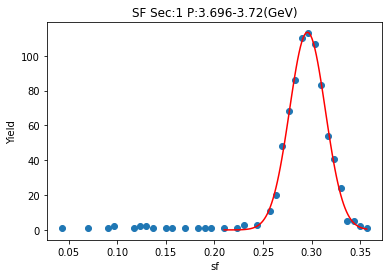

[1.02401425e+02 2.96662042e-01 1.71331656e-02]


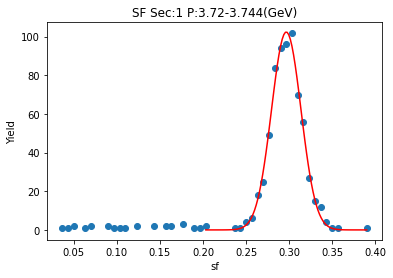

[9.38439058e+01 2.95066435e-01 1.77376307e-02]


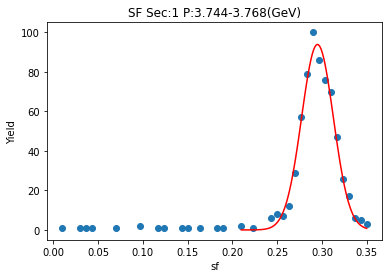

[8.40405401e+01 2.93619028e-01 1.74746367e-02]


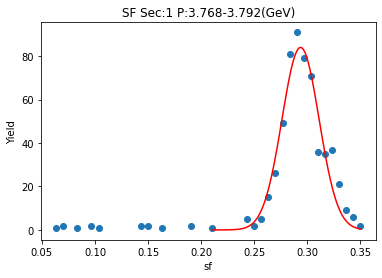

[6.49971367e+01 2.88983585e-01 3.38254372e-02]


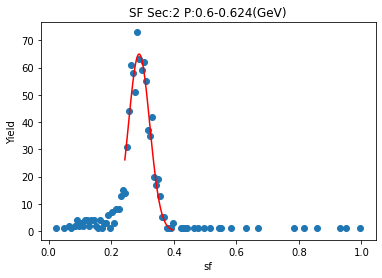

[6.51742133e+01 2.80275159e-01 4.00483938e-02]


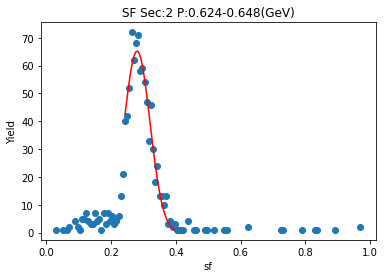

[6.65773635e+01 2.80329780e-01 4.03579384e-02]


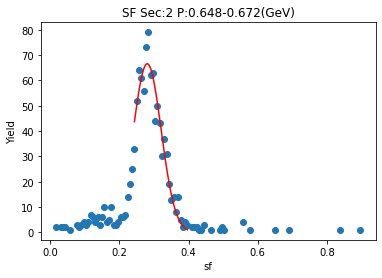

[7.57877898e+01 2.86840943e-01 3.70329874e-02]


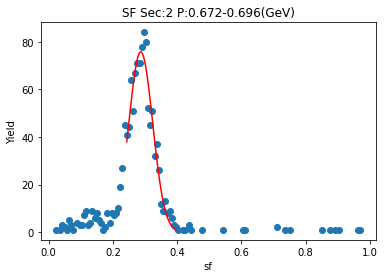

[8.25631476e+01 2.84074623e-01 3.62878152e-02]


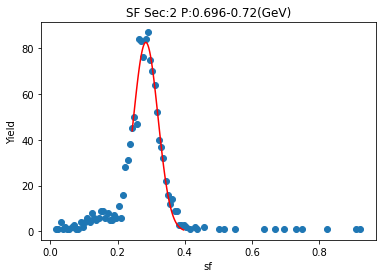

[7.80191572e+01 2.83210129e-01 3.81389764e-02]


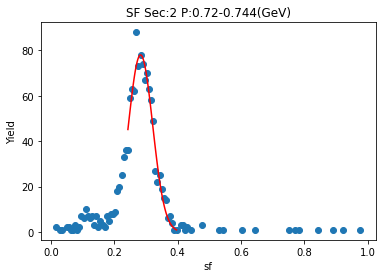

[8.23737516e+01 2.81880148e-01 3.80169301e-02]


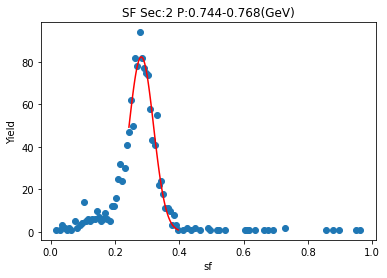

[8.49416345e+01 2.84674945e-01 3.65106539e-02]


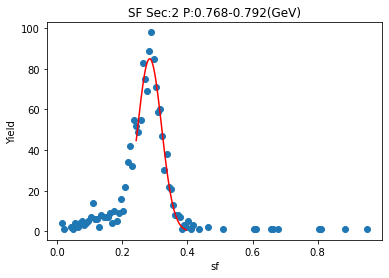

[8.20066783e+01 2.80089167e-01 3.83994290e-02]


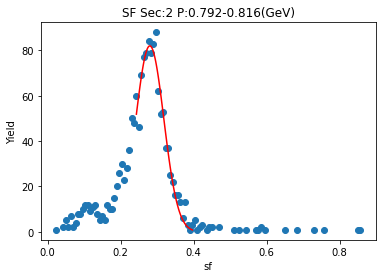

[9.47831024e+01 2.83171600e-01 3.61064040e-02]


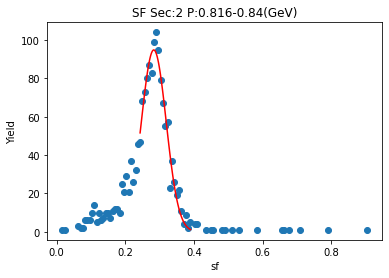

[8.68530074e+01 2.86264935e-01 3.75910836e-02]


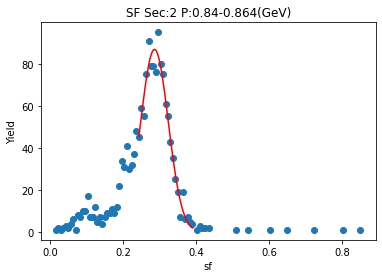

[8.71153910e+01 2.85746524e-01 3.91396285e-02]


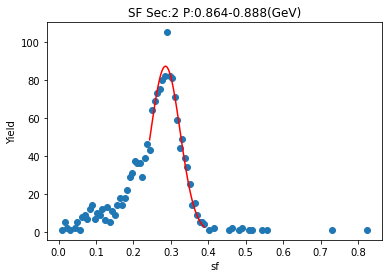

[9.15696666e+01 2.84641138e-01 3.83726493e-02]


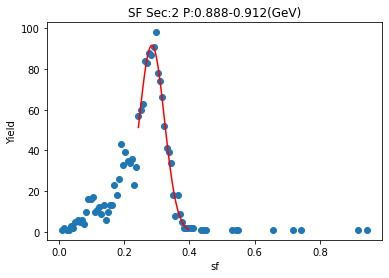

[9.75316832e+01 2.83279136e-01 3.78882392e-02]


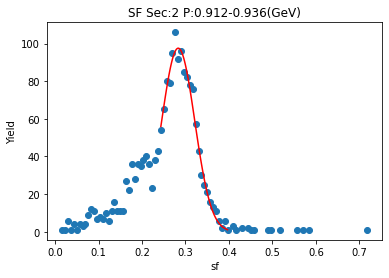

[9.60114911e+01 2.84661416e-01 3.71058780e-02]


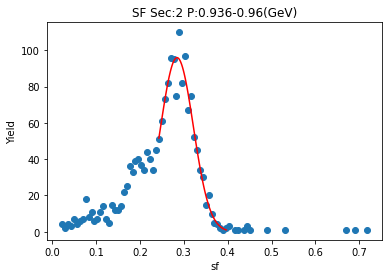

[9.94814396e+01 2.88604955e-01 3.56546993e-02]


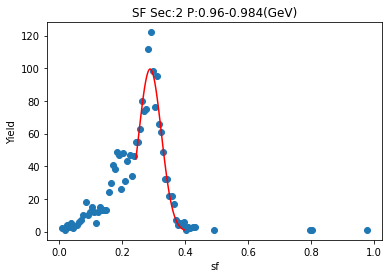

[9.67925486e+01 2.87816160e-01 3.70180645e-02]


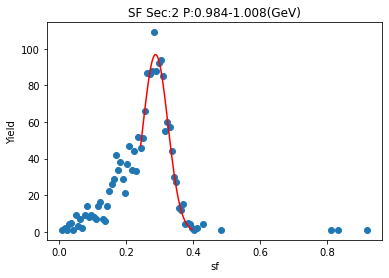

[9.94462349e+01 2.85028641e-01 4.08599838e-02]


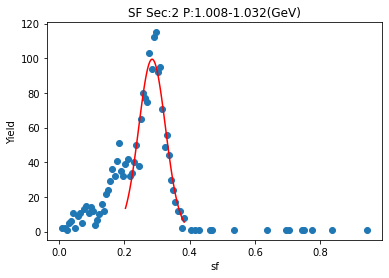

[1.04896576e+02 2.87816246e-01 3.79754728e-02]


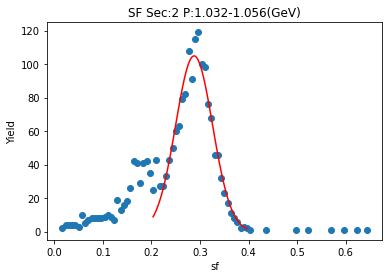

[1.09938567e+02 2.86577991e-01 3.89095592e-02]


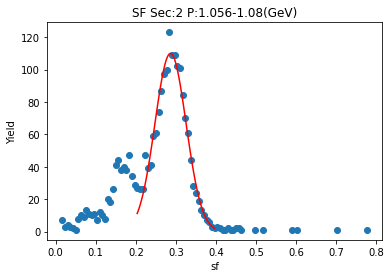

[1.02575811e+02 2.87953934e-01 3.84796640e-02]


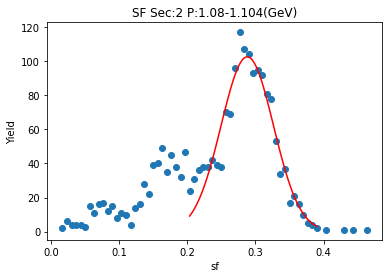

[1.12280265e+02 2.88671554e-01 3.86358011e-02]


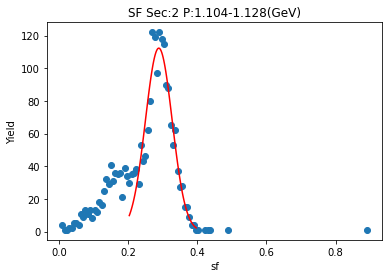

[1.08851586e+02 2.91628373e-01 3.76636638e-02]


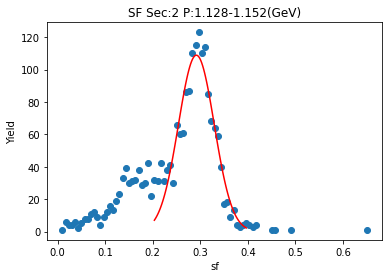

[1.17292794e+02 2.91316215e-01 3.49697400e-02]


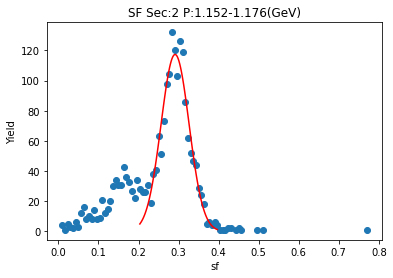

[1.09646217e+02 2.91423428e-01 3.63962000e-02]


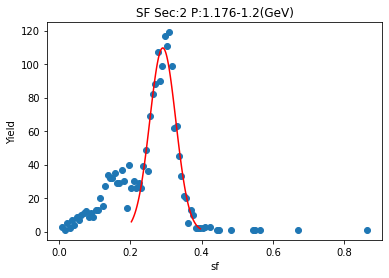

[1.19039579e+02 2.93102095e-01 3.51393499e-02]


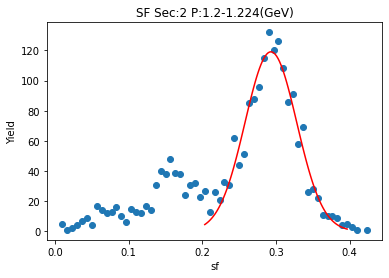

[1.15265594e+02 2.93923103e-01 3.50847078e-02]


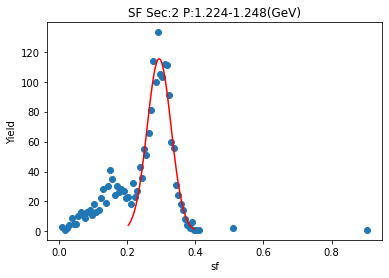

[1.15126679e+02 2.94795770e-01 3.59941297e-02]


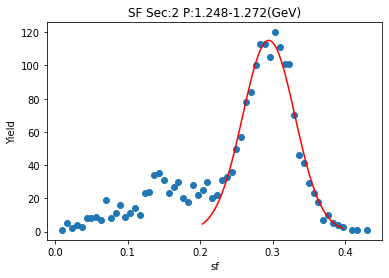

[1.14570761e+02 2.94184428e-01 3.69204301e-02]


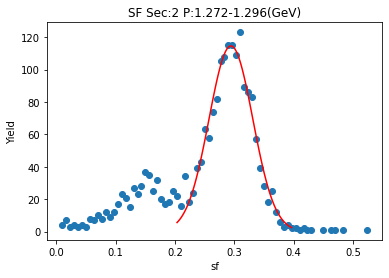

[1.16877141e+02 2.97298599e-01 3.43431829e-02]


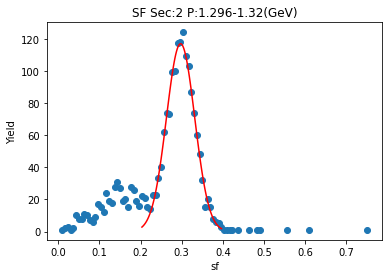

[1.28850091e+02 2.96976546e-01 3.15527479e-02]


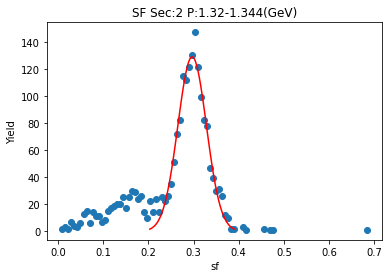

[1.15939017e+02 2.98348071e-01 3.51499984e-02]


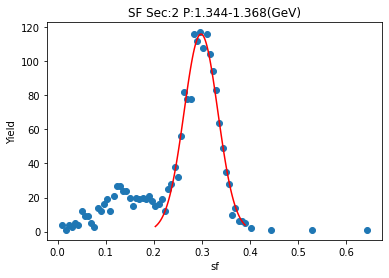

[1.35564006e+02 2.98059206e-01 3.18463002e-02]


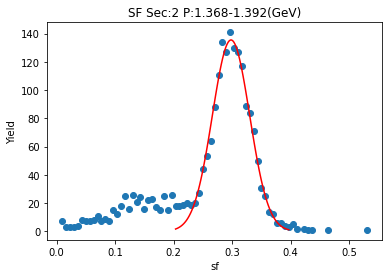

[1.18055896e+02 3.00339795e-01 3.25867441e-02]


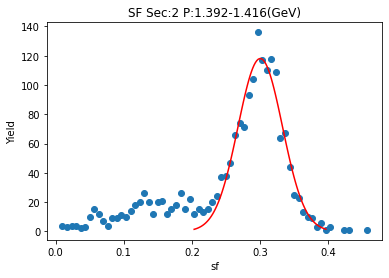

[1.33060121e+02 2.99321536e-01 3.11794091e-02]


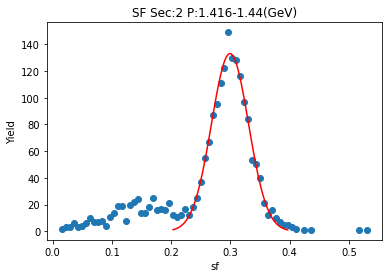

[1.28400850e+02 2.99646124e-01 3.29022489e-02]


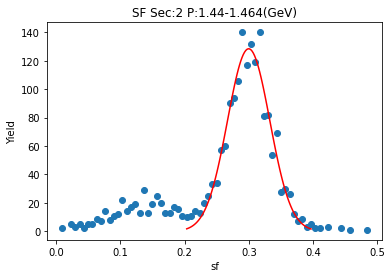

[1.30042848e+02 3.01277832e-01 3.20495509e-02]


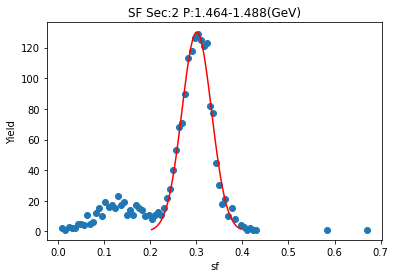

[1.35360805e+02 3.01662907e-01 3.01967751e-02]


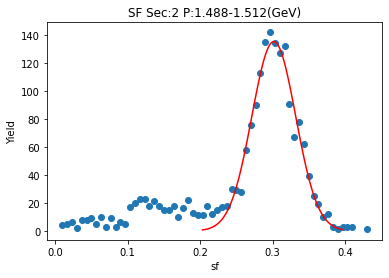

[1.39386160e+02 3.00541287e-01 3.07679897e-02]


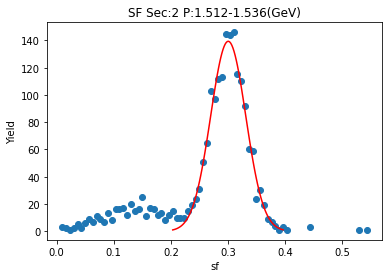

[1.39238806e+02 3.01000976e-01 3.08092463e-02]


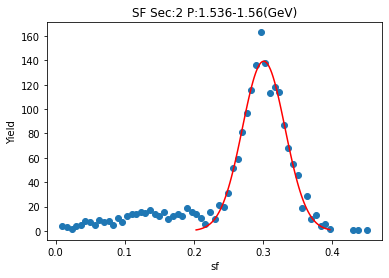

[1.45638662e+02 3.01852405e-01 2.95915482e-02]


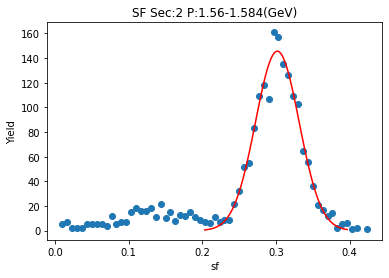

[1.34757415e+02 3.02189280e-01 3.07878977e-02]


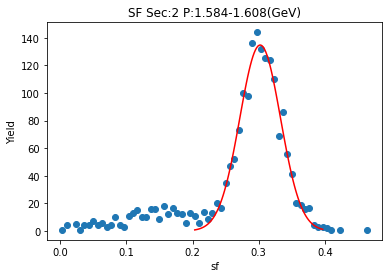

[1.48246843e+02 3.04129609e-01 2.92882514e-02]


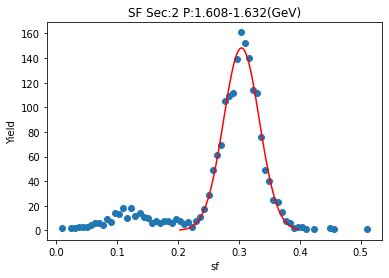

[1.54166479e+02 3.02380001e-01 2.97423971e-02]


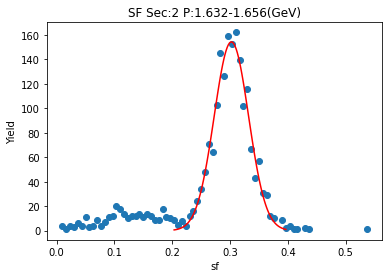

[1.45798142e+02 3.03576129e-01 3.10837619e-02]


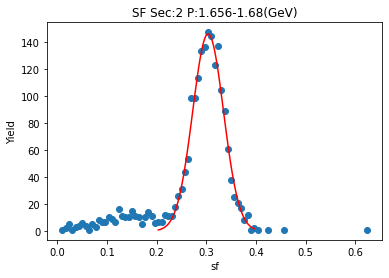

[1.53281040e+02 3.03403913e-01 3.02481719e-02]


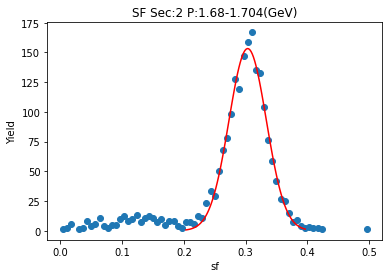

[1.58145195e+02 3.04276042e-01 2.79642423e-02]


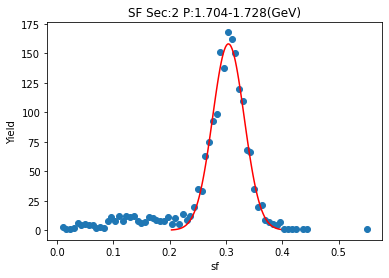

[1.44492781e+02 3.04568605e-01 3.06084991e-02]


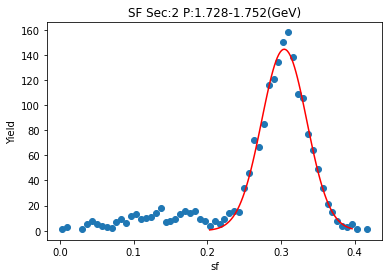

[1.59844957e+02 3.05922344e-01 2.90747092e-02]


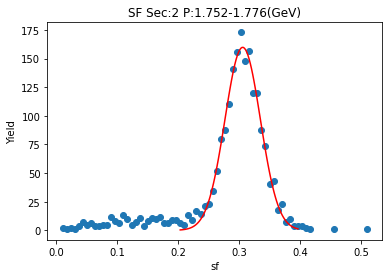

[1.63162941e+02 3.06117215e-01 2.81286483e-02]


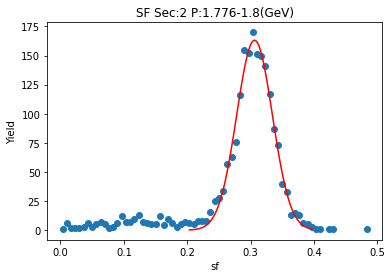

[1.58089409e+02 3.04679222e-01 2.81607332e-02]


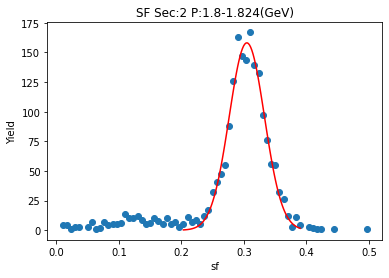

[1.64078436e+02 3.07422526e-01 2.80918680e-02]


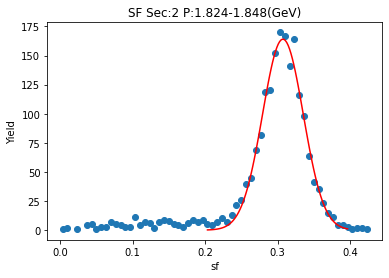

[1.61489058e+02 3.07214819e-01 2.90039282e-02]


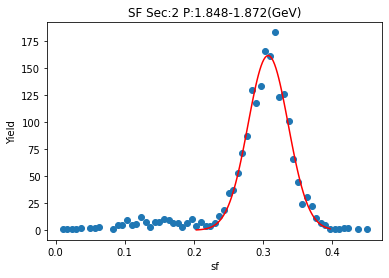

[1.75434093e+02 3.06978347e-01 2.76329173e-02]


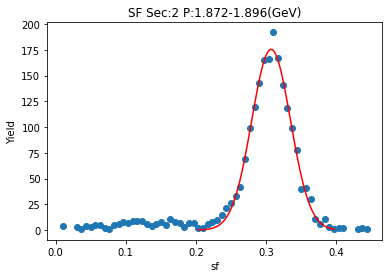

[1.73533024e+02 3.08640505e-01 2.76923007e-02]


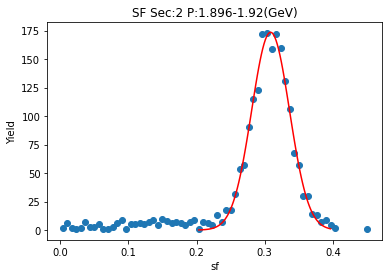

[1.78995032e+02 3.06863249e-01 2.72306851e-02]


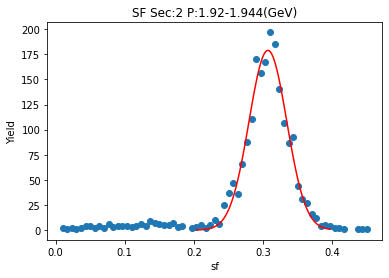

[1.78939927e+02 3.06733073e-01 2.67075575e-02]


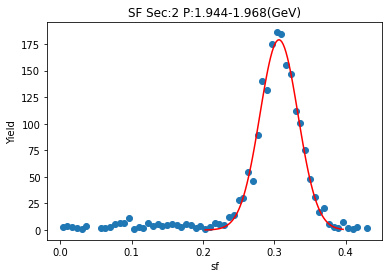

[1.83674665e+02 3.08101448e-01 2.69320614e-02]


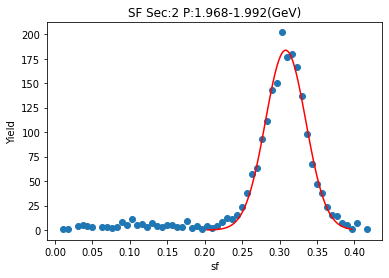

[1.90113438e+02 3.08231698e-01 2.57507688e-02]


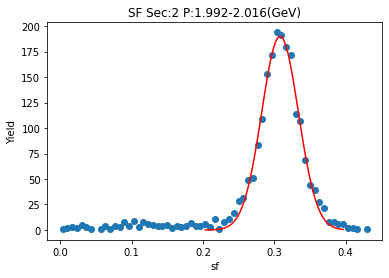

[1.83129813e+02 3.09437474e-01 2.75068579e-02]


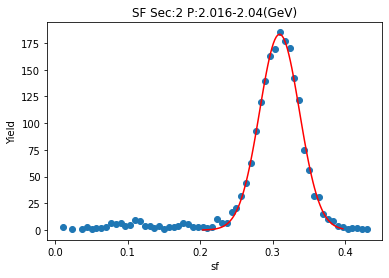

[1.97715138e+02 3.07696667e-01 2.64242385e-02]


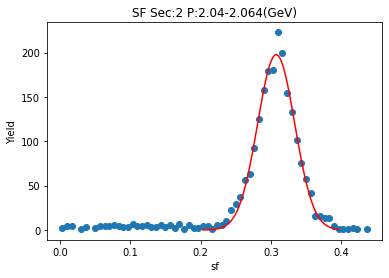

[1.86827861e+02 3.08826554e-01 2.72154891e-02]


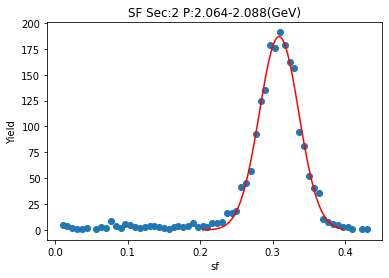

[1.82333332e+02 3.10967964e-01 2.76368614e-02]


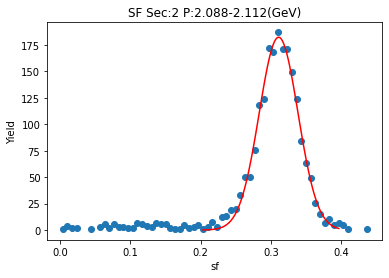

[1.85389565e+02 3.11045372e-01 2.77084697e-02]


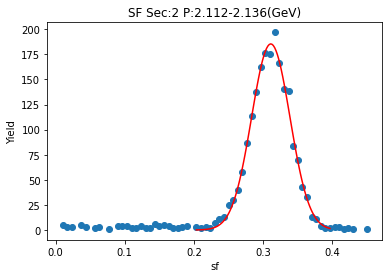

[1.91559223e+02 3.10617417e-01 2.61483388e-02]


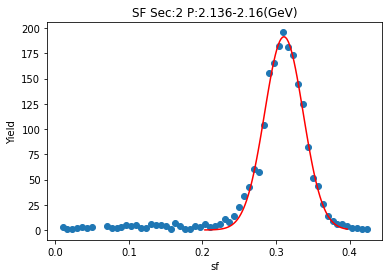

[1.87008517e+02 3.10988789e-01 2.67031279e-02]


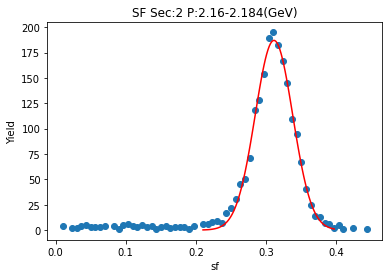

[2.02474816e+02 3.10486821e-01 2.50960279e-02]


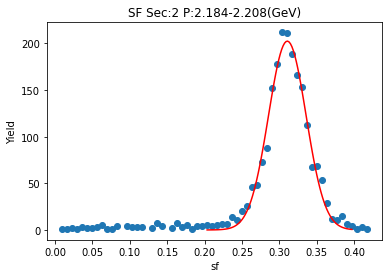

[2.04483688e+02 3.12221517e-01 2.58671974e-02]


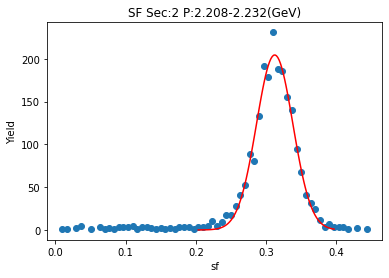

[2.15690963e+02 3.10205000e-01 2.52587050e-02]


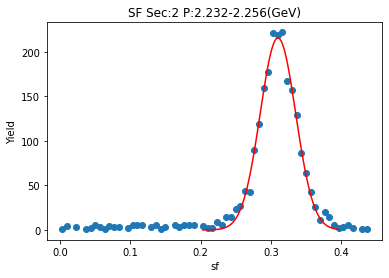

[2.16520576e+02 3.10582849e-01 2.49747914e-02]


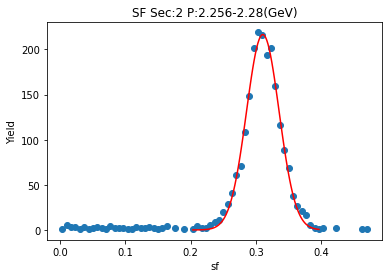

[2.05067351e+02 3.10934413e-01 2.51057132e-02]


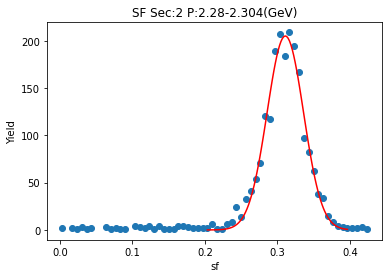

[2.12085673e+02 3.12855720e-01 2.55006063e-02]


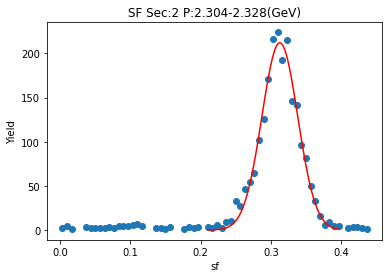

[2.07764492e+02 3.12152679e-01 2.47551324e-02]


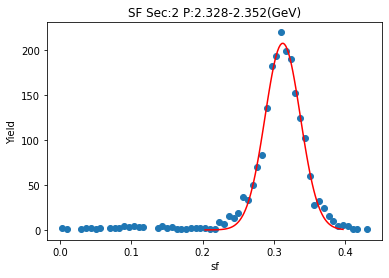

[2.13218689e+02 3.12148750e-01 2.48557346e-02]


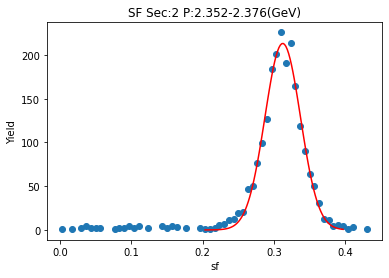

[2.22853623e+02 3.12386433e-01 2.44048546e-02]


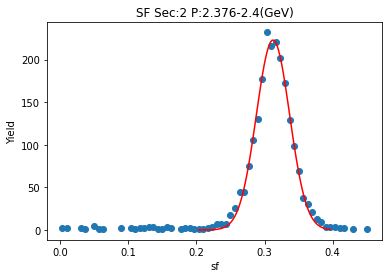

[2.20059449e+02 3.14180592e-01 2.47342968e-02]


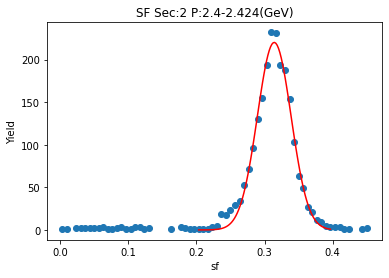

[2.28613285e+02 3.12155533e-01 2.43455471e-02]


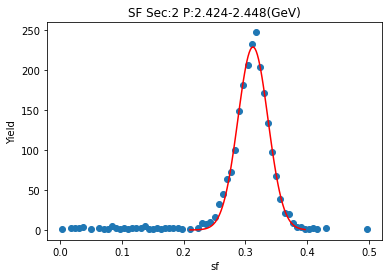

[2.23950274e+02 3.13783623e-01 2.43433293e-02]


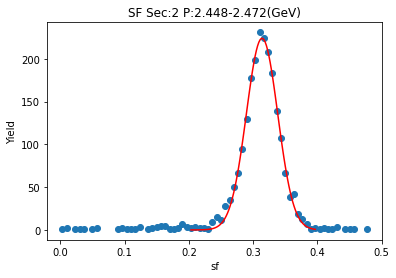

[2.31595454e+02 3.12591070e-01 2.34255407e-02]


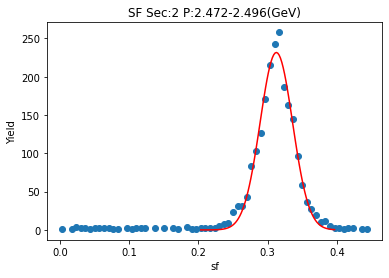

[2.23681335e+02 3.13778325e-01 2.37262176e-02]


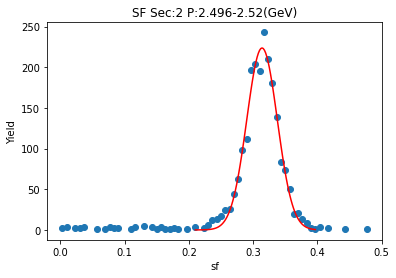

[2.28330094e+02 3.14056545e-01 2.36992106e-02]


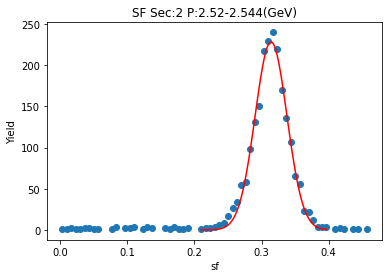

[2.29255618e+02 3.14510161e-01 2.24613640e-02]


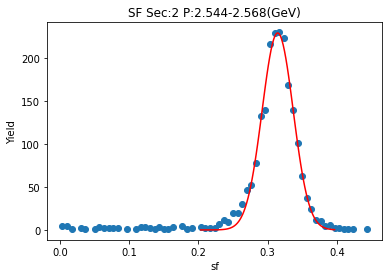

[2.25966612e+02 3.13420804e-01 2.36706715e-02]


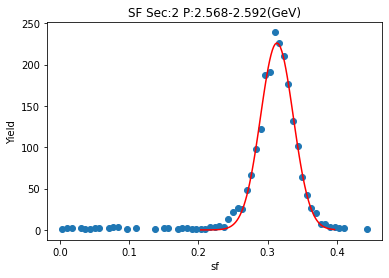

[2.19915732e+02 3.15403632e-01 2.35701413e-02]


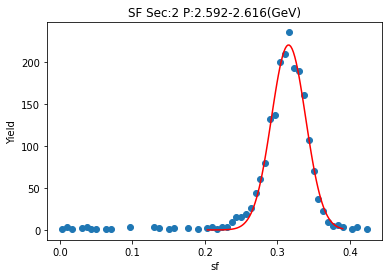

[2.28410013e+02 3.14088210e-01 2.32581039e-02]


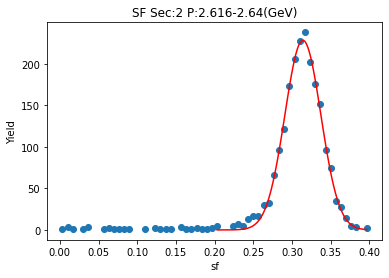

[2.35667152e+02 3.13971140e-01 2.25226297e-02]


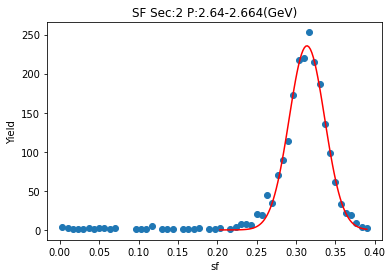

[2.10399310e+02 3.13689899e-01 2.42100239e-02]


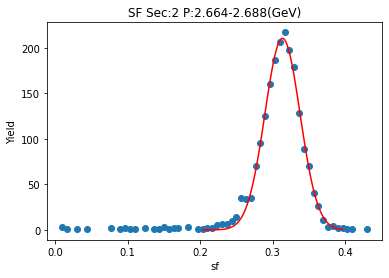

[2.17912839e+02 3.15478759e-01 2.31467813e-02]


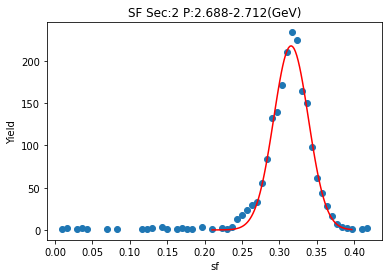

[2.40533981e+02 3.15338523e-01 2.18118865e-02]


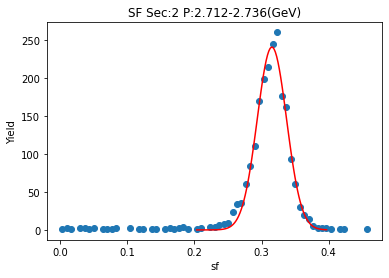

[2.23966258e+02 3.15614864e-01 2.25726956e-02]


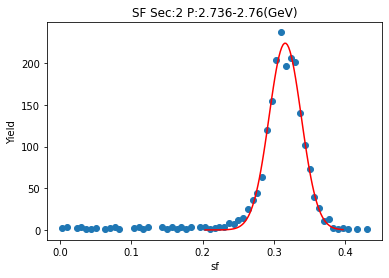

[2.18938814e+02 3.16389942e-01 2.28443892e-02]


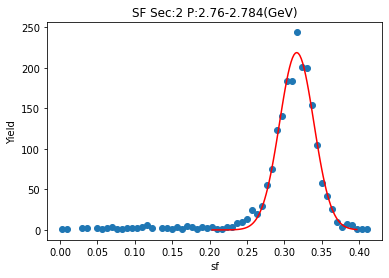

[2.23589190e+02 3.16163731e-01 2.21909859e-02]


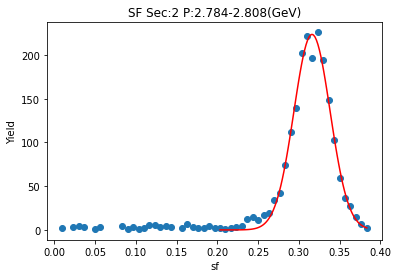

[2.06776402e+02 3.15144033e-01 2.23969338e-02]


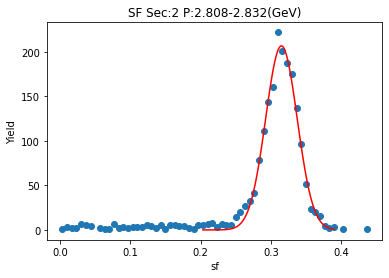

[2.24702460e+02 3.14678443e-01 2.11320673e-02]


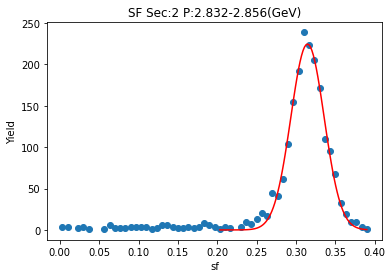

[2.15486372e+02 3.16221190e-01 2.27385004e-02]


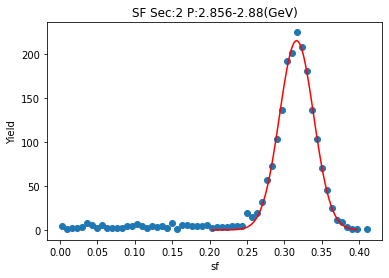

[2.17696166e+02 3.16481687e-01 2.13235074e-02]


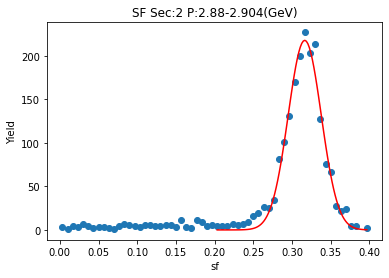

[2.10427387e+02 3.15436056e-01 2.17065872e-02]


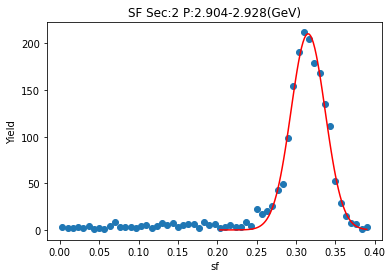

[2.06286194e+02 3.17364421e-01 2.12894989e-02]


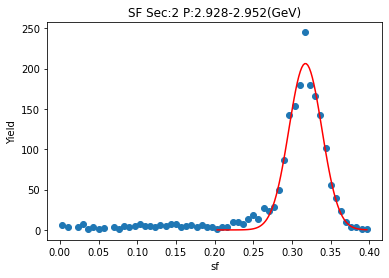

[2.04860878e+02 3.16148954e-01 2.18762324e-02]


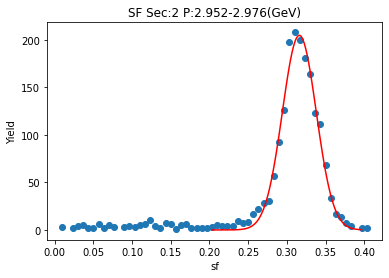

[2.08989216e+02 3.17220773e-01 2.05005111e-02]


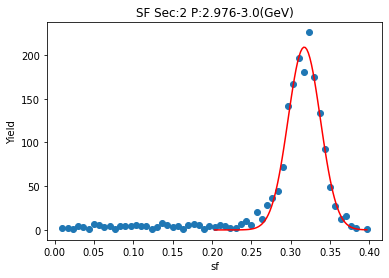

[1.88783832e+02 3.16514924e-01 2.16723176e-02]


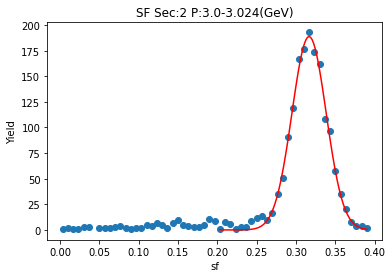

[1.97280931e+02 3.17973247e-01 2.11036913e-02]


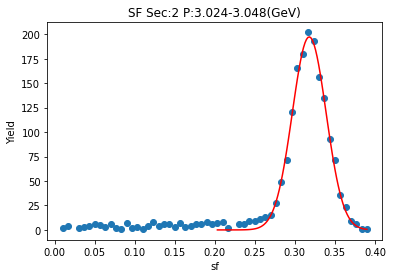

[1.91610682e+02 3.18730066e-01 2.13284699e-02]


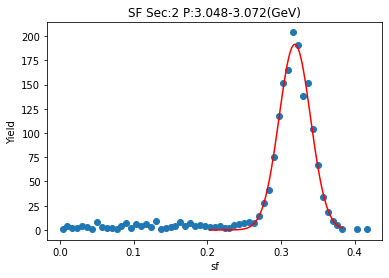

[1.88150669e+02 3.17230971e-01 2.09773761e-02]


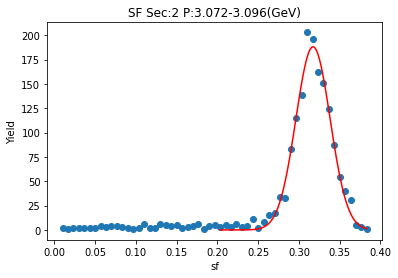

[1.89706905e+02 3.17735374e-01 2.03356888e-02]


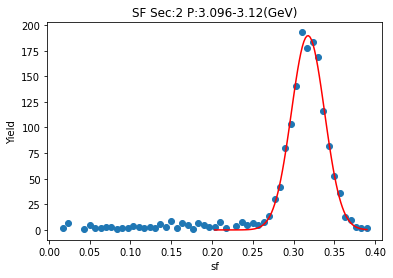

[1.74572582e+02 3.16657258e-01 2.02915683e-02]


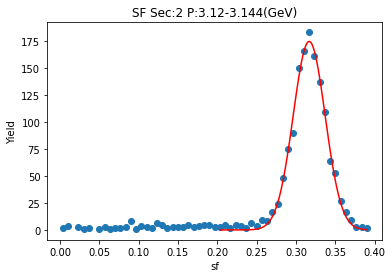

[1.71911678e+02 3.17918423e-01 2.08648501e-02]


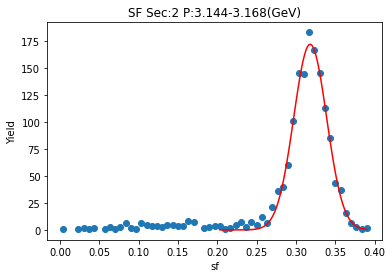

[1.66076315e+02 3.18194372e-01 2.04019817e-02]


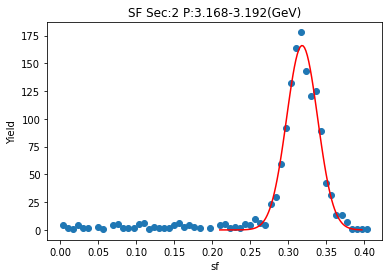

[1.56559893e+02 3.19330791e-01 2.07196622e-02]


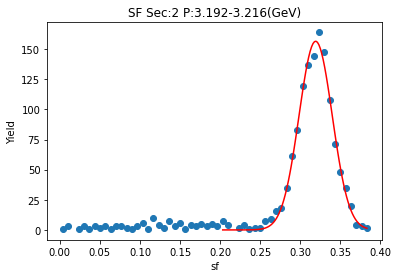

[1.65458358e+02 3.17288812e-01 1.98063671e-02]


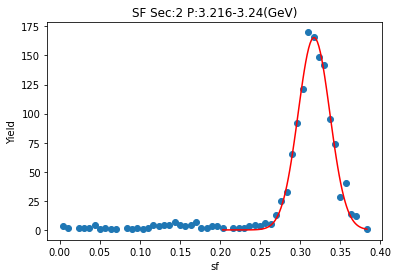

[1.41452689e+02 3.19510706e-01 2.12439398e-02]


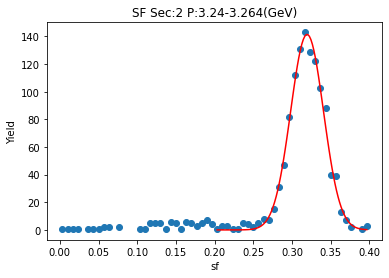

[1.39324326e+02 3.19228865e-01 2.10924177e-02]


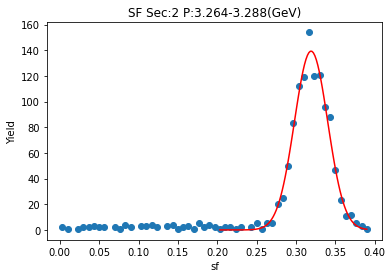

[1.40989195e+02 3.17563042e-01 1.90997805e-02]


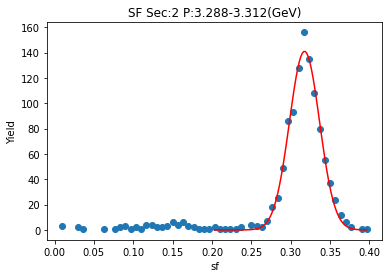

[1.34401072e+02 3.19097133e-01 2.00444094e-02]


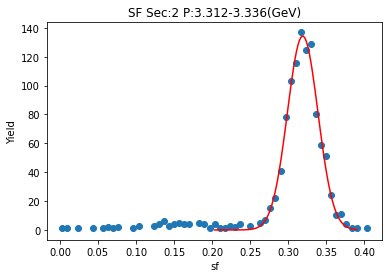

[1.23470192e+02 3.18600257e-01 2.00177978e-02]


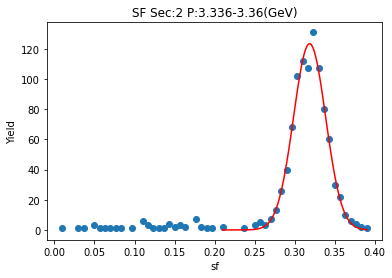

[1.09598569e+02 3.20158432e-01 2.13733720e-02]


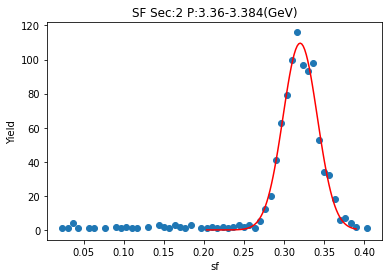

[1.18166694e+02 3.19389433e-01 2.00077999e-02]


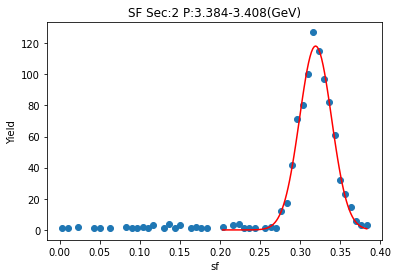

[1.02333481e+02 3.20708750e-01 2.13950223e-02]


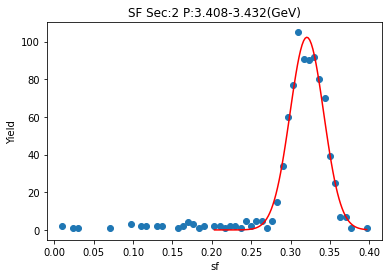

[1.04506089e+02 3.19588294e-01 1.94886599e-02]


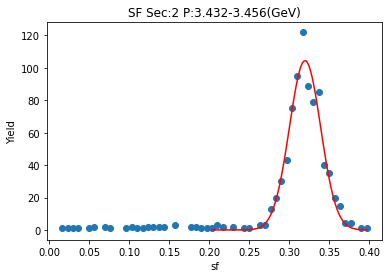

[9.21957521e+01 3.22066832e-01 2.12102522e-02]


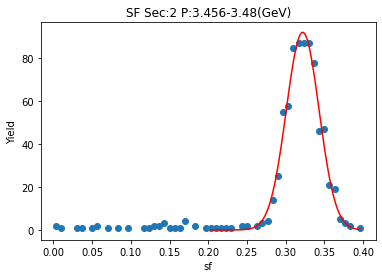

[9.08441762e+01 3.21927214e-01 1.78705482e-02]


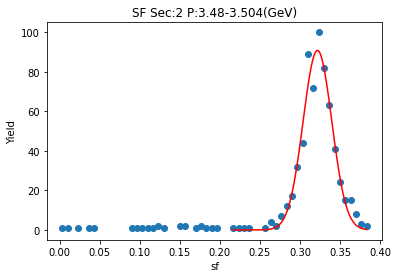

[7.47827653e+01 3.22713635e-01 2.06829473e-02]


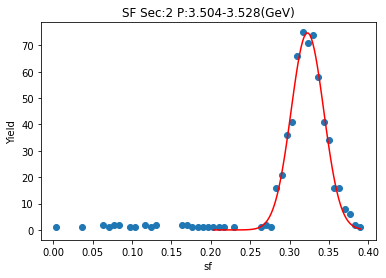

[6.15029655e+01 3.23696125e-01 2.24753352e-02]


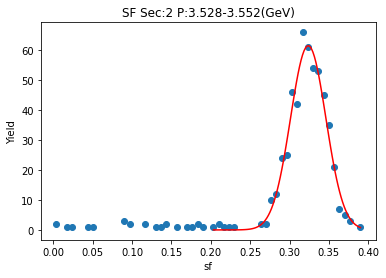

[6.93206762e+01 3.21395473e-01 1.94968507e-02]


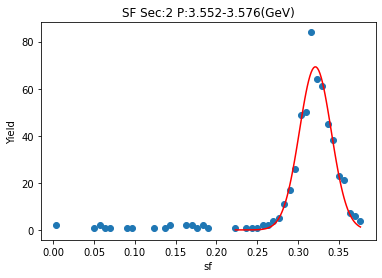

[6.18479092e+01 2.88007668e-01 2.59104542e-02]


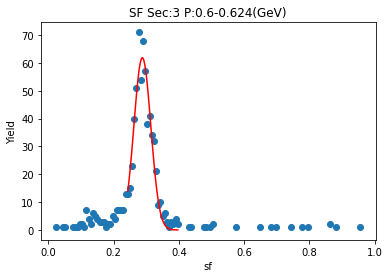

[6.79219525e+01 2.85063454e-01 2.82976514e-02]


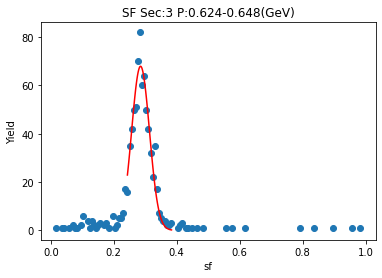

[7.54830601e+01 2.80008079e-01 2.98903569e-02]


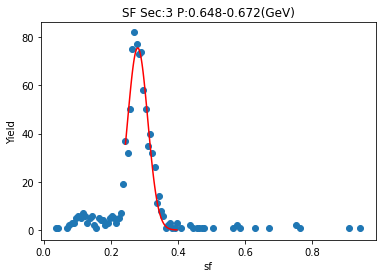

[7.43285398e+01 2.76408878e-01 3.47186548e-02]


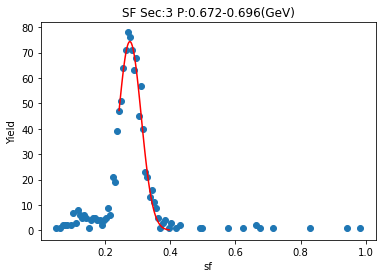

[7.91467234e+01 2.76143949e-01 3.35466901e-02]


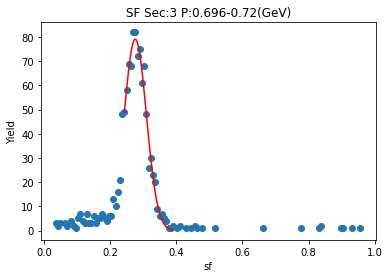

[8.32938432e+01 2.78555659e-01 3.53210681e-02]


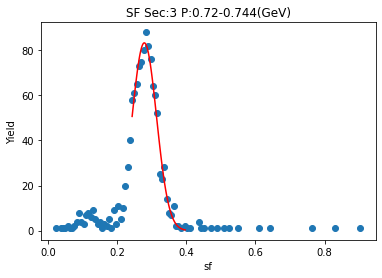

[8.61276637e+01 2.77273166e-01 3.53694259e-02]


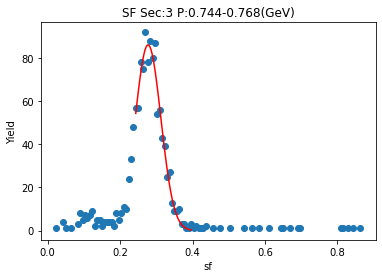

[8.89081590e+01 2.80832299e-01 3.05372787e-02]


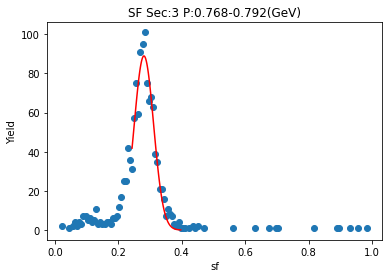

[9.16402700e+01 2.76824432e-01 3.22630292e-02]


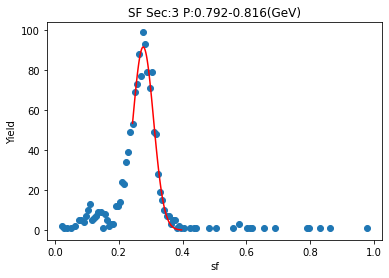

[9.25901640e+01 2.79990294e-01 3.43431456e-02]


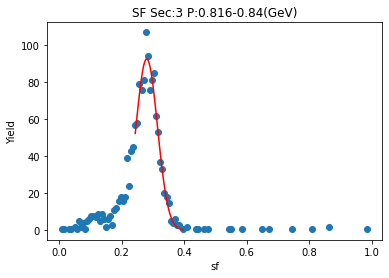

[1.04928635e+02 2.81617412e-01 2.98610548e-02]


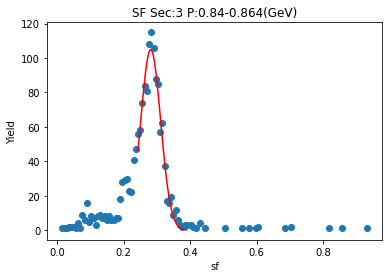

[1.05253995e+02 2.78673510e-01 3.27414056e-02]


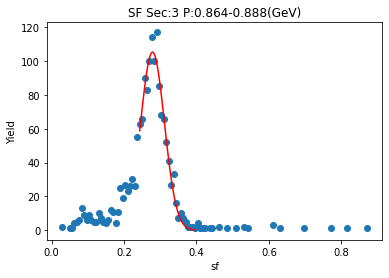

[1.03348943e+02 2.80764446e-01 3.20476890e-02]


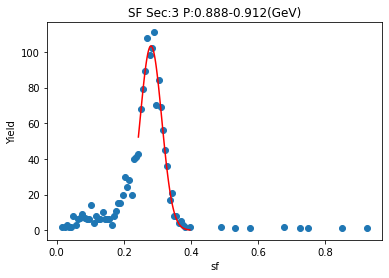

[1.03121559e+02 2.81006044e-01 3.40555457e-02]


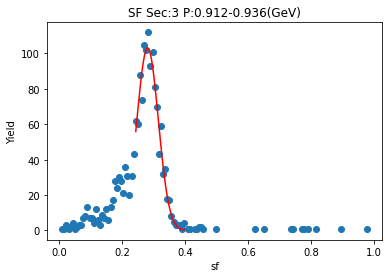

[1.09636219e+02 2.82779501e-01 3.13234961e-02]


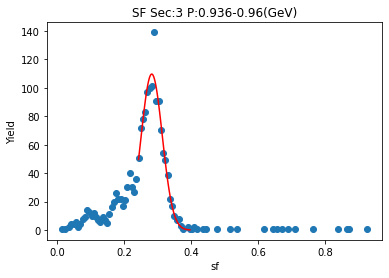

[1.22369278e+02 2.82243022e-01 3.04254761e-02]


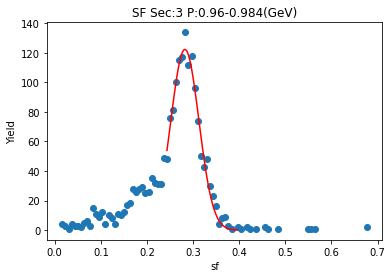

[1.25481241e+02 2.86256758e-01 3.01190227e-02]


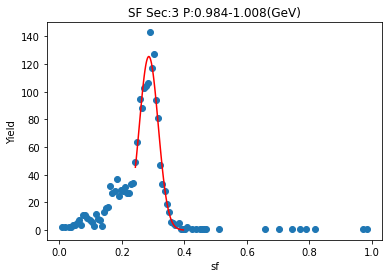

[1.19841167e+02 2.83406450e-01 3.23316125e-02]


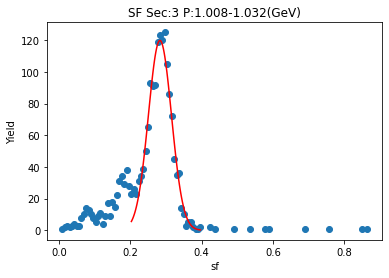

[1.17041981e+02 2.83504626e-01 3.35710505e-02]


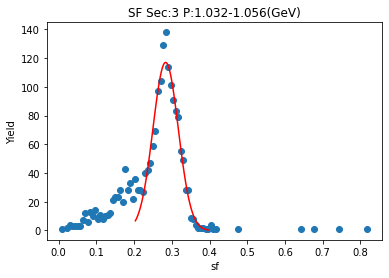

[1.29797847e+02 2.84568989e-01 3.16099427e-02]


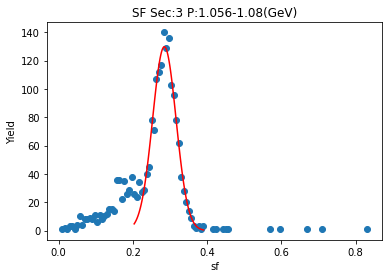

[1.41364997e+02 2.84333829e-01 2.94811114e-02]


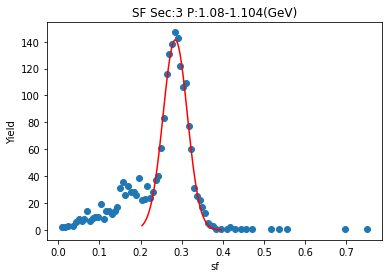

[1.39006418e+02 2.85907961e-01 3.05856778e-02]


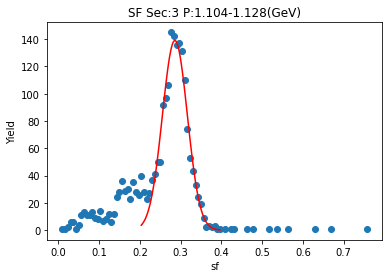

[1.27610173e+02 2.88798573e-01 3.08030933e-02]


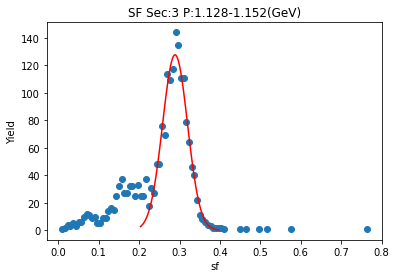

[1.48870265e+02 2.88053475e-01 2.81323791e-02]


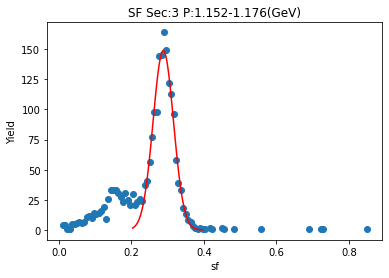

[1.52329173e+02 2.87002505e-01 2.83377724e-02]


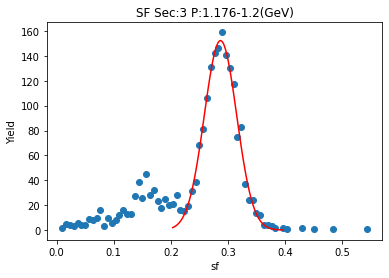

[1.37473599e+02 2.88345945e-01 3.10976340e-02]


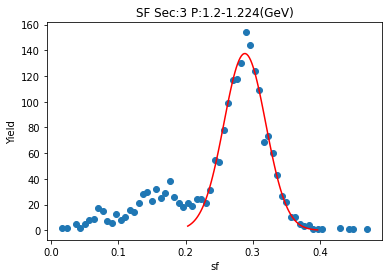

[1.51442579e+02 2.91240150e-01 2.75999529e-02]


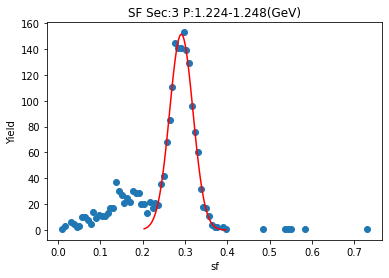

[1.58336519e+02 2.90557737e-01 2.76868196e-02]


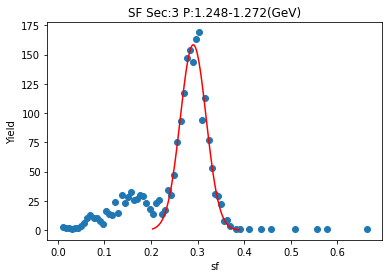

[1.57584631e+02 2.91038040e-01 2.79173511e-02]


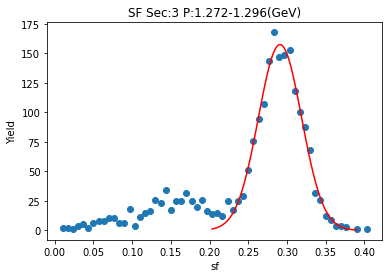

[1.64222361e+02 2.91583436e-01 2.67145688e-02]


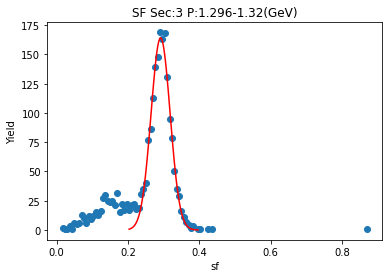

[1.67899678e+02 2.94123919e-01 2.58115855e-02]


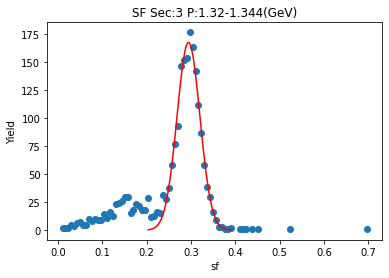

[1.72736617e+02 2.93566553e-01 2.49208536e-02]


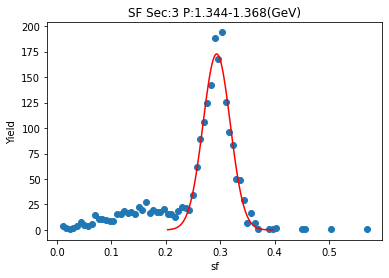

[1.72232792e+02 2.92692746e-01 2.61434748e-02]


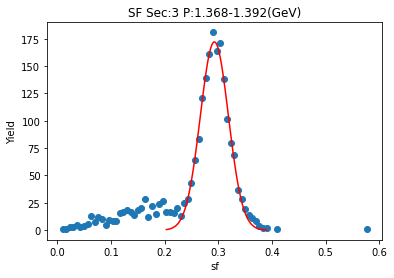

[1.86358376e+02 2.93662625e-01 2.55962716e-02]


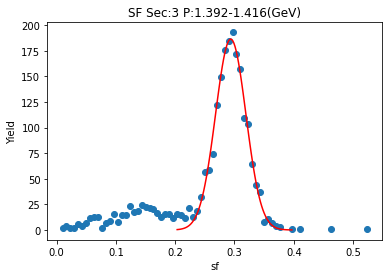

[1.91124386e+02 2.93835156e-01 2.53866700e-02]


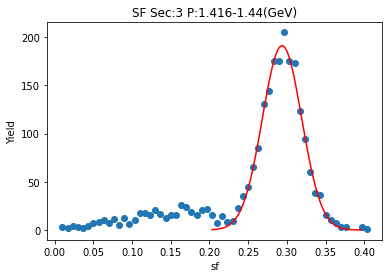

[1.74404250e+02 2.94590303e-01 2.55748737e-02]


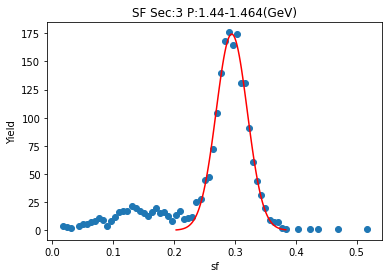

[1.91761977e+02 2.96200602e-01 2.52717912e-02]


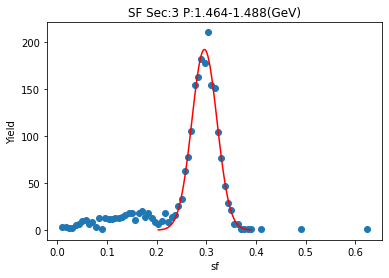

[1.94723771e+02 2.95342481e-01 2.48394015e-02]


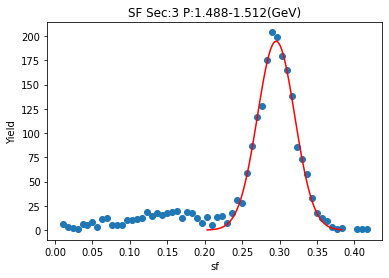

[2.09503954e+02 2.95953820e-01 2.27231911e-02]


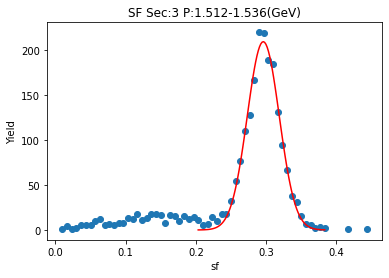

[2.00714209e+02 2.96925331e-01 2.44420632e-02]


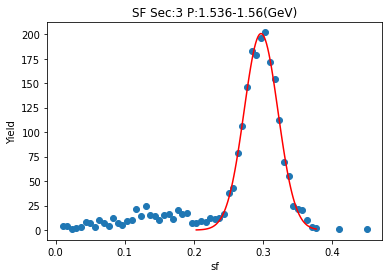

[2.16184994e+02 2.97901837e-01 2.27530536e-02]


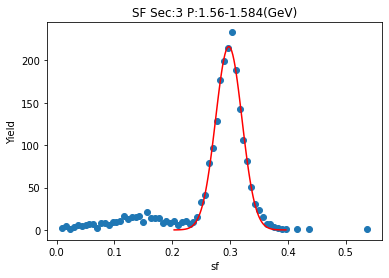

[2.01918615e+02 2.98512243e-01 2.47464240e-02]


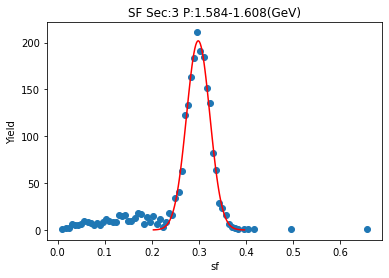

[2.15062909e+02 2.98082677e-01 2.40259645e-02]


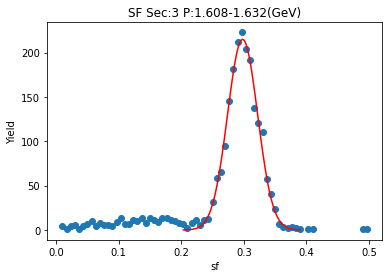

[2.32606361e+02 2.98054283e-01 2.27765852e-02]


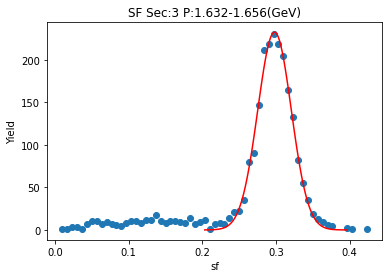

[2.30075140e+02 2.99805344e-01 2.35218989e-02]


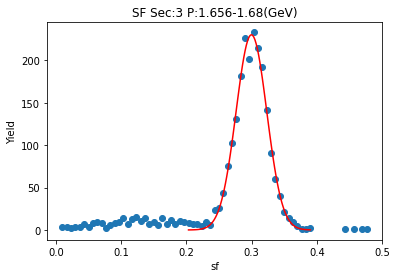

[2.26932342e+02 2.99380864e-01 2.32774235e-02]


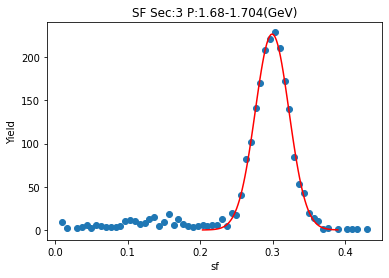

[2.37302731e+02 2.99985021e-01 2.29842045e-02]


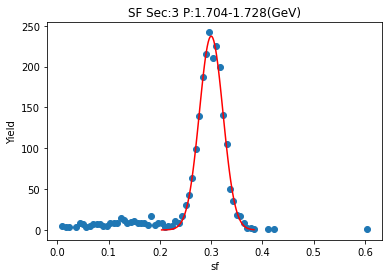

[2.31025138e+02 3.00427374e-01 2.33027959e-02]


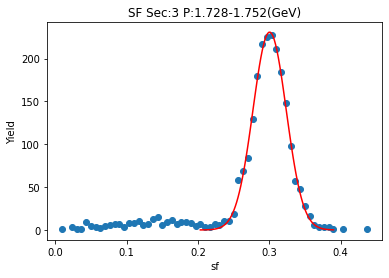

[2.39249057e+02 3.00956886e-01 2.22547962e-02]


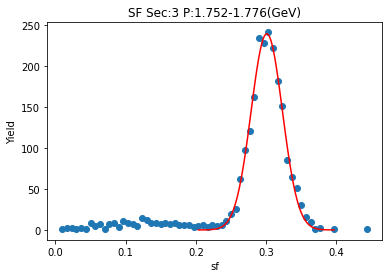

[2.39895784e+02 3.02427929e-01 2.32686169e-02]


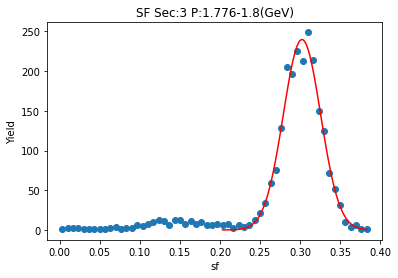

[2.53928653e+02 3.01842508e-01 2.23306811e-02]


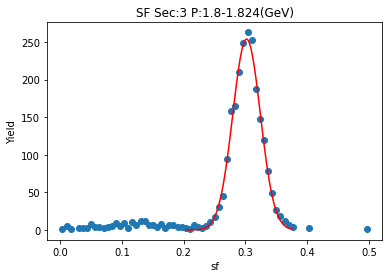

[2.74418887e+02 3.02309179e-01 2.17024170e-02]


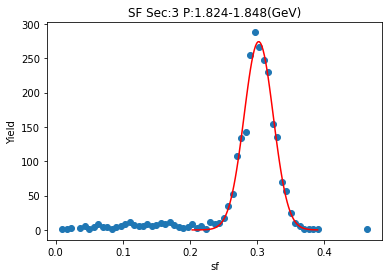

[2.61731526e+02 3.01322032e-01 2.13397747e-02]


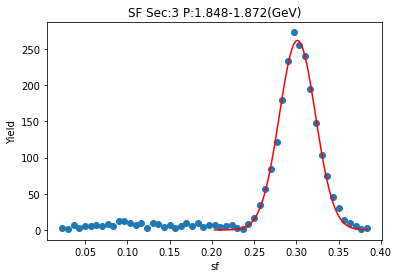

[2.70820149e+02 3.02414362e-01 2.17904086e-02]


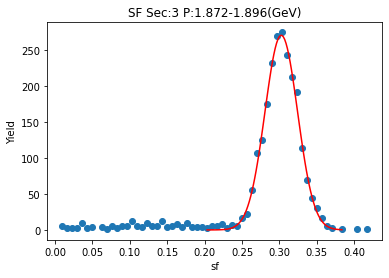

[2.72546982e+02 3.03250524e-01 2.19667027e-02]


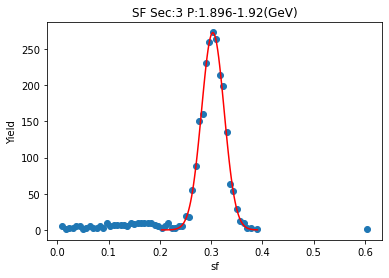

[2.70425796e+02 3.03553440e-01 2.19205965e-02]


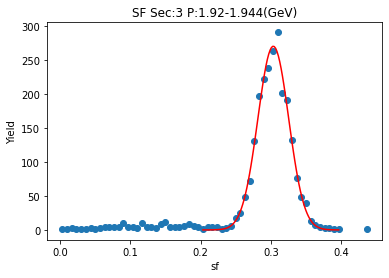

[2.86167191e+02 3.04434873e-01 2.13339064e-02]


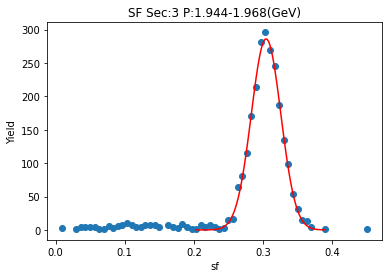

[2.83868348e+02 3.03116259e-01 2.17730329e-02]


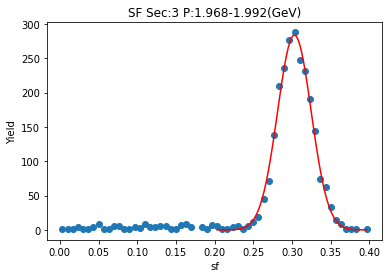

[2.83811071e+02 3.04991560e-01 2.17291320e-02]


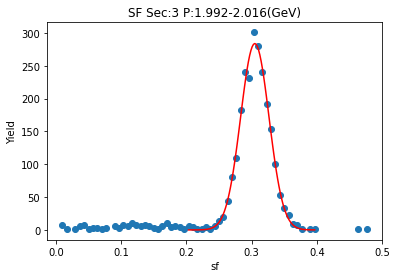

[3.08309858e+02 3.04191966e-01 2.13592101e-02]


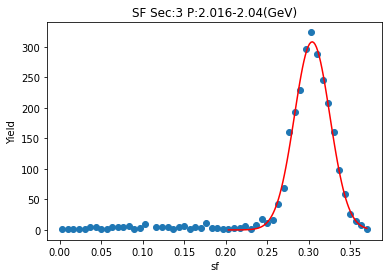

[2.98845363e+02 3.04743402e-01 2.13520822e-02]


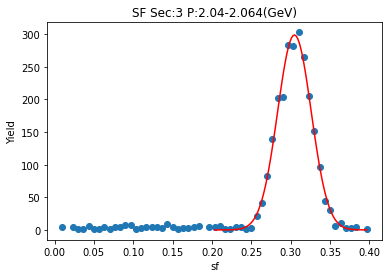

[3.11987634e+02 3.06067873e-01 2.04274186e-02]


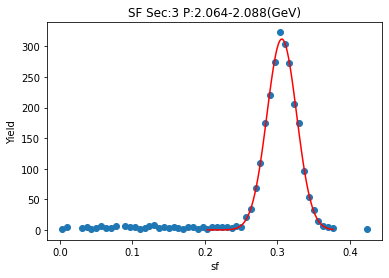

[3.12555643e+02 3.06647628e-01 2.11822544e-02]


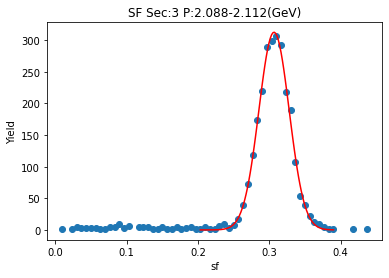

[3.20950531e+02 3.05979250e-01 2.08498435e-02]


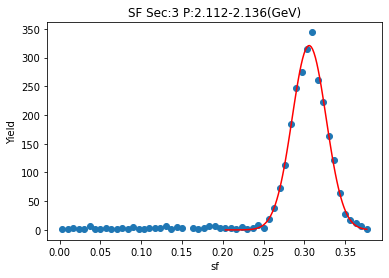

[3.08623031e+02 3.06025814e-01 2.14621675e-02]


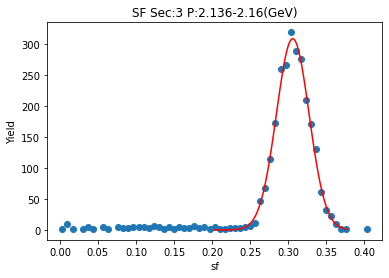

[3.25137343e+02 3.07222528e-01 2.08391535e-02]


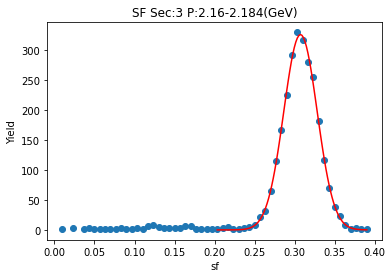

[3.31674367e+02 3.07319782e-01 2.13034006e-02]


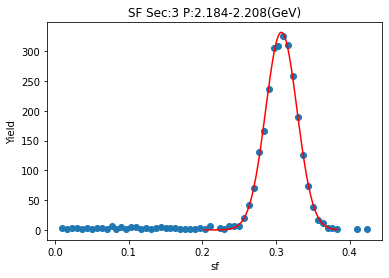

[3.21571215e+02 3.07283703e-01 2.10661666e-02]


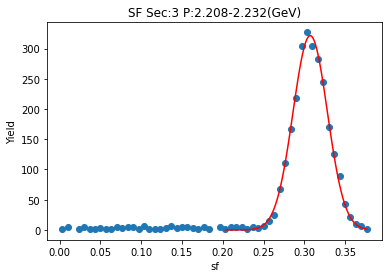

[3.37235882e+02 3.07009317e-01 2.09244018e-02]


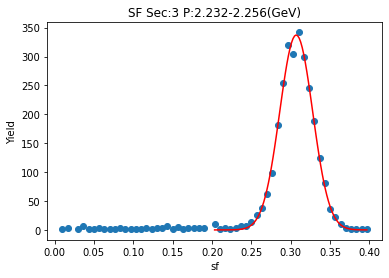

[3.41116032e+02 3.07783793e-01 2.10740047e-02]


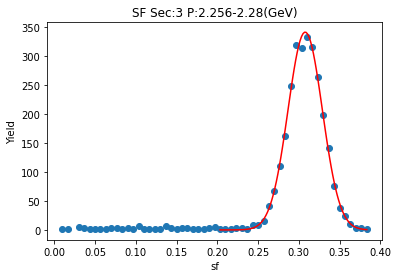

[3.39968039e+02 3.07122352e-01 2.09377591e-02]


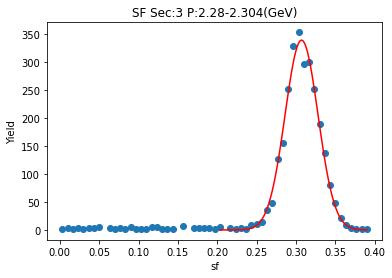

[3.59602516e+02 3.08882635e-01 2.01292980e-02]


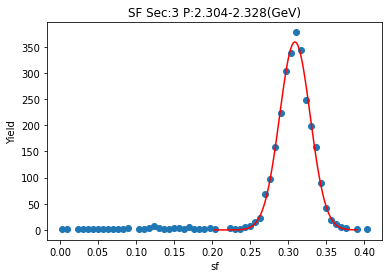

[3.62602861e+02 3.07286910e-01 1.92531042e-02]


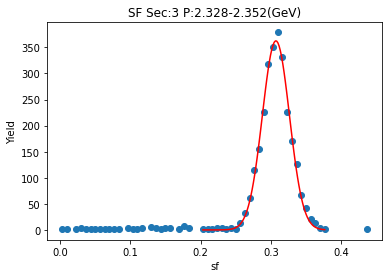

[3.61846480e+02 3.08374187e-01 2.01598648e-02]


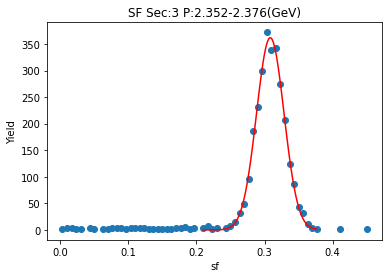

[3.79433428e+02 3.08992117e-01 1.91332137e-02]


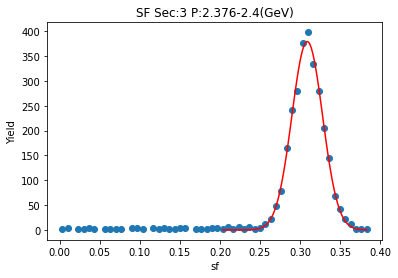

[3.55566384e+02 3.09502096e-01 2.02561738e-02]


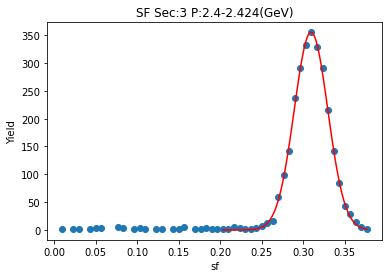

[3.62981381e+02 3.08546902e-01 1.97073837e-02]


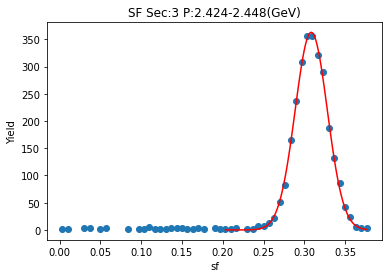

[3.61899420e+02 3.09688224e-01 1.98110455e-02]


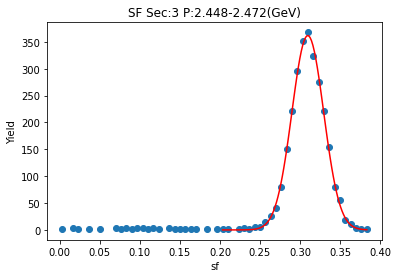

[3.77344098e+02 3.10851854e-01 1.93074856e-02]


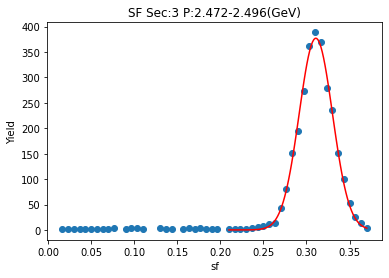

[3.90410605e+02 3.10326588e-01 1.94113776e-02]


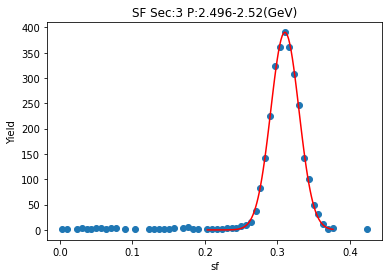

[3.80423785e+02 3.11042316e-01 1.96952454e-02]


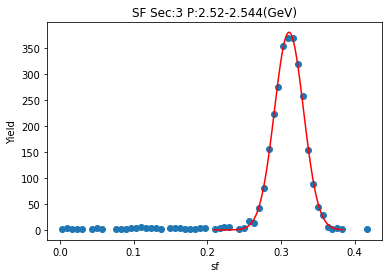

[3.72350687e+02 3.11786385e-01 1.95154248e-02]


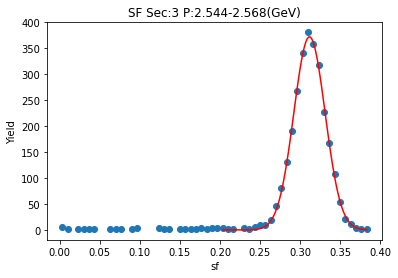

[3.78613357e+02 3.10570331e-01 1.91439105e-02]


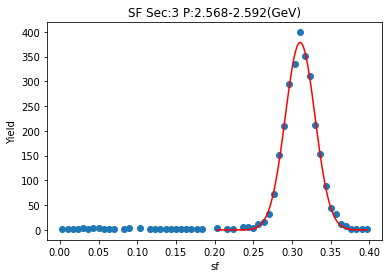

[3.72692039e+02 3.12114045e-01 1.90654791e-02]


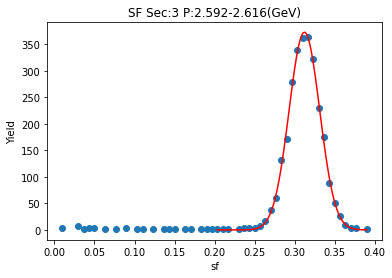

[3.96562354e+02 3.11432199e-01 1.90184505e-02]


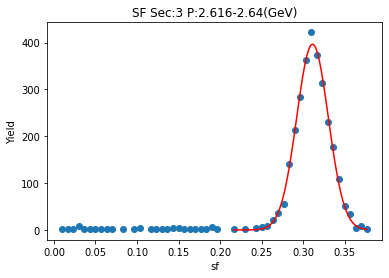

[4.00485038e+02 3.12328014e-01 1.92391980e-02]


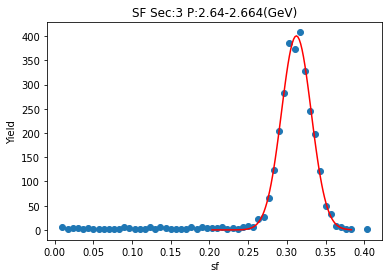

[4.04688592e+02 3.12505870e-01 1.86891781e-02]


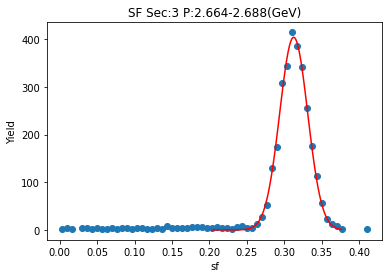

[3.87186653e+02 3.12508303e-01 1.88376531e-02]


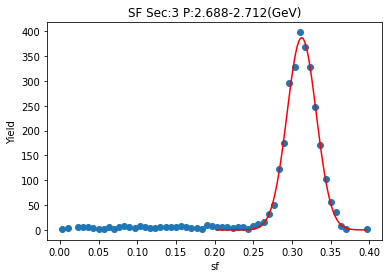

[3.68289067e+02 3.12641827e-01 1.93956640e-02]


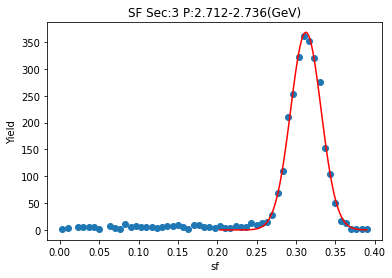

[3.92568490e+02 3.13093830e-01 1.84441217e-02]


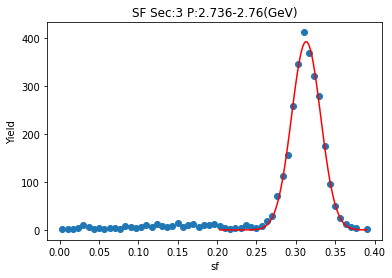

[4.02065570e+02 3.13154355e-01 1.84186299e-02]


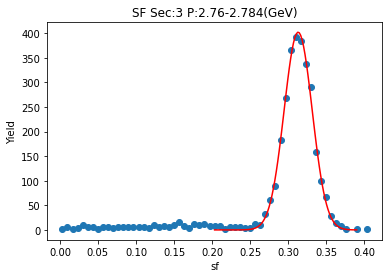

[3.96403276e+02 3.13532253e-01 1.88510846e-02]


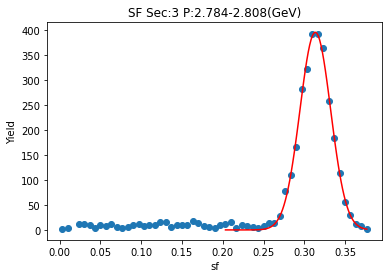

[3.99470909e+02 3.13264895e-01 1.87952214e-02]


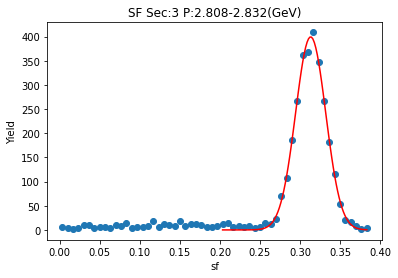

[4.01890002e+02 3.12989662e-01 1.88505443e-02]


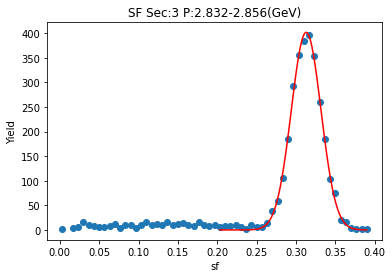

[4.13686867e+02 3.13309732e-01 1.82464927e-02]


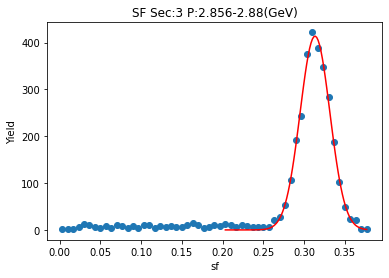

[3.65715614e+02 3.13472088e-01 1.85555383e-02]


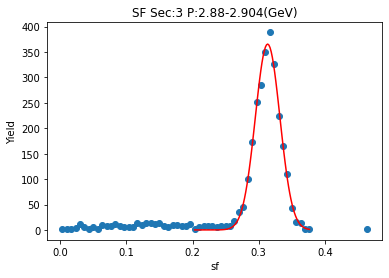

[3.92318256e+02 3.14123812e-01 1.83443337e-02]


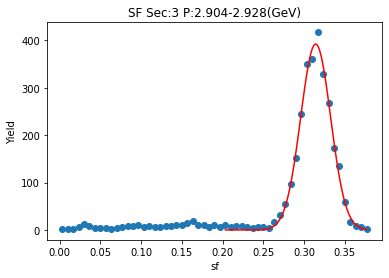

[3.89401378e+02 3.13880163e-01 1.84554794e-02]


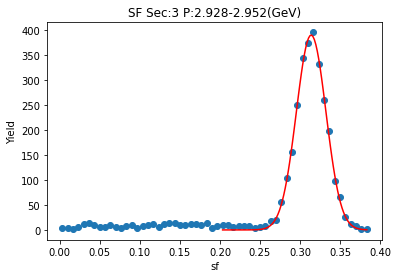

[3.78481216e+02 3.13932500e-01 1.82121685e-02]


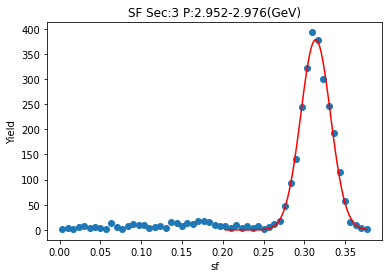

[3.89486606e+02 3.13968703e-01 1.80393990e-02]


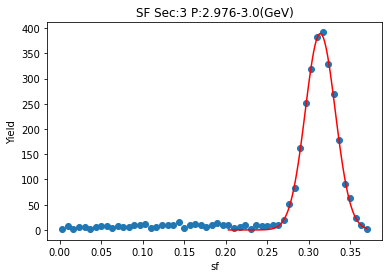

[3.82857851e+02 3.14838395e-01 1.79052077e-02]


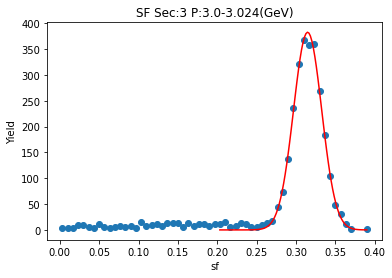

[3.84710766e+02 3.14669898e-01 1.78110080e-02]


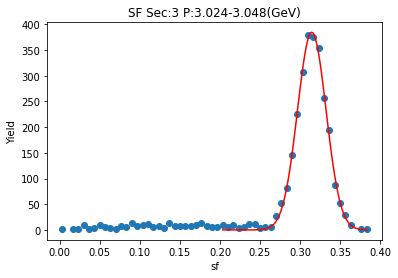

[3.80423316e+02 3.15417142e-01 1.77191583e-02]


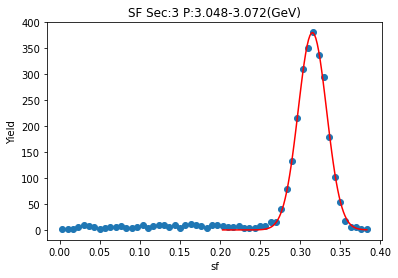

[3.65728799e+02 3.14975566e-01 1.80539519e-02]


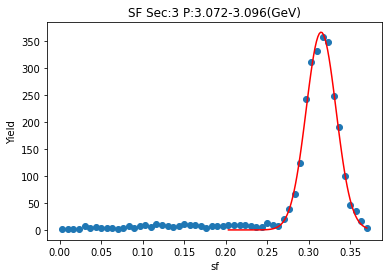

[3.66532866e+02 3.14770933e-01 1.78585462e-02]


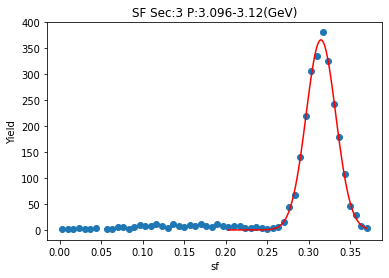

[3.61726693e+02 3.14762562e-01 1.76933483e-02]


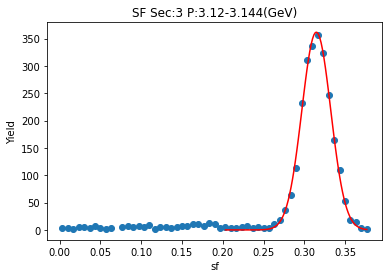

[3.57253639e+02 3.15011469e-01 1.73765279e-02]


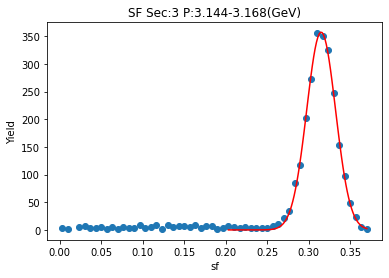

[3.31567843e+02 3.15230898e-01 1.78197436e-02]


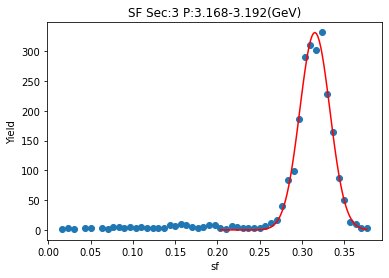

[3.49550478e+02 3.15135740e-01 1.66881623e-02]


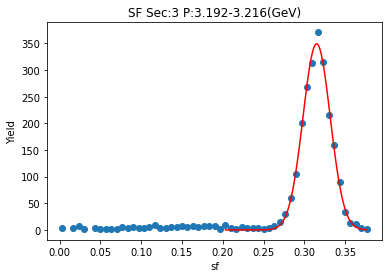

[3.30991365e+02 3.15433304e-01 1.72762440e-02]


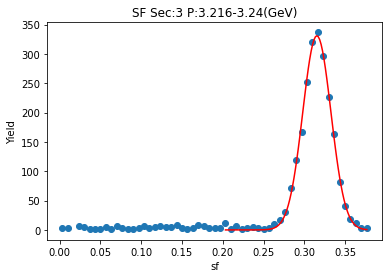

[3.02691241e+02 3.15522586e-01 1.78361919e-02]


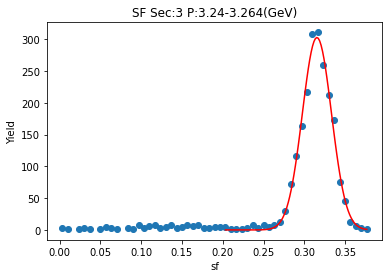

[3.15074366e+02 3.14715318e-01 1.66063114e-02]


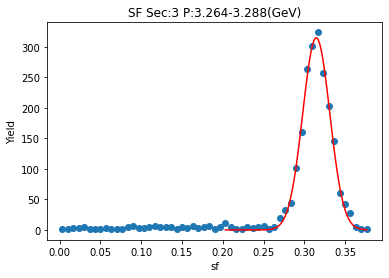

[3.03478884e+02 3.14307692e-01 1.72684553e-02]


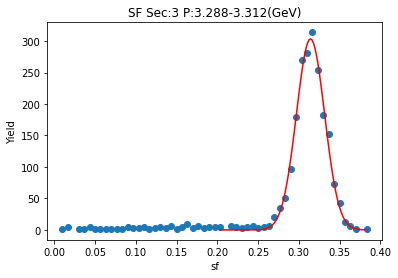

[2.85661518e+02 3.14922817e-01 1.75412285e-02]


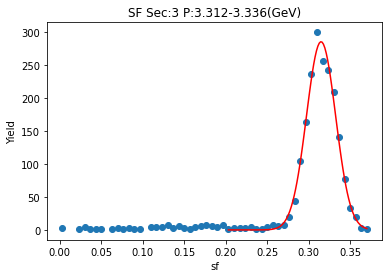

[2.80008315e+02 3.15542988e-01 1.71406744e-02]


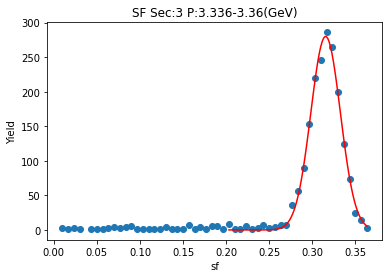

[2.63767992e+02 3.15176921e-01 1.73144921e-02]


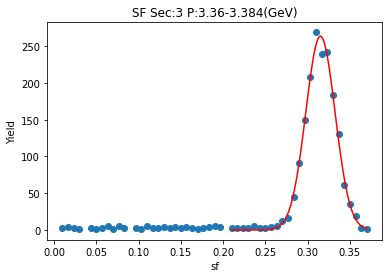

[2.51631636e+02 3.14839152e-01 1.71690732e-02]


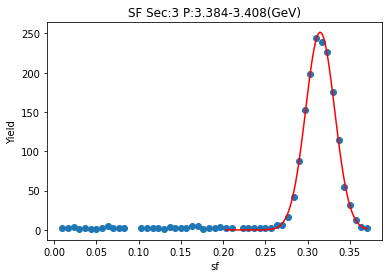

[2.41160792e+02 3.14789267e-01 1.71105307e-02]


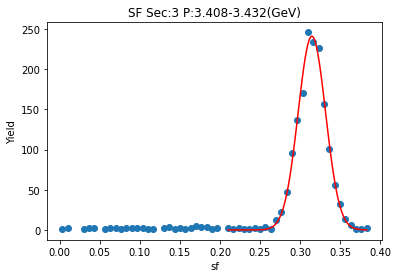

[2.24729230e+02 3.14292716e-01 1.78871533e-02]


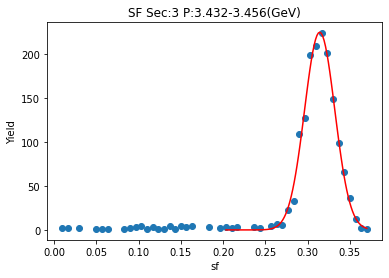

[2.27268470e+02 3.15133728e-01 1.64375165e-02]


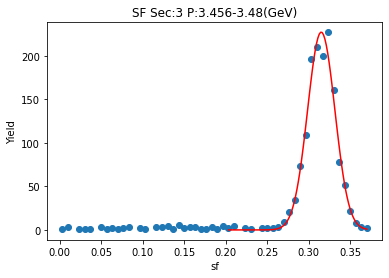

[1.96274121e+02 3.14519052e-01 1.68914439e-02]


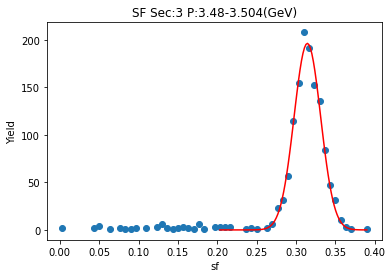

[1.91298755e+02 3.14022380e-01 1.60460913e-02]


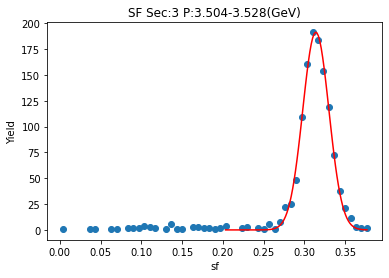

[1.66393456e+02 3.14917243e-01 1.73769626e-02]


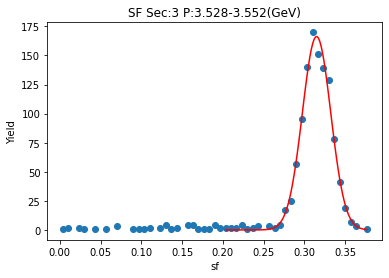

[1.62241920e+02 3.15811175e-01 1.61295819e-02]


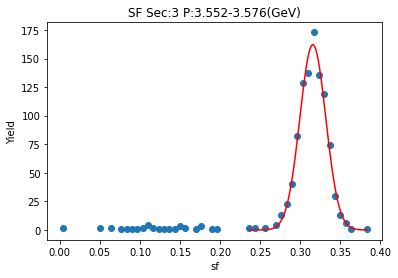

[1.43306447e+02 3.15918788e-01 1.60794277e-02]


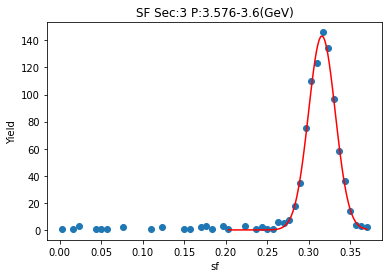

[1.53110409e+02 3.15033610e-01 1.44751349e-02]


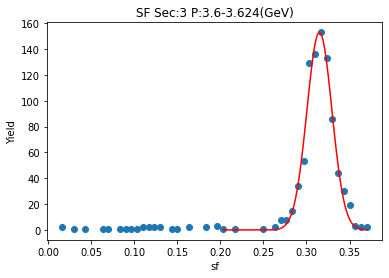

[1.21538443e+02 3.13055301e-01 1.70013624e-02]


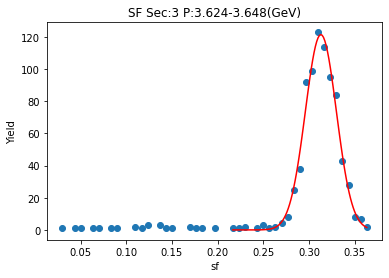

[1.14700313e+02 3.15491133e-01 1.56150262e-02]


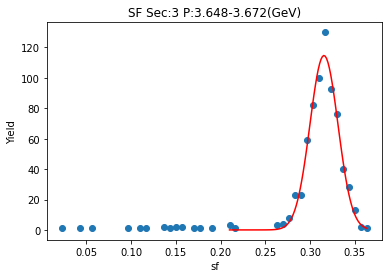

[9.95026607e+01 3.13708647e-01 1.61683449e-02]


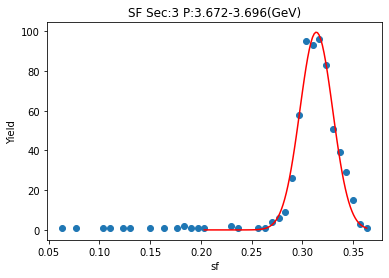

[9.71878489e+01 3.14671357e-01 1.56861996e-02]


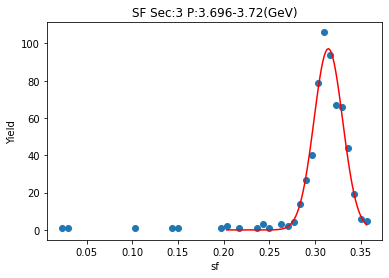

[4.50252364e+01 2.95605084e-01 2.77308873e-02]


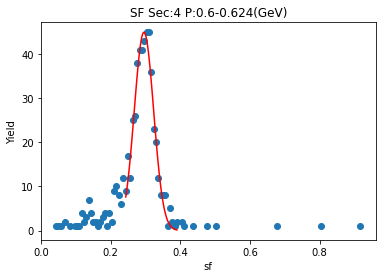

[5.37486344e+01 2.89303763e-01 2.88596113e-02]


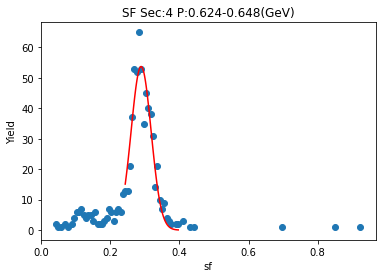

[7.13635689e+01 2.84306207e-01 2.62370507e-02]


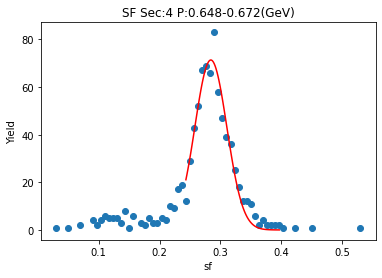

[6.81715322e+01 2.78758594e-01 3.13239955e-02]


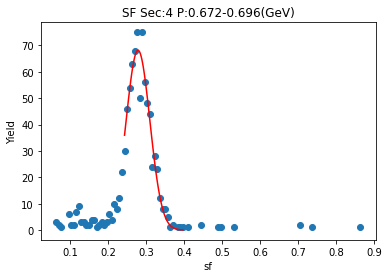

[7.72486947e+01 2.77888511e-01 2.94030021e-02]


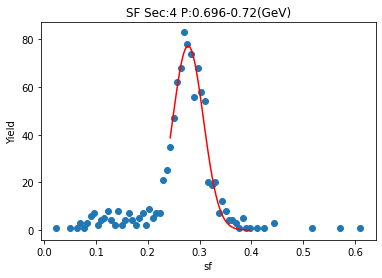

[7.68496615e+01 2.78774118e-01 3.13977152e-02]


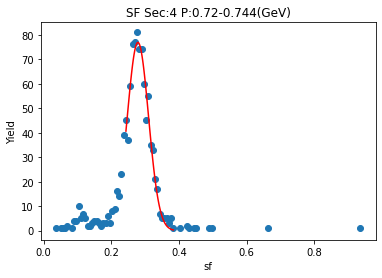

[8.19558612e+01 2.74879018e-01 3.30238843e-02]


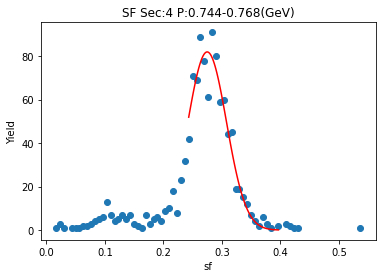

[8.22045021e+01 2.72027708e-01 3.42478457e-02]


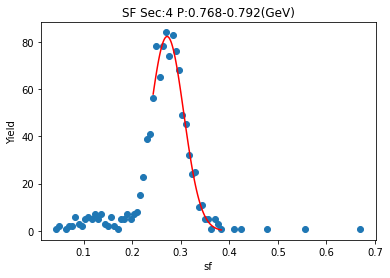

[8.19292834e+01 2.72973760e-01 3.43015972e-02]


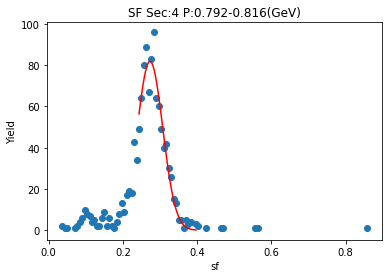

[8.98338617e+01 2.80323564e-01 3.12642265e-02]


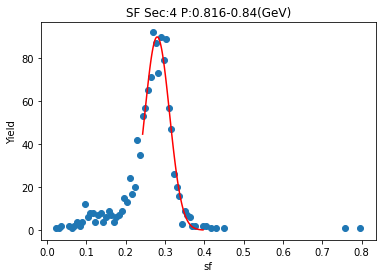

[8.61711506e+01 2.74669081e-01 3.47584591e-02]


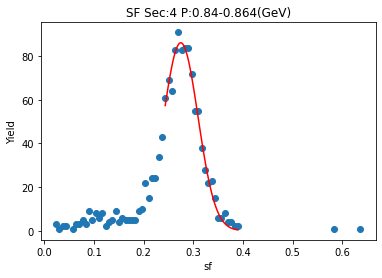

[8.79527492e+01 2.78216573e-01 3.33212374e-02]


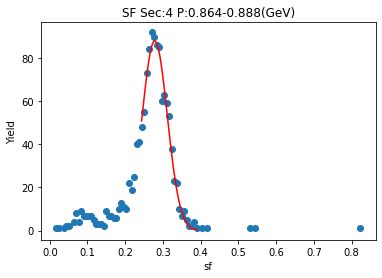

[9.66671887e+01 2.79157703e-01 2.85224753e-02]


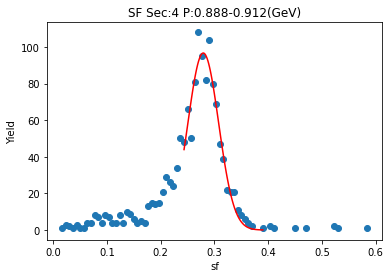

[9.94267788e+01 2.78089706e-01 3.08809156e-02]


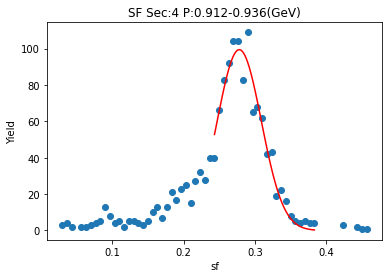

[9.71745972e+01 2.78377367e-01 3.25997154e-02]


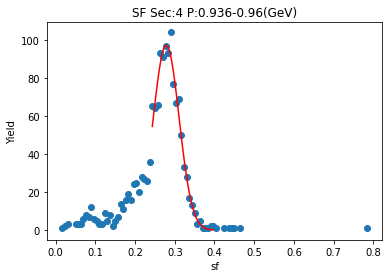

[1.00283381e+02 2.81015104e-01 2.85187359e-02]


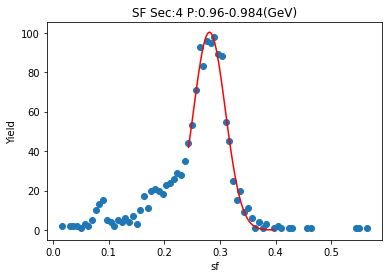

[9.72868166e+01 2.82065384e-01 2.93660449e-02]


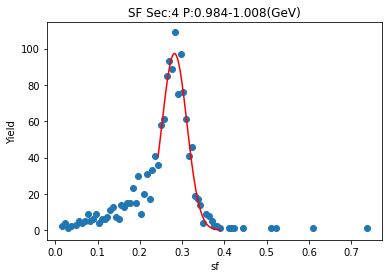

[1.01413543e+02 2.81344678e-01 3.23875321e-02]


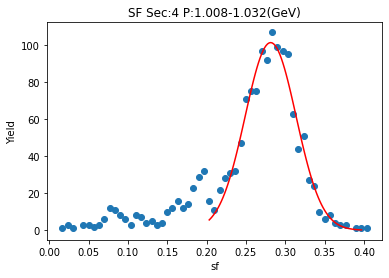

[9.93922730e+01 2.80478134e-01 3.39428438e-02]


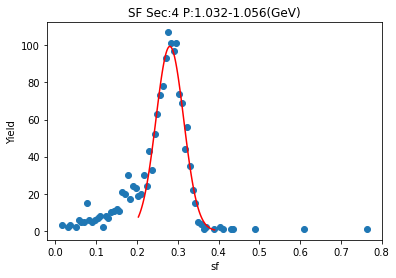

[9.49041389e+01 2.80807700e-01 3.49181797e-02]


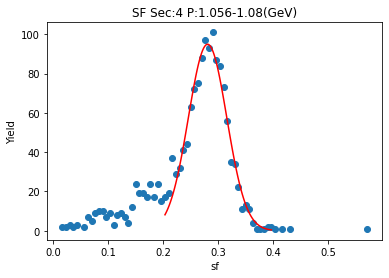

[1.09202935e+02 2.80892487e-01 3.06309730e-02]


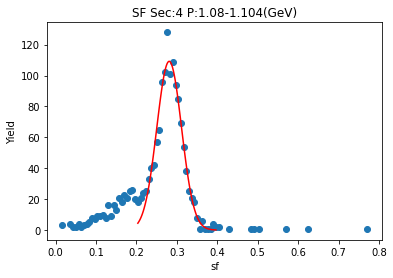

[1.16779527e+02 2.80119837e-01 2.83382501e-02]


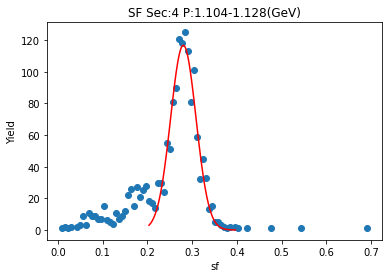

[1.08427187e+02 2.82131466e-01 3.02888438e-02]


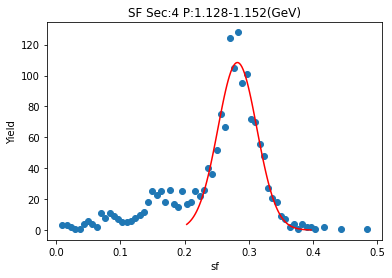

[1.16275851e+02 2.84534240e-01 2.82202376e-02]


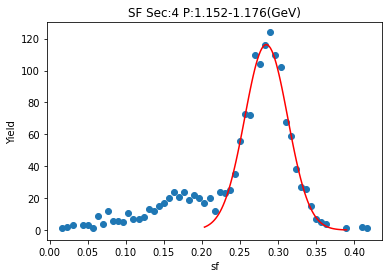

[1.11641466e+02 2.84401158e-01 2.81377643e-02]


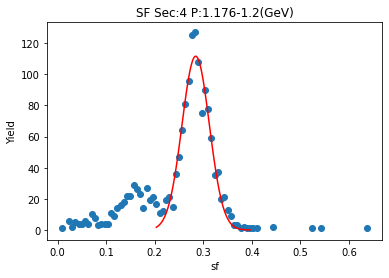

[1.15657809e+02 2.88037037e-01 2.93497418e-02]


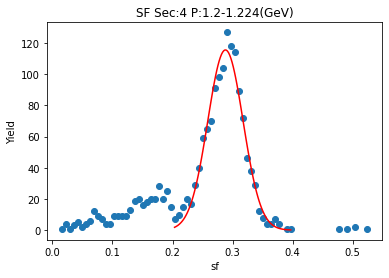

[1.19012854e+02 2.84822896e-01 2.89259721e-02]


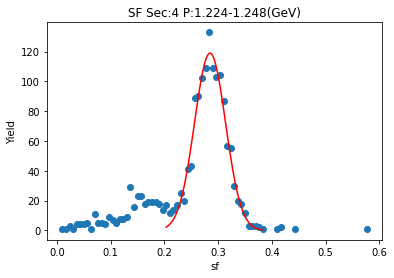

[1.23208047e+02 2.85297976e-01 2.77885977e-02]


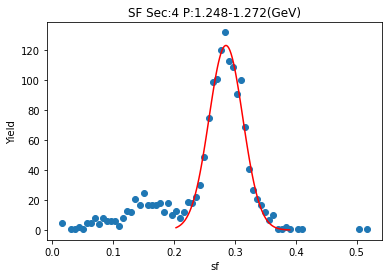

[1.30843467e+02 2.87602305e-01 2.61856874e-02]


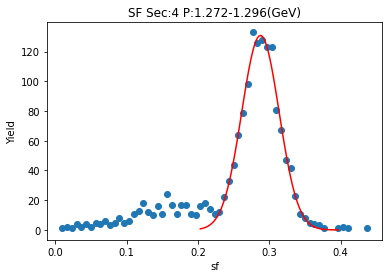

[1.27735552e+02 2.88480545e-01 2.65971401e-02]


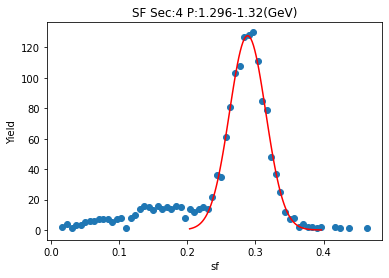

[1.38031490e+02 2.88720023e-01 2.55478767e-02]


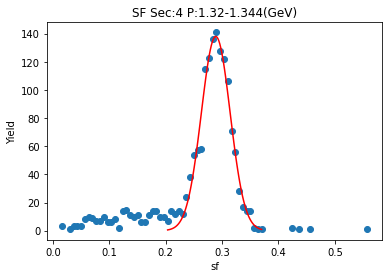

[1.32763313e+02 2.88248952e-01 2.63680411e-02]


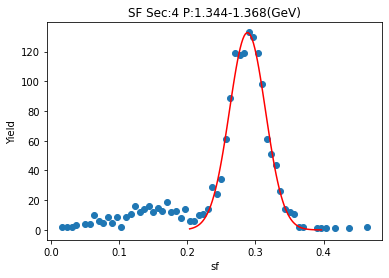

[1.38571548e+02 2.89448830e-01 2.58378644e-02]


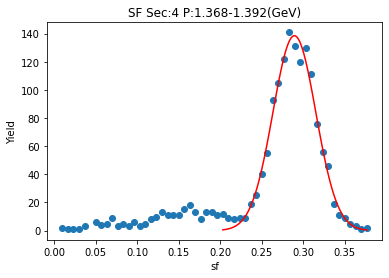

[1.40178595e+02 2.91629705e-01 2.47952451e-02]


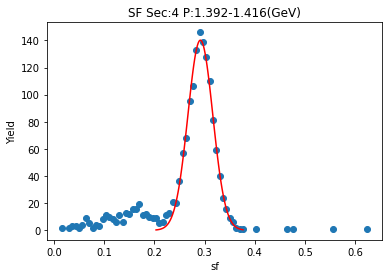

[1.37900434e+02 2.89956363e-01 2.50407637e-02]


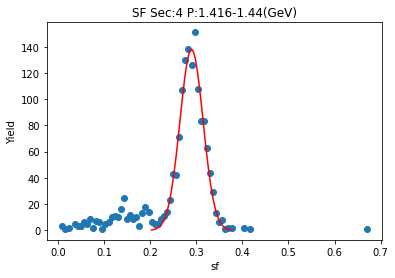

[1.41703710e+02 2.90793935e-01 2.46835142e-02]


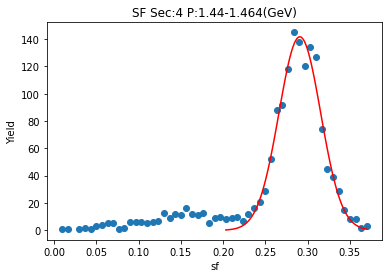

[1.41062233e+02 2.89844354e-01 2.51111840e-02]


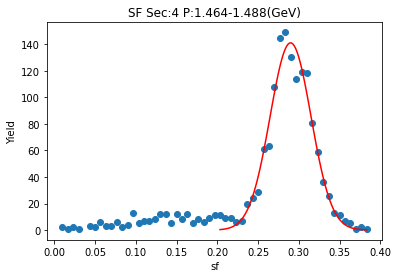

[1.47210787e+02 2.91173428e-01 2.39417347e-02]


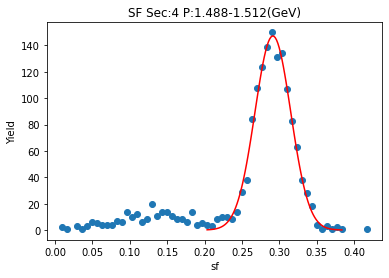

[1.49178417e+02 2.91286019e-01 2.42203116e-02]


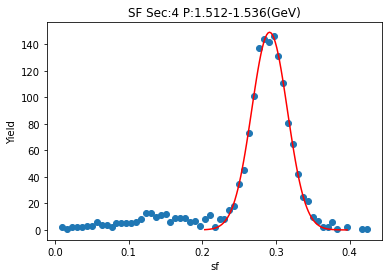

[1.40591002e+02 2.91699537e-01 2.39363279e-02]


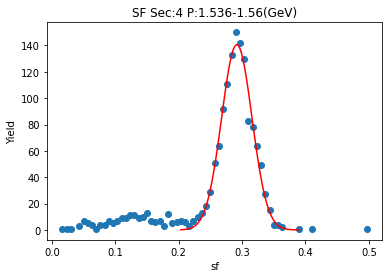

[1.44256074e+02 2.90160141e-01 2.45453508e-02]


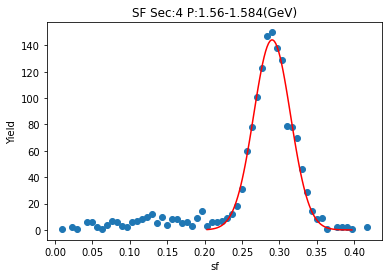

[1.58975850e+02 2.93165067e-01 2.37101067e-02]


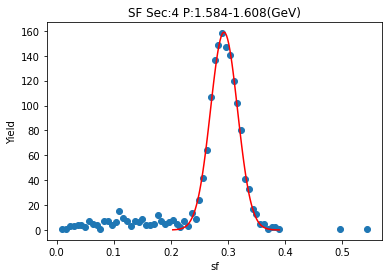

[1.51518050e+02 2.92755723e-01 2.39596330e-02]


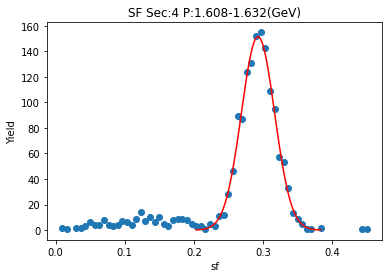

[1.53164278e+02 2.92656903e-01 2.43355562e-02]


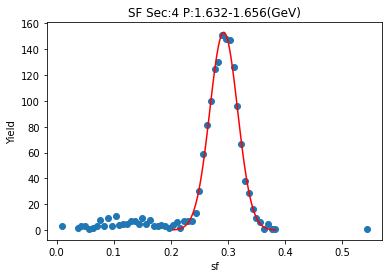

[1.52540844e+02 2.93839222e-01 2.28071068e-02]


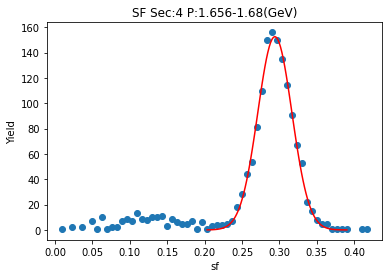

[1.56939133e+02 2.95156588e-01 2.28705571e-02]


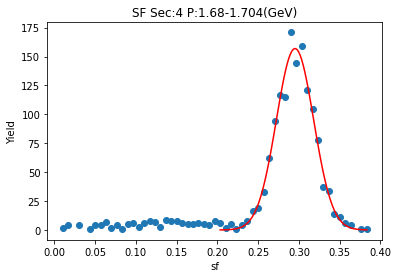

[1.54201208e+02 2.94159068e-01 2.27586122e-02]


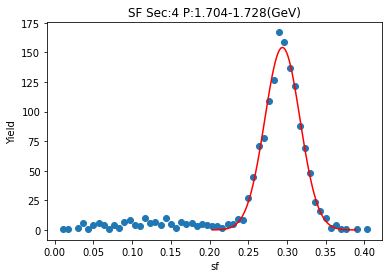

[1.57892606e+02 2.95642844e-01 2.29599649e-02]


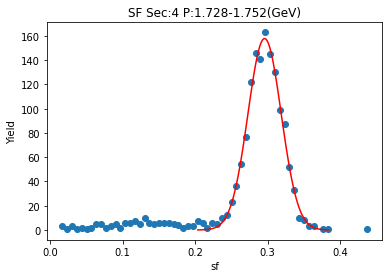

[1.57558647e+02 2.94810904e-01 2.31490120e-02]


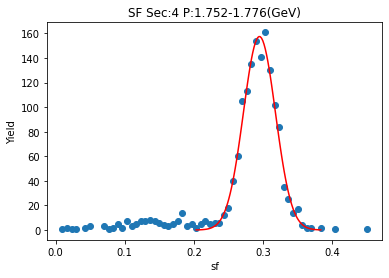

[1.77533884e+02 2.96207279e-01 2.22512014e-02]


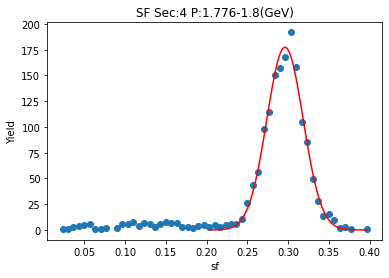

[1.61846823e+02 2.93829896e-01 2.21067807e-02]


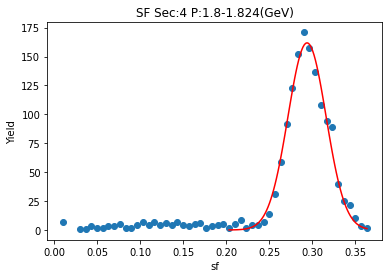

[1.69661237e+02 2.96253807e-01 2.16417251e-02]


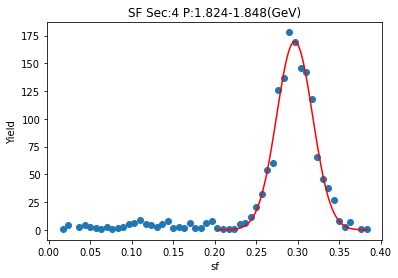

[1.73318513e+02 2.94977672e-01 2.17741837e-02]


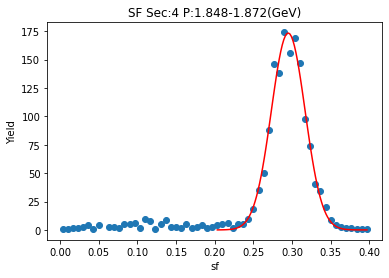

[1.73775677e+02 2.95821114e-01 2.08877597e-02]


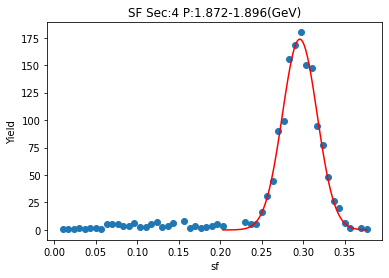

[1.69282151e+02 2.95969623e-01 2.12206255e-02]


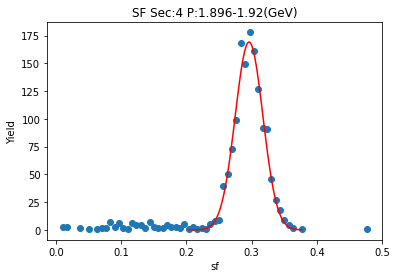

[1.74901798e+02 2.97572976e-01 2.12133391e-02]


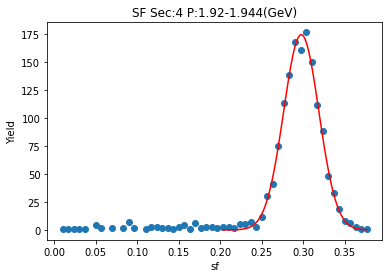

[1.66915731e+02 2.97314618e-01 2.24087201e-02]


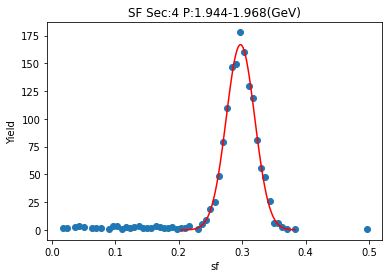

[1.70568158e+02 2.96320827e-01 2.13203728e-02]


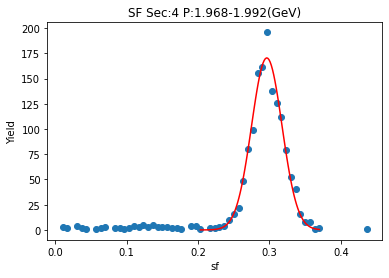

[1.79495991e+02 2.97218415e-01 2.11527731e-02]


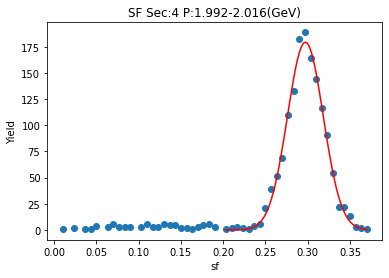

[1.64071228e+02 2.97364659e-01 2.25534693e-02]


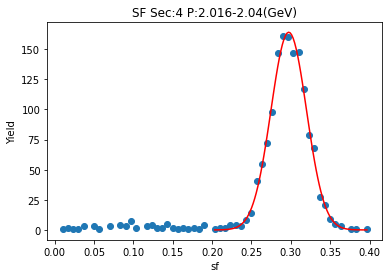

[1.71159026e+02 2.97073878e-01 2.25940074e-02]


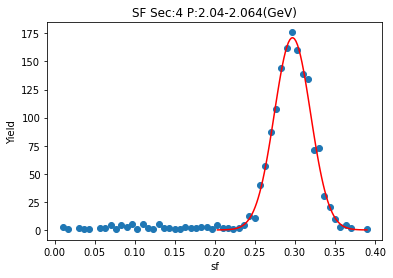

[1.82096773e+02 2.96691812e-01 2.15261572e-02]


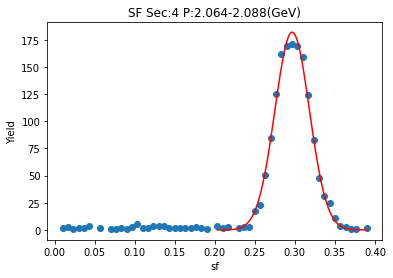

[1.69234744e+02 2.97330723e-01 2.17833440e-02]


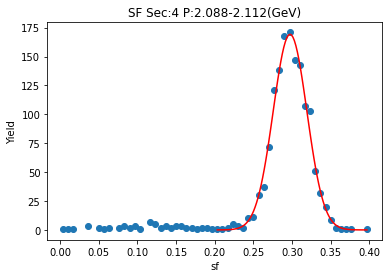

[1.86903911e+02 2.97253182e-01 2.02303516e-02]


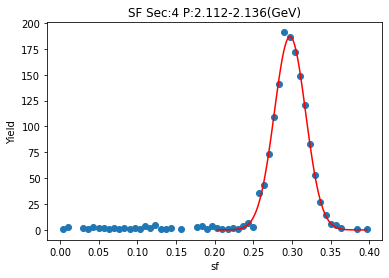

[1.68350523e+02 2.96772133e-01 2.18876870e-02]


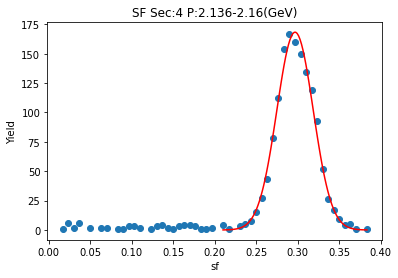

[1.75179281e+02 2.97936617e-01 2.07494491e-02]


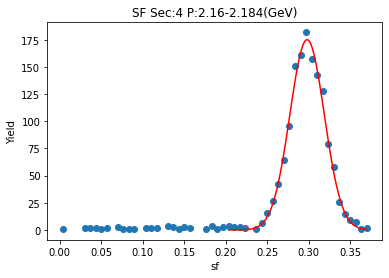

[1.68208485e+02 2.98053798e-01 2.11236355e-02]


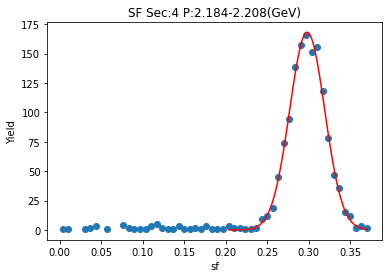

[1.75568589e+02 2.98218269e-01 2.13427225e-02]


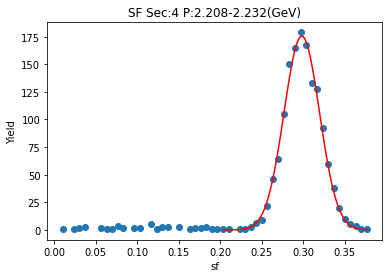

[1.88702222e+02 2.97794690e-01 2.03919346e-02]


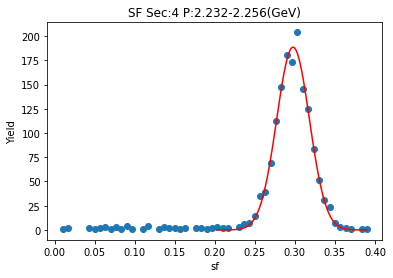

[1.81730355e+02 2.97790835e-01 2.09159984e-02]


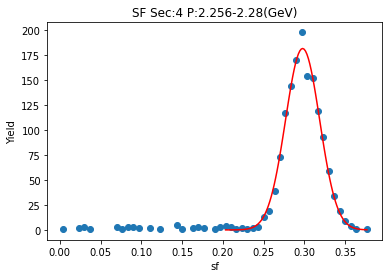

[1.78055872e+02 2.98603657e-01 2.11025778e-02]


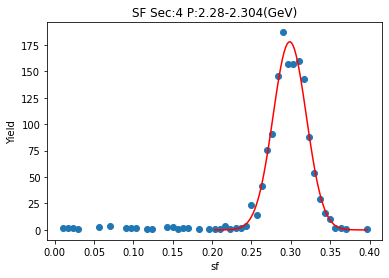

[1.90615085e+02 2.99217727e-01 2.01174194e-02]


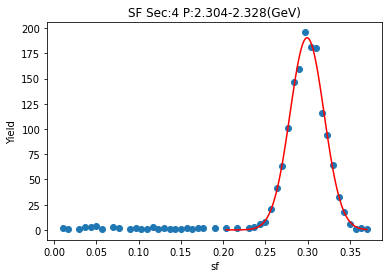

[1.74739570e+02 2.98462733e-01 1.97014713e-02]


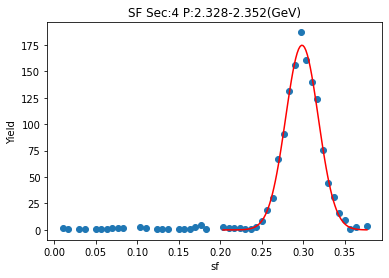

[1.84934746e+02 2.98132007e-01 1.98484913e-02]


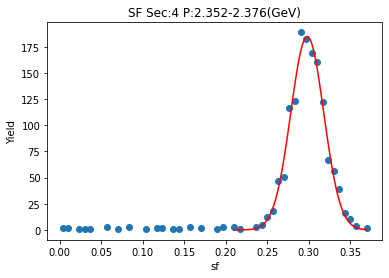

[1.87119187e+02 2.97808085e-01 1.97123129e-02]


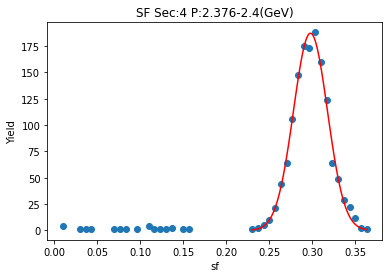

[1.90495740e+02 2.97558991e-01 1.97700830e-02]


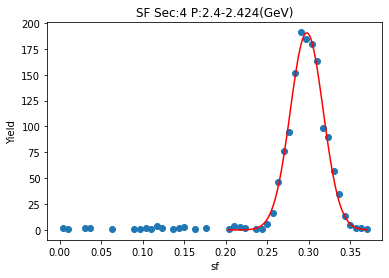

[1.77578442e+02 2.97523289e-01 2.08970437e-02]


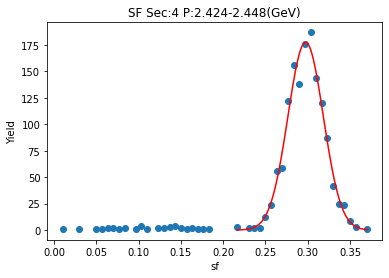

[1.83217364e+02 2.97566614e-01 1.94541566e-02]


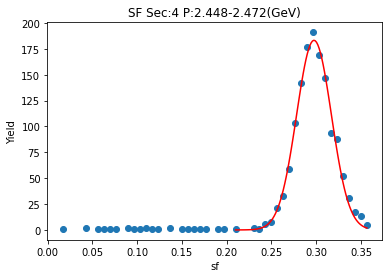

[1.73908419e+02 2.98784007e-01 1.98134316e-02]


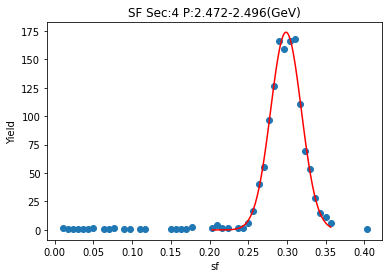

[1.77067712e+02 2.97909626e-01 1.95716822e-02]


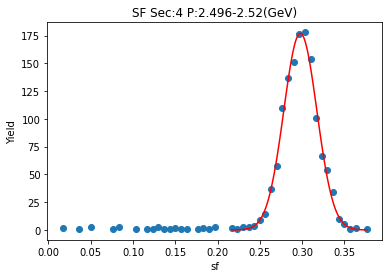

[1.67970871e+02 2.98642072e-01 1.97932096e-02]


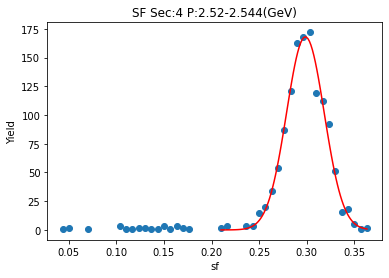

[1.82729441e+02 2.98099136e-01 1.86238494e-02]


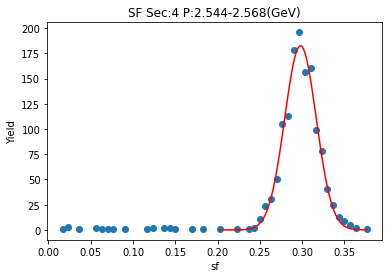

[1.69033103e+02 2.96482515e-01 1.96745789e-02]


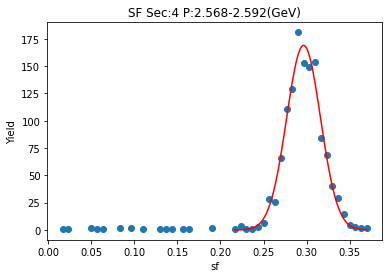

[1.84265070e+02 2.97291282e-01 1.84652148e-02]


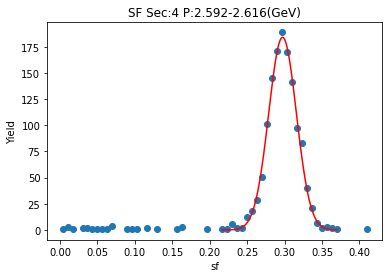

[1.73364214e+02 2.97441141e-01 1.89468060e-02]


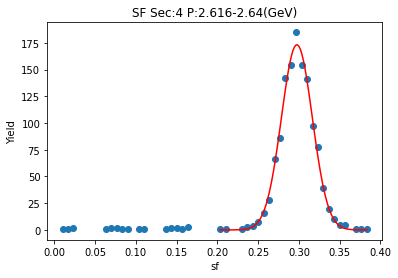

[1.73382454e+02 2.96542185e-01 1.96263341e-02]


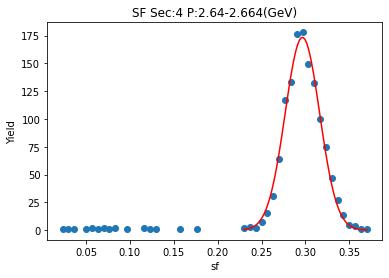

[1.72343126e+02 2.96860243e-01 1.93519472e-02]


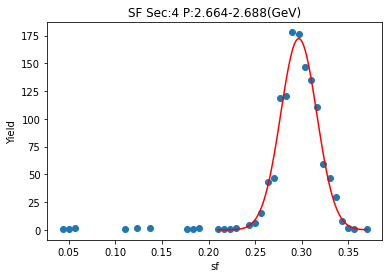

[1.62642583e+02 2.98951133e-01 1.95831288e-02]


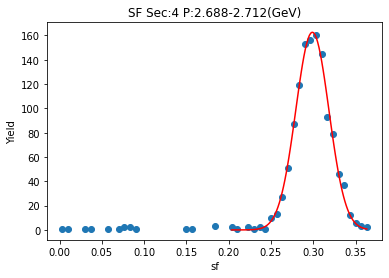

[1.75515751e+02 2.97369645e-01 1.78632206e-02]


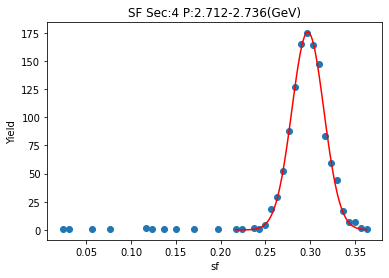

[1.65764556e+02 2.96993750e-01 1.85419562e-02]


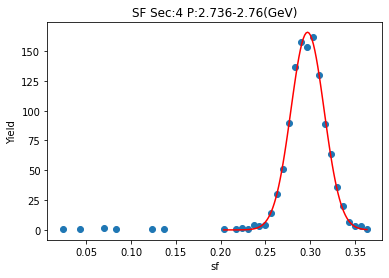

[1.66979629e+02 2.95344361e-01 1.88443017e-02]


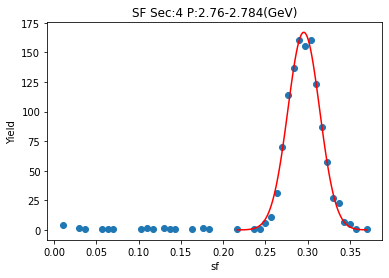

[1.60782404e+02 2.96150995e-01 1.85015528e-02]


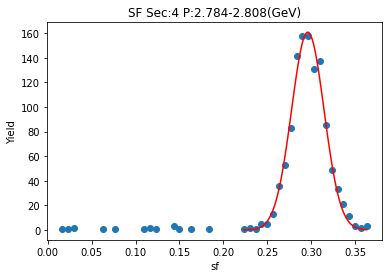

[1.53665374e+02 2.97452120e-01 1.86141789e-02]


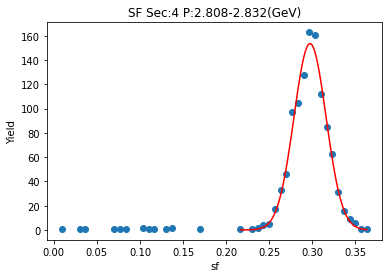

[1.55398330e+02 2.96287096e-01 1.89629243e-02]


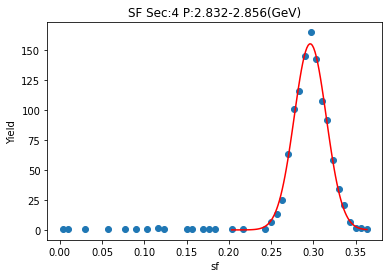

[1.63723497e+02 2.96605559e-01 1.78801641e-02]


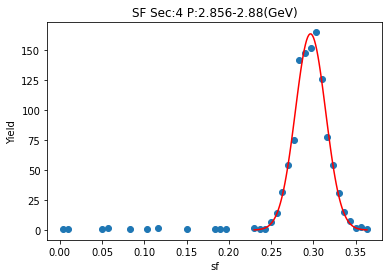

[1.57414951e+02 2.94793164e-01 1.82069741e-02]


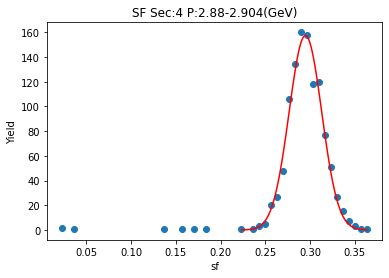

[1.61126562e+02 2.95521253e-01 1.70662887e-02]


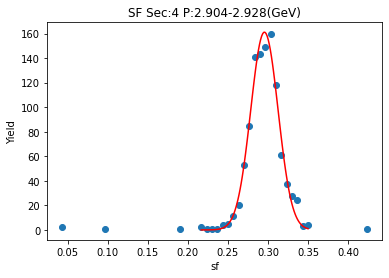

[1.68128165e+02 2.95828102e-01 1.70349033e-02]


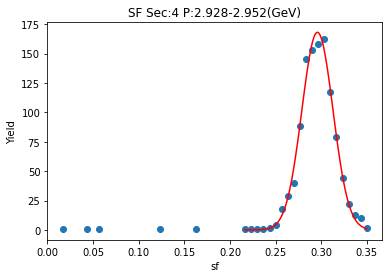

[1.54065193e+02 2.94928476e-01 1.74871592e-02]


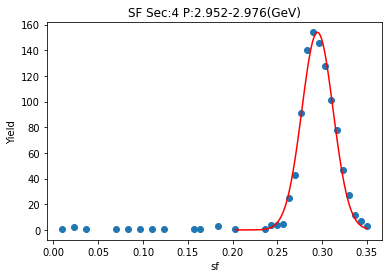

[1.52125868e+02 2.96027978e-01 1.71841544e-02]


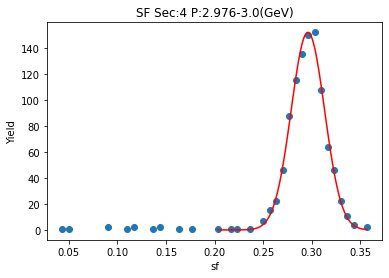

[1.52386633e+02 2.94770078e-01 1.68793669e-02]


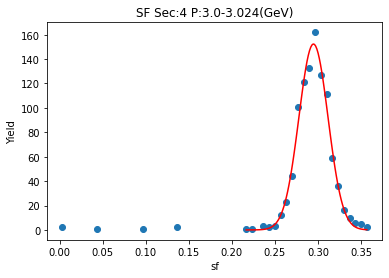

[1.56901784e+02 2.94654900e-01 1.67263379e-02]


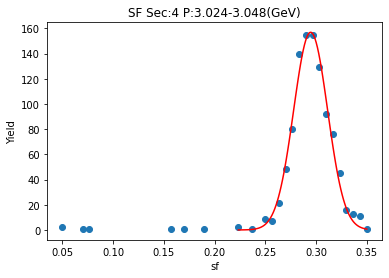

[1.38824206e+02 2.95866877e-01 1.69340708e-02]


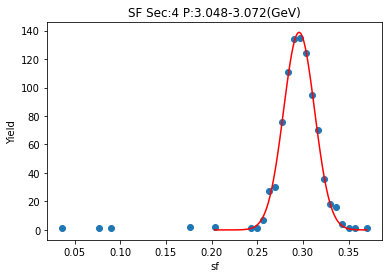

[1.43090096e+02 2.94009541e-01 1.68818507e-02]


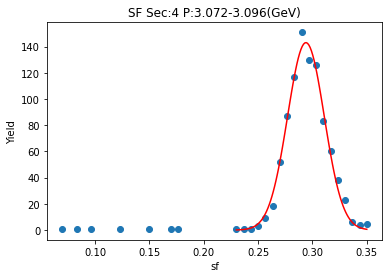

[1.44492613e+02 2.95333854e-01 1.68140708e-02]


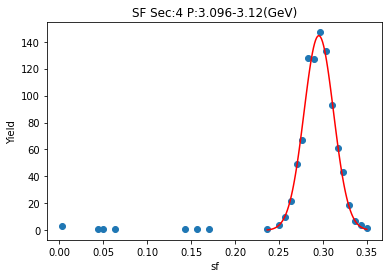

[1.39572870e+02 2.95257615e-01 1.78269239e-02]


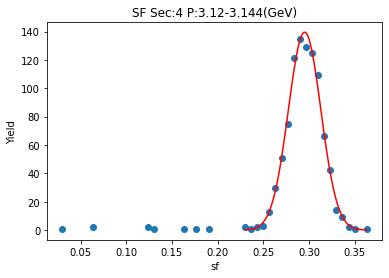

[1.31279086e+02 2.94247513e-01 1.73969181e-02]


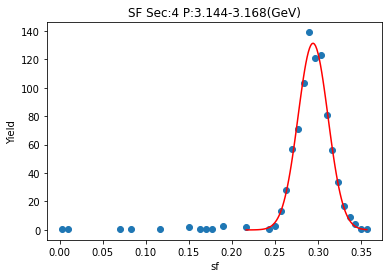

[1.45479991e+02 2.96185079e-01 1.57957629e-02]


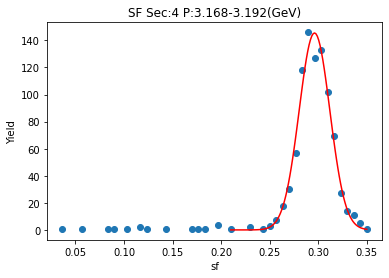

[1.31271135e+02 2.95102214e-01 1.64421489e-02]


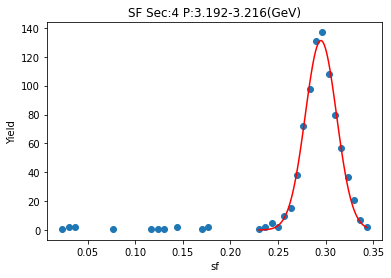

[1.38358773e+02 2.95586883e-01 1.62998855e-02]


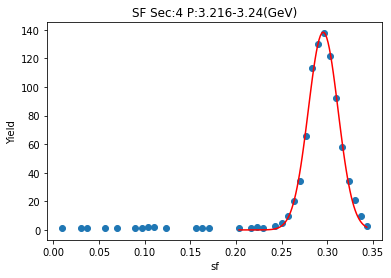

[1.35537893e+02 2.95819889e-01 1.62362023e-02]


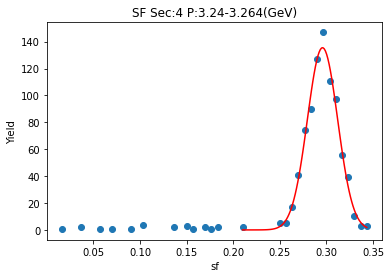

[1.29708254e+02 2.94543020e-01 1.62803777e-02]


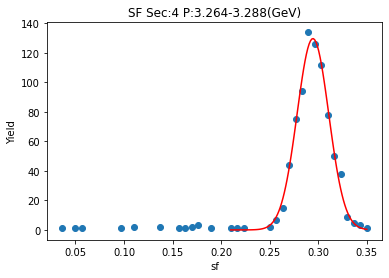

[1.26408855e+02 2.95759894e-01 1.58937507e-02]


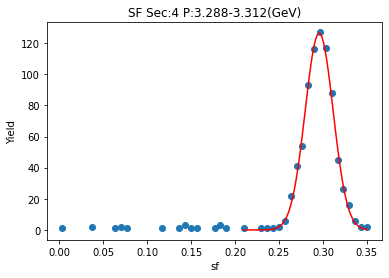

[1.19264866e+02 2.95669300e-01 1.70448831e-02]


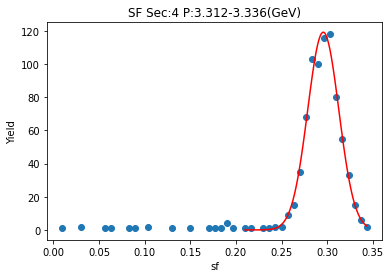

[1.25255292e+02 2.94895174e-01 1.57062687e-02]


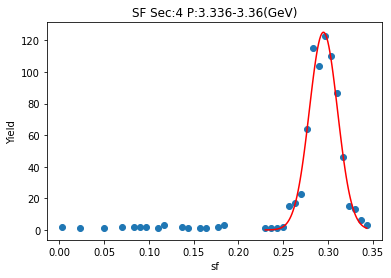

[1.18643721e+02 2.96146376e-01 1.59014176e-02]


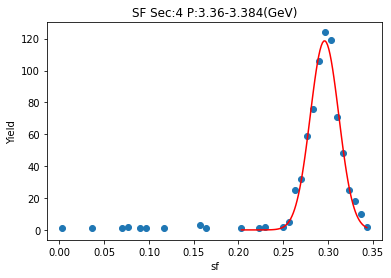

[1.20557010e+02 2.93057946e-01 1.47583614e-02]


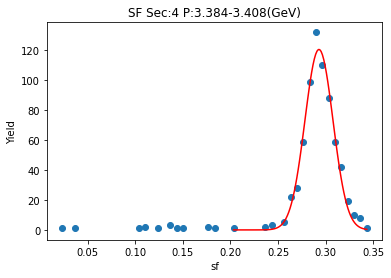

[1.11121284e+02 2.93934565e-01 1.44441477e-02]


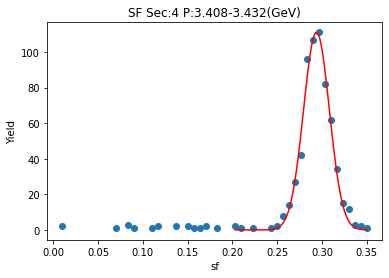

[1.10198405e+02 2.94949455e-01 1.52767374e-02]


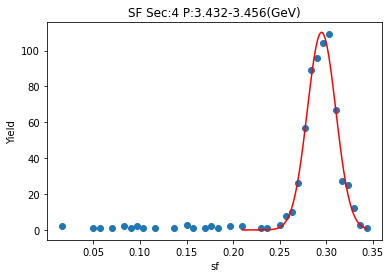

[8.74491017e+01 2.94357641e-01 1.66372501e-02]


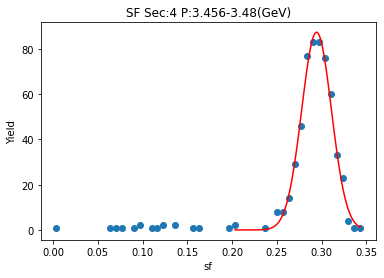

[8.51453696e+01 2.92738681e-01 1.56707293e-02]


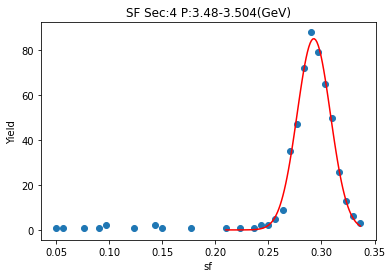

[8.43577537e+01 2.94846907e-01 1.61719112e-02]


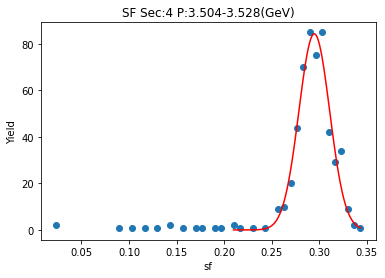

[1.43889497e+02 2.85486622e-01 3.00609587e-02]


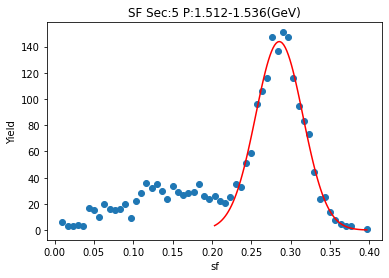

[1.43692680e+02 2.84027641e-01 2.96969912e-02]


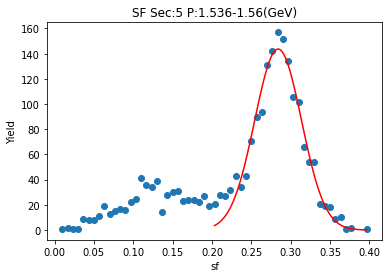

[1.41927252e+02 2.86924995e-01 3.13723185e-02]


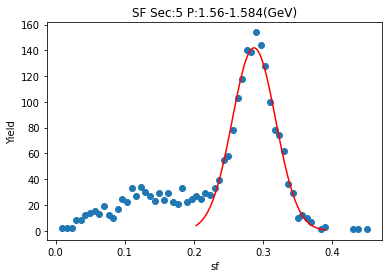

[1.52053177e+02 2.88326505e-01 2.94614306e-02]


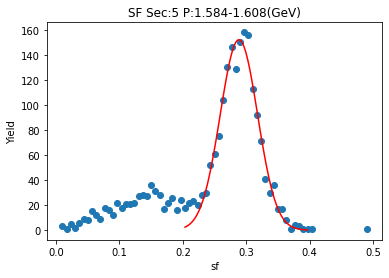

[1.58352226e+02 2.88734911e-01 2.86329670e-02]


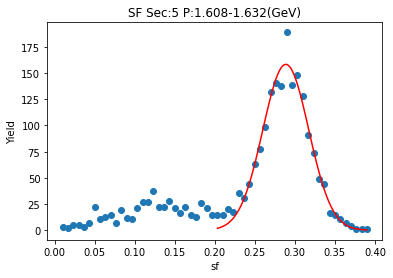

[1.52294632e+02 2.88174186e-01 2.85357895e-02]


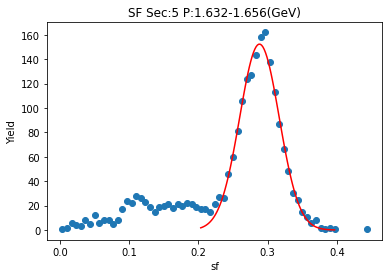

[1.55405873e+02 2.88322612e-01 2.87513035e-02]


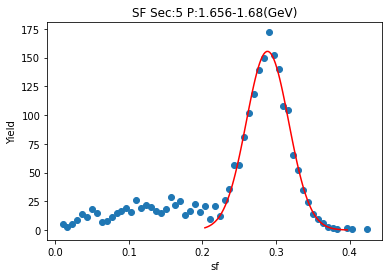

[1.59871564e+02 2.89180304e-01 2.75642142e-02]


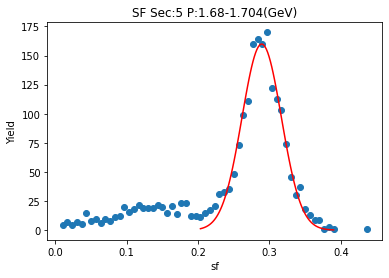

[1.63498218e+02 2.90057405e-01 2.73317395e-02]


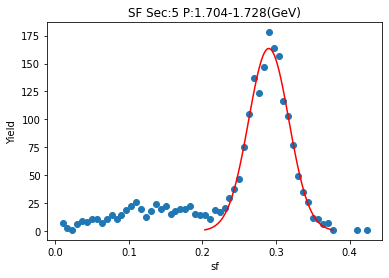

[1.60281480e+02 2.91782356e-01 2.73876530e-02]


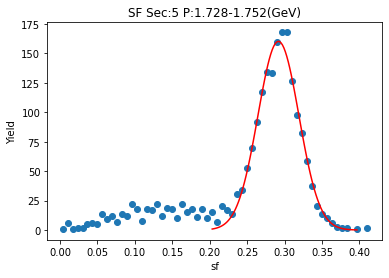

[1.69556698e+02 2.90889158e-01 2.73764948e-02]


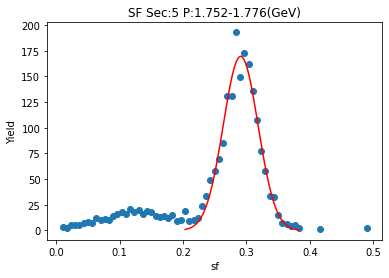

[1.72211395e+02 2.90190464e-01 2.71280700e-02]


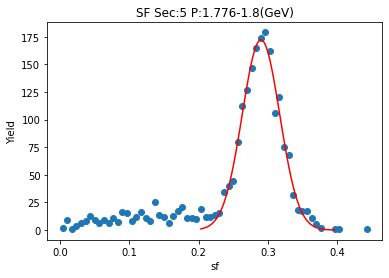

[1.70207496e+02 2.89107814e-01 2.69361101e-02]


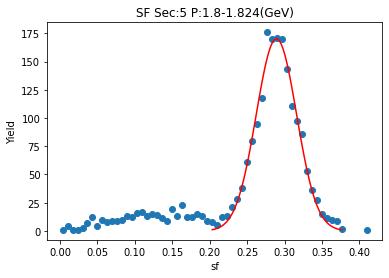

[1.66883982e+02 2.90502274e-01 2.67629139e-02]


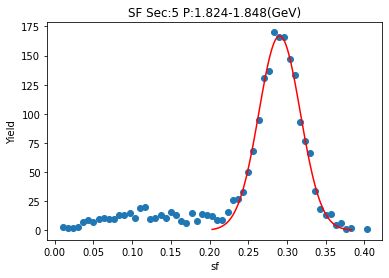

[1.66437330e+02 2.91855648e-01 2.78121935e-02]


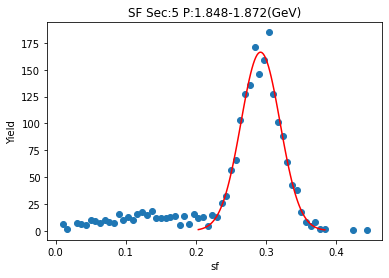

[1.72444729e+02 2.92083084e-01 2.75796635e-02]


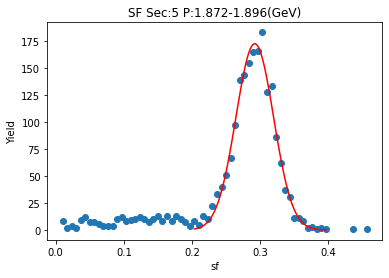

[1.70390239e+02 2.92362797e-01 2.67666155e-02]


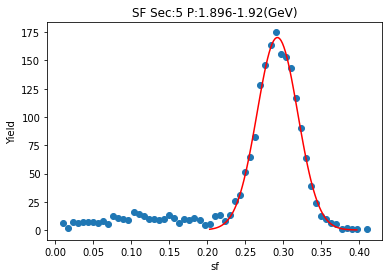

[1.76368283e+02 2.92022208e-01 2.70664846e-02]


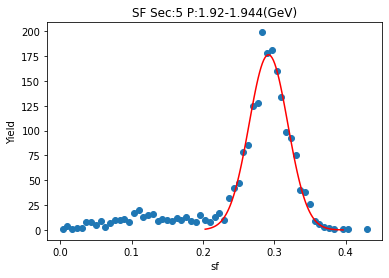

[1.90551602e+02 2.93416747e-01 2.51373277e-02]


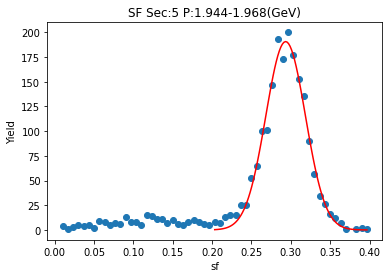

[1.80099795e+02 2.93064120e-01 2.66129738e-02]


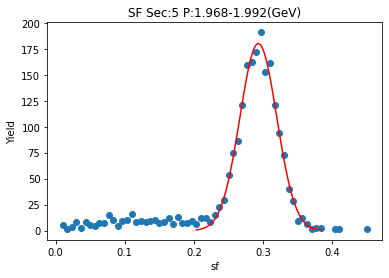

[1.81690952e+02 2.91465125e-01 2.62764339e-02]


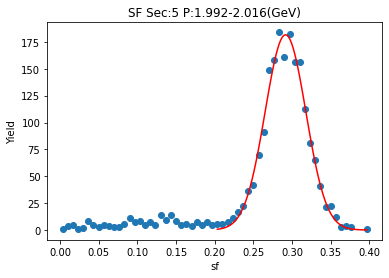

[1.81805732e+02 2.93018426e-01 2.72000219e-02]


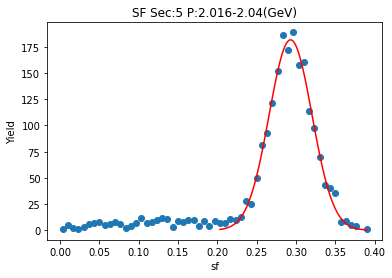

[1.89917348e+02 2.93255392e-01 2.50336224e-02]


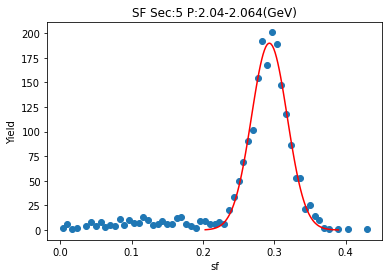

[1.90235784e+02 2.94492851e-01 2.62094245e-02]


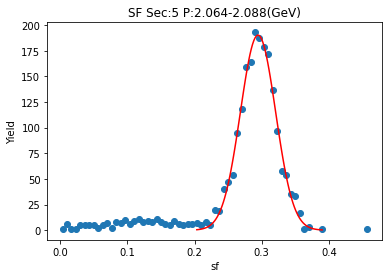

[1.90012780e+02 2.95605392e-01 2.60317224e-02]


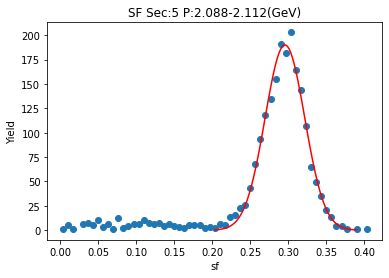

[1.95603439e+02 2.94208493e-01 2.57524212e-02]


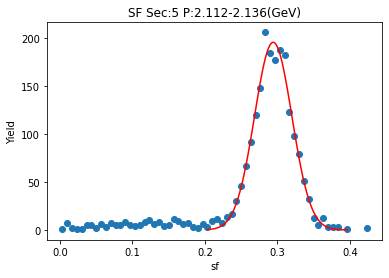

[1.83585258e+02 2.93675824e-01 2.56317653e-02]


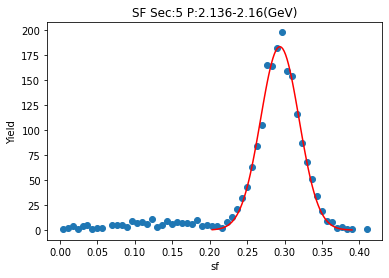

[1.86529967e+02 2.94213771e-01 2.54547040e-02]


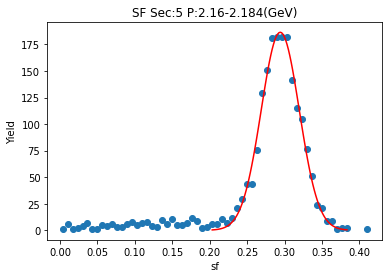

[1.91376344e+02 2.94613640e-01 2.63449949e-02]


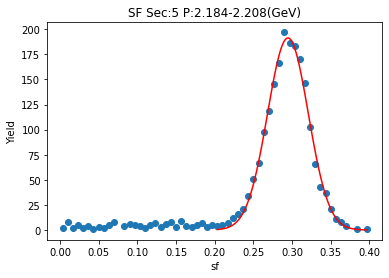

[1.98664194e+02 2.95035301e-01 2.53476512e-02]


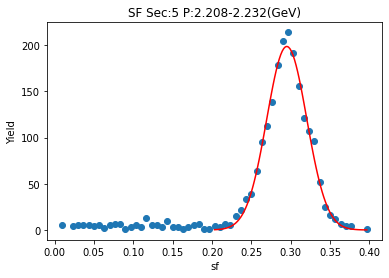

[1.98395692e+02 2.96198657e-01 2.58732205e-02]


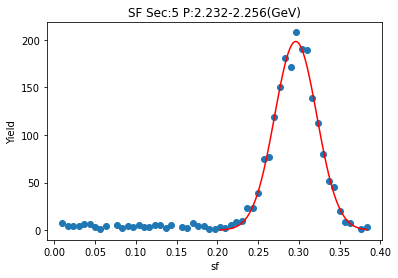

[2.07323970e+02 2.95838529e-01 2.48856131e-02]


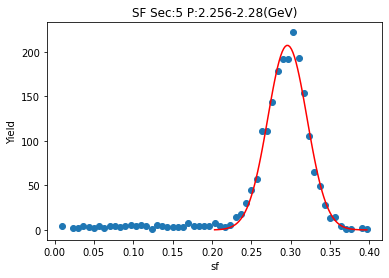

[2.08392433e+02 2.95133515e-01 2.50182468e-02]


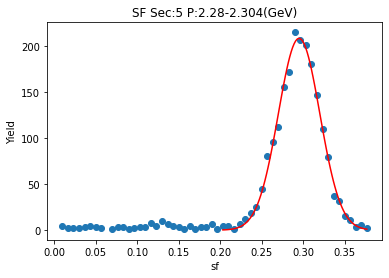

[1.96375628e+02 2.95707720e-01 2.48826595e-02]


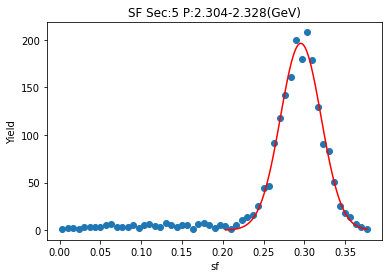

[2.10793461e+02 2.96056431e-01 2.39561878e-02]


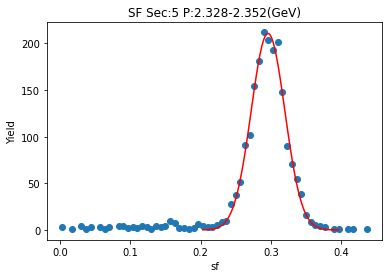

[2.00532475e+02 2.97133033e-01 2.50548914e-02]


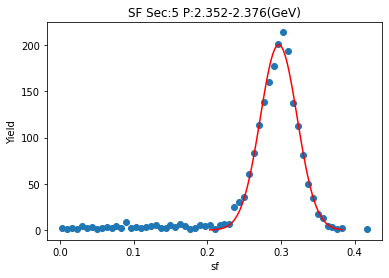

[2.00533683e+02 2.95622228e-01 2.54484948e-02]


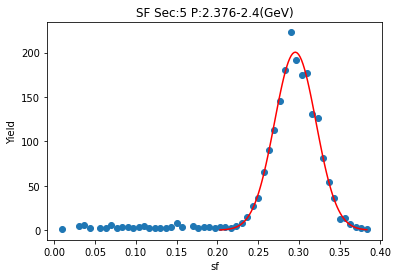

[2.03997025e+02 2.95425161e-01 2.44937681e-02]


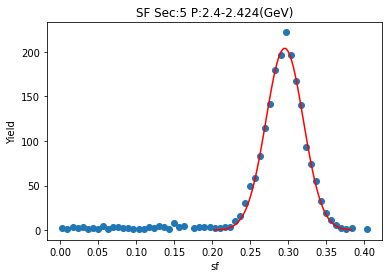

[2.04403929e+02 2.95332710e-01 2.49012470e-02]


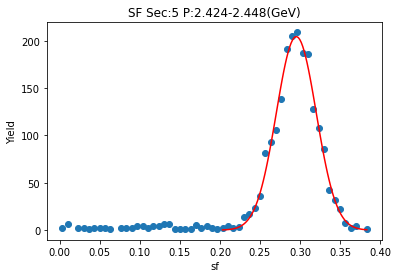

[2.04132364e+02 2.96984349e-01 2.47779201e-02]


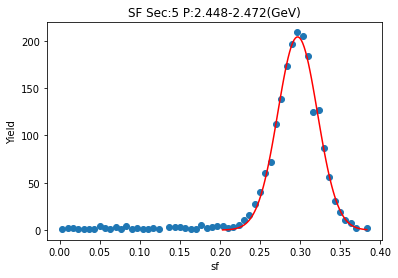

[2.06559194e+02 2.96729412e-01 2.53933891e-02]


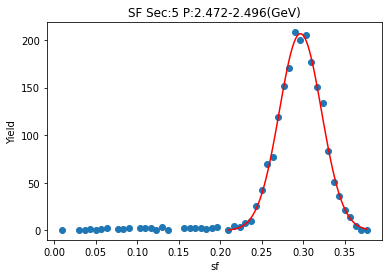

[2.07226432e+02 2.97607390e-01 2.39397311e-02]


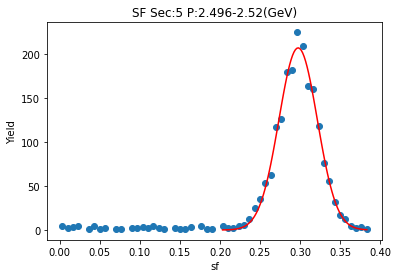

[1.99188024e+02 2.96322289e-01 2.39355802e-02]


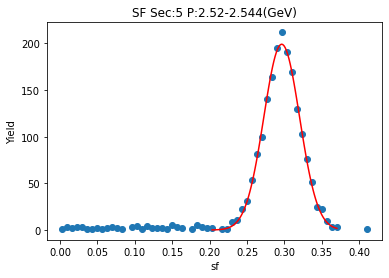

[2.01831552e+02 2.98104180e-01 2.42547044e-02]


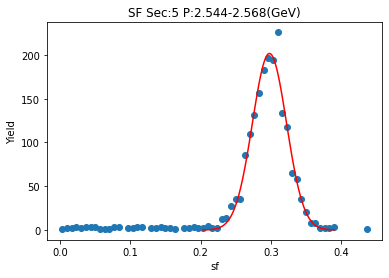

[1.93209485e+02 2.95500668e-01 2.49270916e-02]


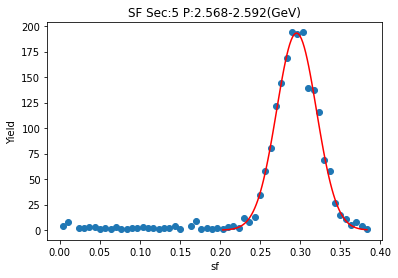

[1.91764300e+02 2.97104182e-01 2.47027217e-02]


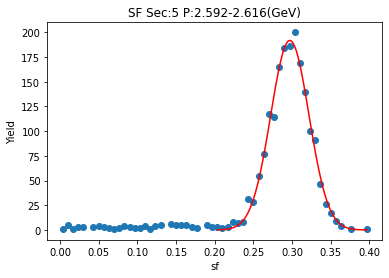

[1.89346312e+02 2.98746555e-01 2.53763245e-02]


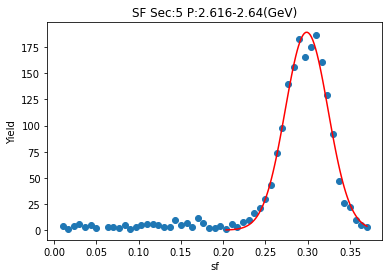

[1.84653411e+02 2.97637630e-01 2.52688026e-02]


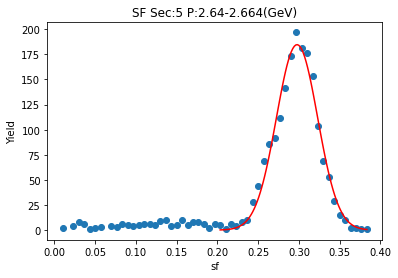

[1.88744983e+02 2.96344337e-01 2.53464827e-02]


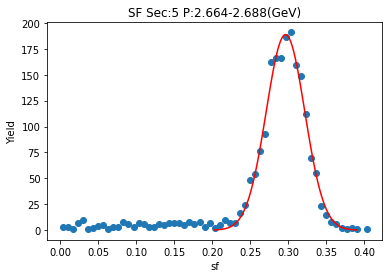

[1.88291880e+02 2.96793959e-01 2.52345600e-02]


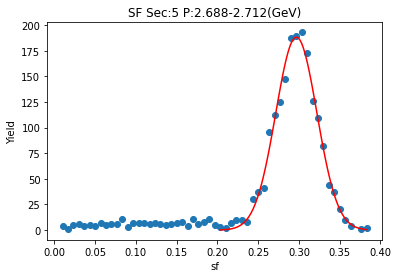

[1.76506638e+02 2.97470344e-01 2.40167836e-02]


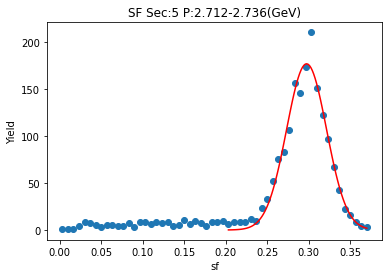

[1.83989849e+02 2.97650048e-01 2.53845265e-02]


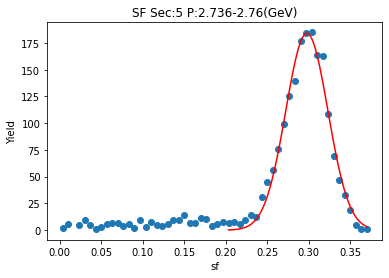

[1.77194759e+02 2.96055751e-01 2.58409414e-02]


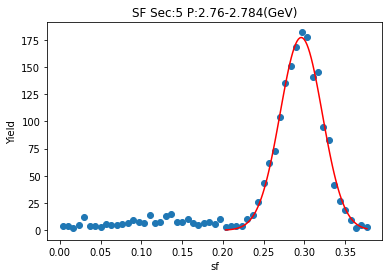

[1.80356889e+02 2.96754947e-01 2.50590197e-02]


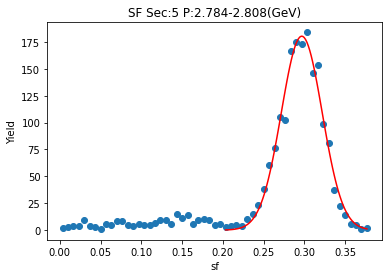

[1.60550418e+02 2.98160784e-01 2.62217601e-02]


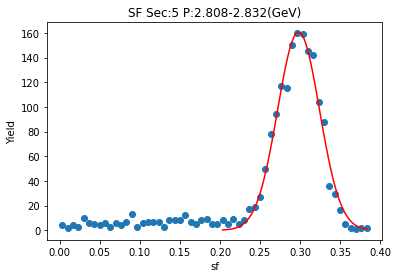

[1.64544564e+02 2.98777210e-01 2.62042959e-02]


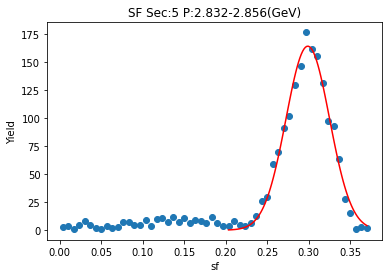

[1.64416036e+02 2.98247486e-01 2.58340851e-02]


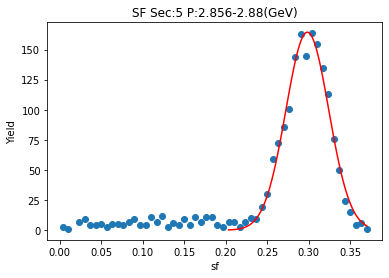

[1.53347191e+02 2.98022285e-01 2.65987410e-02]


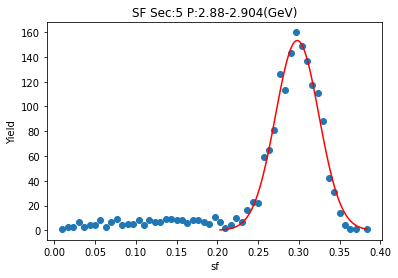

[1.48273091e+02 2.97251858e-01 2.67728583e-02]


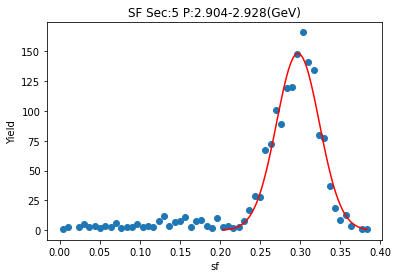

[1.47500369e+02 2.97473882e-01 2.58212304e-02]


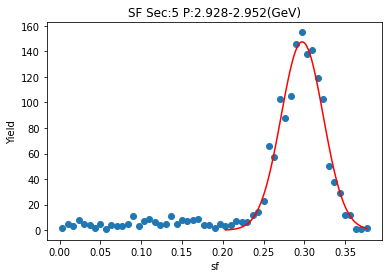

[1.43919711e+02 2.99463255e-01 2.66829378e-02]


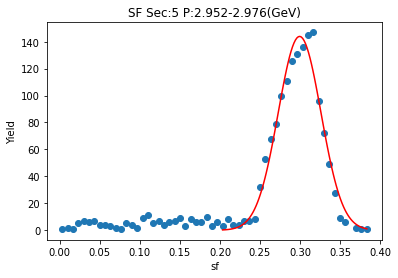

[1.38182949e+02 2.96645721e-01 2.49279197e-02]


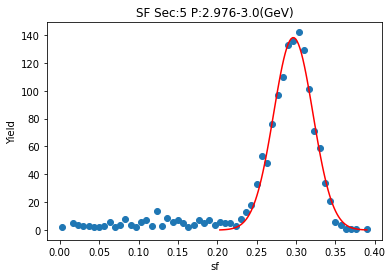

[1.33609858e+02 2.97595773e-01 2.71662695e-02]


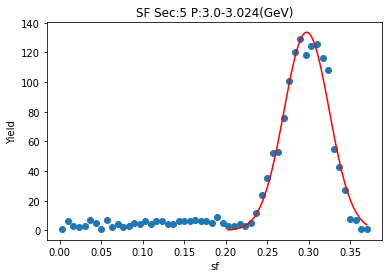

[1.30785955e+02 2.98264531e-01 2.60173666e-02]


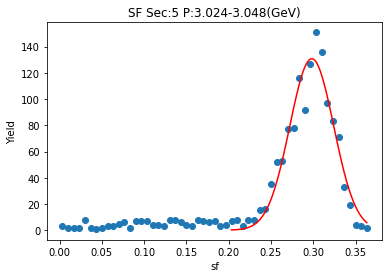

[1.35471537e+02 2.98103392e-01 2.52601799e-02]


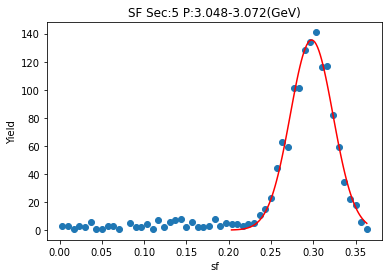

[1.26482483e+02 2.97034332e-01 2.60764327e-02]


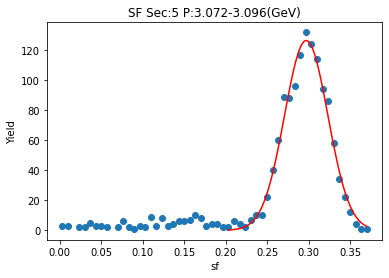

[1.15432209e+02 2.98652756e-01 2.65735505e-02]


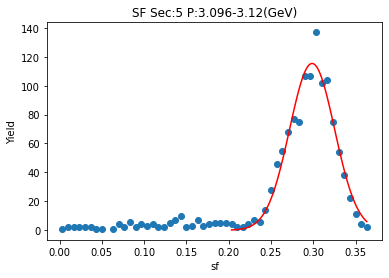

[1.09845442e+02 2.99245852e-01 2.65677745e-02]


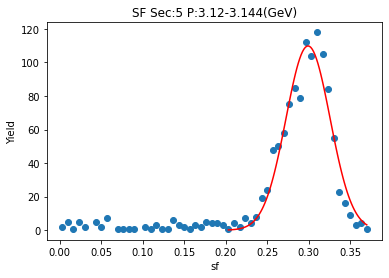

[1.10354859e+02 2.99225266e-01 2.77725577e-02]


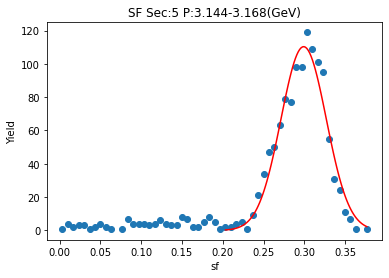

[1.05295403e+02 2.97974810e-01 2.76045616e-02]


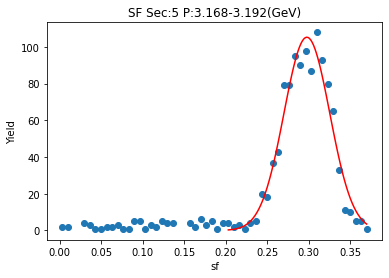

[1.03938294e+02 2.97703237e-01 2.66139271e-02]


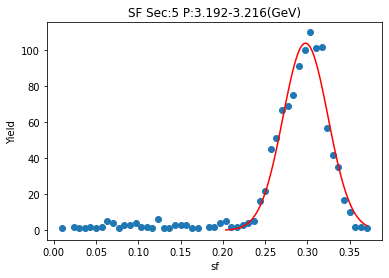

[9.24537440e+01 2.96894127e-01 2.68945295e-02]


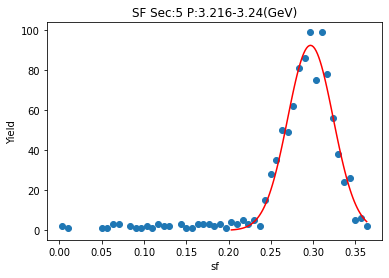

[8.43942444e+01 2.95204472e-01 2.79547720e-02]


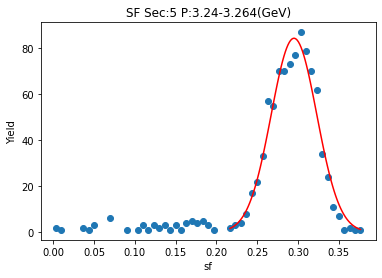

[7.94431836e+01 2.98487000e-01 2.86733792e-02]


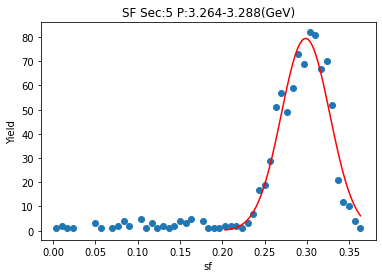

[7.12515790e+01 2.97283125e-01 2.85224926e-02]


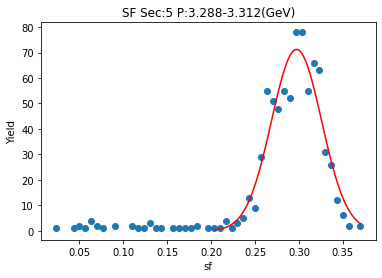

[6.84614034e+01 2.97341041e-01 2.69001141e-02]


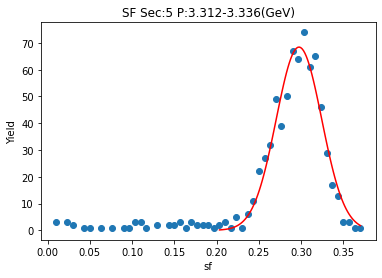

[5.87335215e+01 2.96033255e-01 2.87941117e-02]


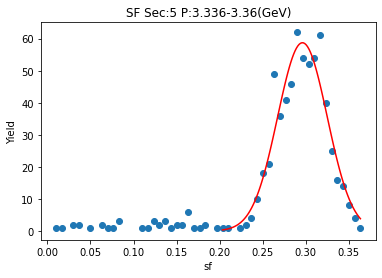

[5.41628477e+01 2.97528635e-01 2.79733235e-02]


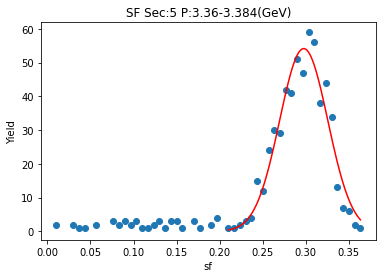

[5.04293605e+01 3.01513514e-01 2.70944647e-02]


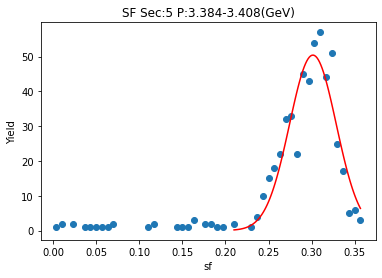

[2.14814959e+02 2.96318953e-01 2.80981942e-02]


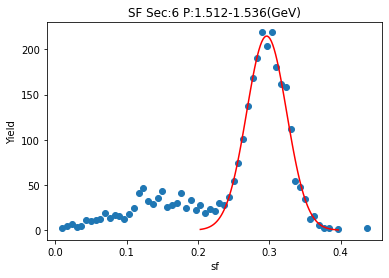

[2.35386718e+02 2.95483191e-01 2.63138412e-02]


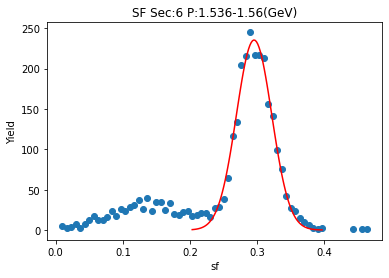

[2.27286983e+02 2.98205517e-01 2.74578654e-02]


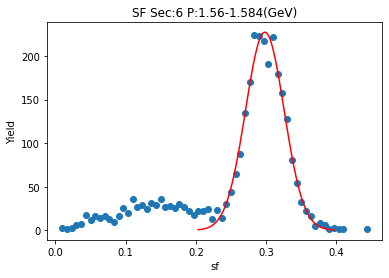

[2.30380560e+02 2.96738711e-01 2.70185813e-02]


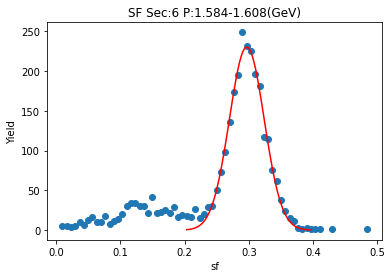

[2.39372668e+02 2.97961125e-01 2.56395351e-02]


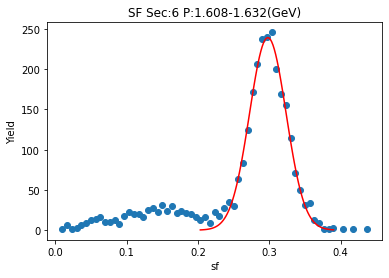

[2.41552532e+02 2.98084000e-01 2.64784453e-02]


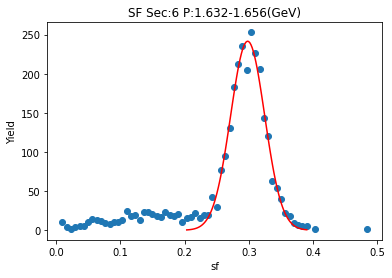

[2.45902589e+02 2.97715873e-01 2.53748907e-02]


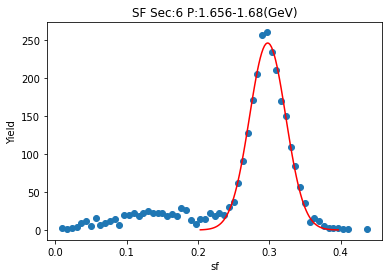

[2.54689482e+02 3.00069998e-01 2.56468603e-02]


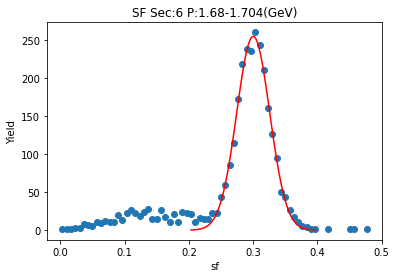

[2.42148181e+02 2.99099703e-01 2.58623640e-02]


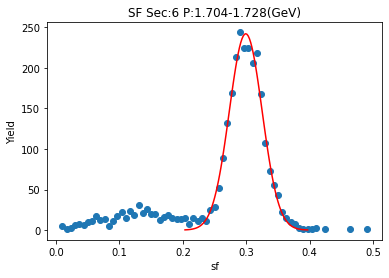

[2.65276764e+02 3.00159699e-01 2.48100645e-02]


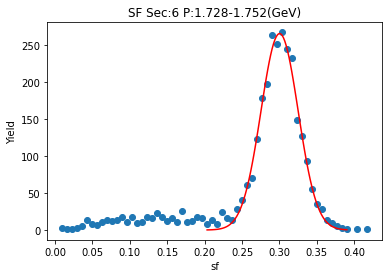

[2.61047580e+02 3.00256906e-01 2.49801314e-02]


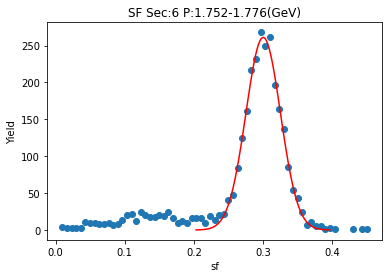

[2.67441675e+02 3.02023653e-01 2.53892322e-02]


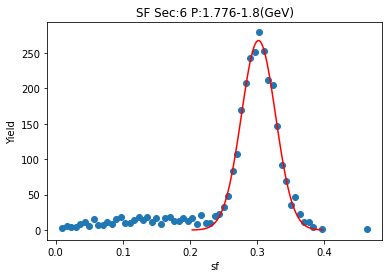

[2.55344225e+02 3.02885832e-01 2.52582450e-02]


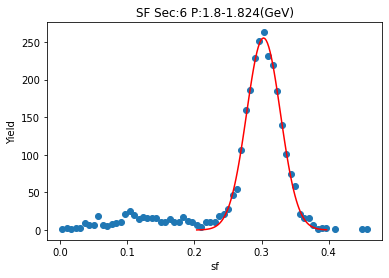

[2.66777497e+02 3.02168460e-01 2.43780462e-02]


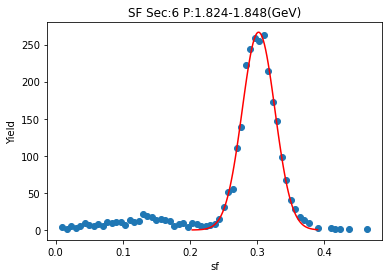

[2.72579800e+02 3.03769954e-01 2.44819781e-02]


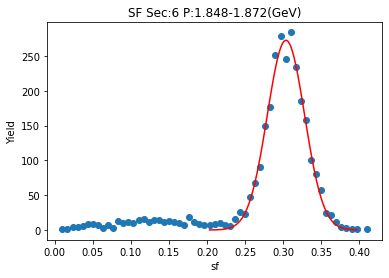

[2.70209757e+02 3.03117713e-01 2.44706318e-02]


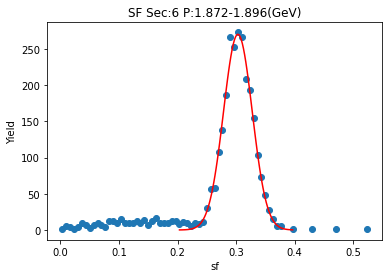

[2.91811846e+02 3.03130324e-01 2.42041690e-02]


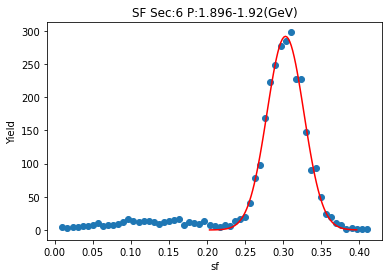

[2.86592992e+02 3.04017166e-01 2.42955582e-02]


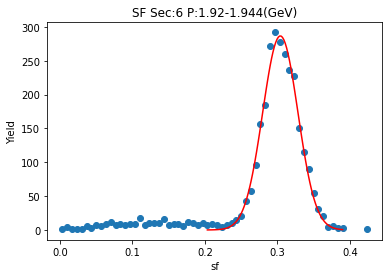

[2.90384204e+02 3.03923034e-01 2.41016753e-02]


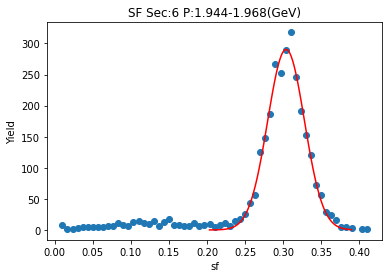

[2.94751430e+02 3.05215321e-01 2.39246301e-02]


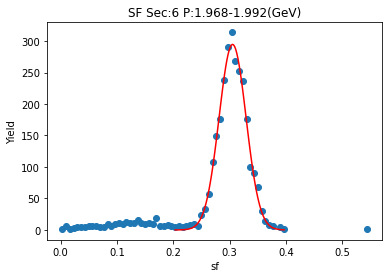

[2.90722114e+02 3.05066546e-01 2.44394401e-02]


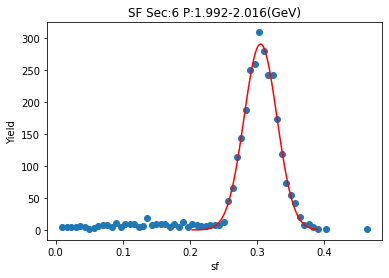

[2.93536072e+02 3.06035484e-01 2.37927336e-02]


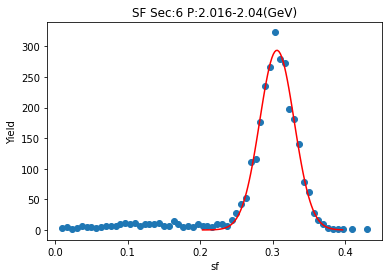

[2.93104104e+02 3.06121281e-01 2.40924849e-02]


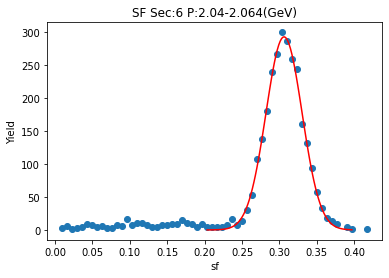

[2.94487858e+02 3.06783166e-01 2.42918557e-02]


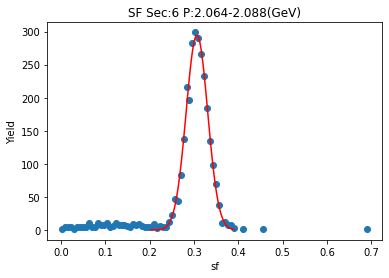

[3.22191204e+02 3.06306265e-01 2.35095286e-02]


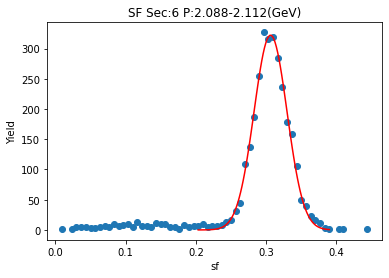

[3.07632608e+02 3.08058771e-01 2.37648804e-02]


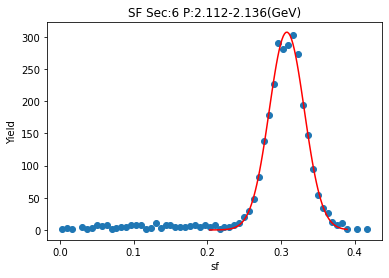

[3.00429358e+02 3.08400027e-01 2.40471648e-02]


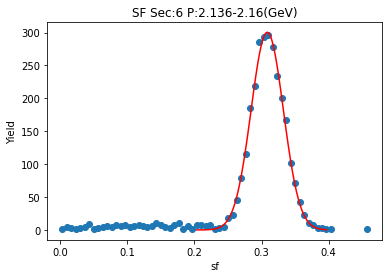

[3.35292520e+02 3.06426172e-01 2.24949946e-02]


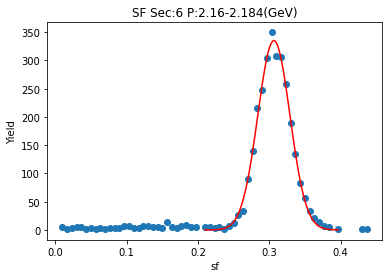

[3.32291575e+02 3.08482173e-01 2.30284683e-02]


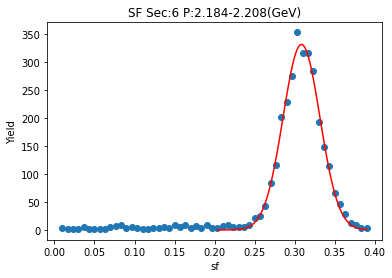

[3.35918559e+02 3.08144800e-01 2.22913474e-02]


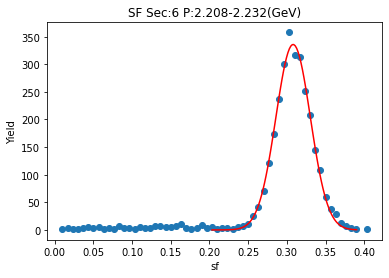

[3.31017701e+02 3.08299883e-01 2.28558594e-02]


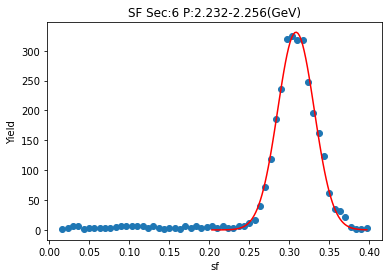

[3.28955228e+02 3.09221665e-01 2.35965773e-02]


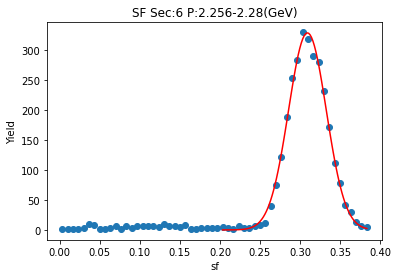

[3.44751062e+02 3.10462738e-01 2.23135706e-02]


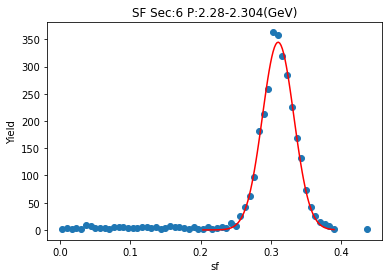

[3.47024383e+02 3.10013257e-01 2.18936566e-02]


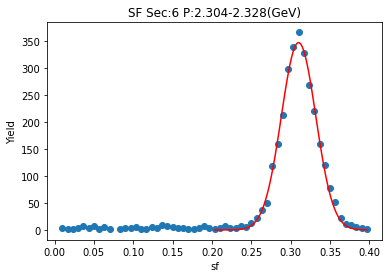

[3.42090509e+02 3.10872952e-01 2.21877474e-02]


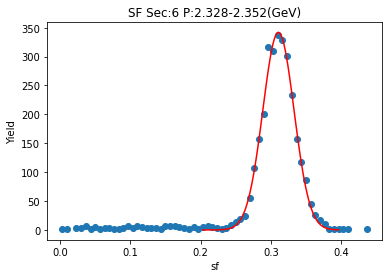

[3.47169343e+02 3.11912593e-01 2.20858663e-02]


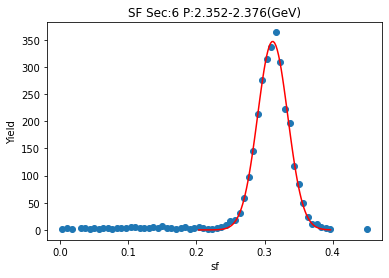

[3.35363944e+02 3.11202313e-01 2.30404866e-02]


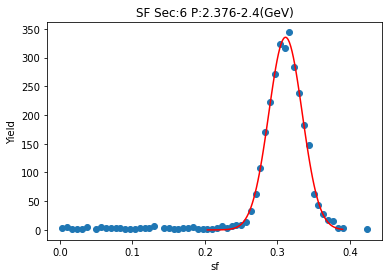

[3.42848304e+02 3.11678475e-01 2.18849555e-02]


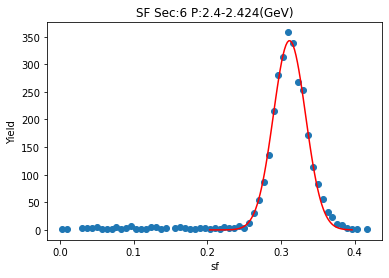

[3.53746852e+02 3.11547710e-01 2.19445804e-02]


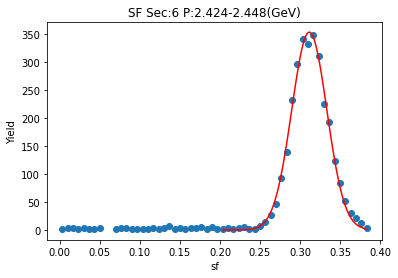

[3.60213341e+02 3.12060979e-01 2.18256925e-02]


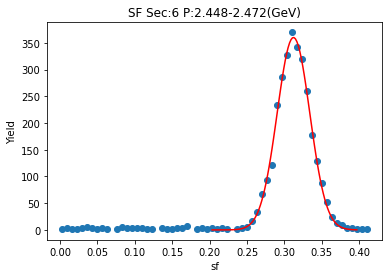

[3.56241273e+02 3.11032876e-01 2.22152036e-02]


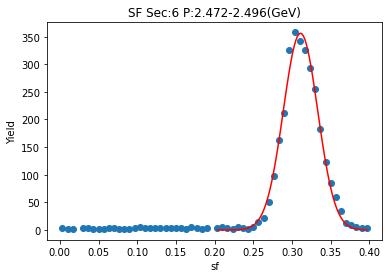

[3.48962485e+02 3.12069620e-01 2.22059130e-02]


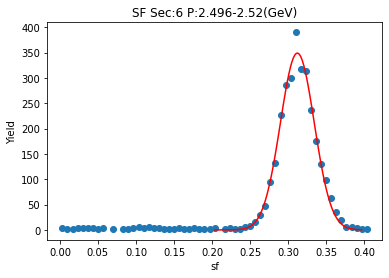

[3.56158852e+02 3.12614403e-01 2.16999151e-02]


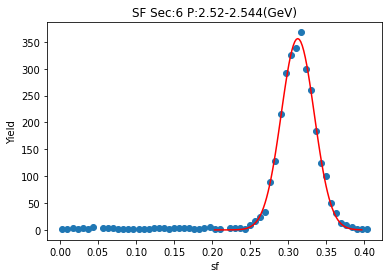

[3.43557529e+02 3.12600229e-01 2.21375672e-02]


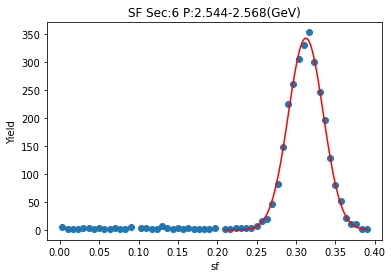

[3.53676809e+02 3.13022149e-01 2.16080400e-02]


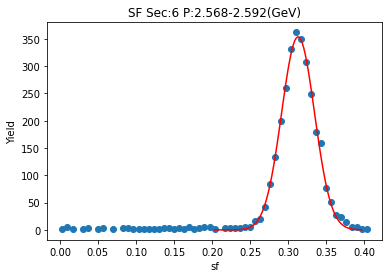

[3.51844315e+02 3.12586125e-01 2.24580130e-02]


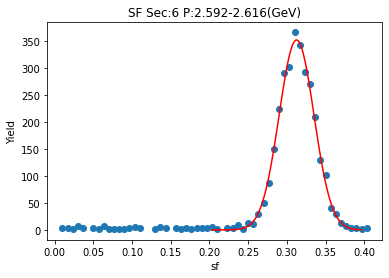

[3.50550661e+02 3.14378274e-01 2.16066184e-02]


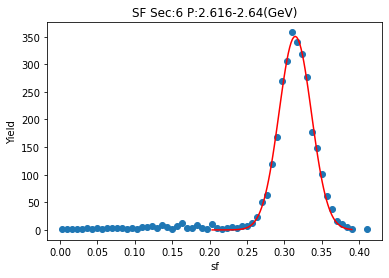

[3.39158935e+02 3.13759104e-01 2.27197324e-02]


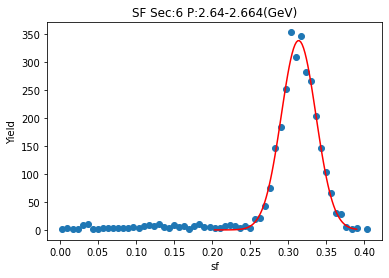

[3.24138888e+02 3.14964443e-01 2.27891615e-02]


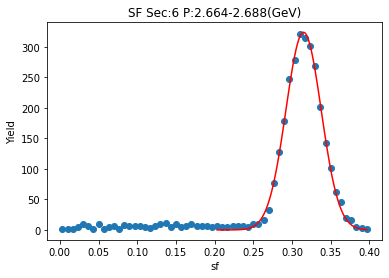

[3.46547533e+02 3.14236488e-01 2.15743090e-02]


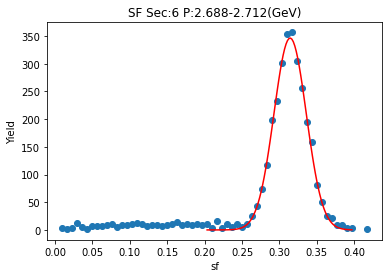

[3.30700118e+02 3.14143869e-01 2.21657540e-02]


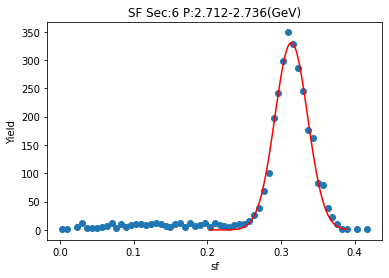

[3.31787421e+02 3.13323687e-01 2.20665307e-02]


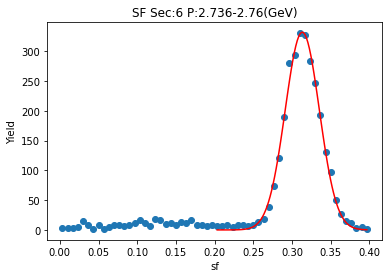

[3.43962724e+02 3.14119608e-01 2.17479747e-02]


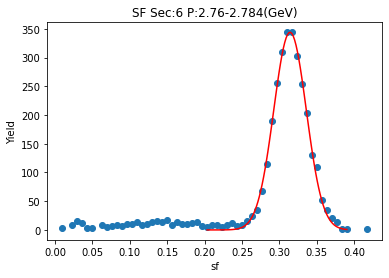

[3.41271958e+02 3.14794674e-01 2.21235679e-02]


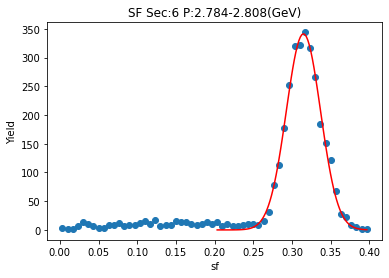

[3.24032102e+02 3.13774275e-01 2.23067442e-02]


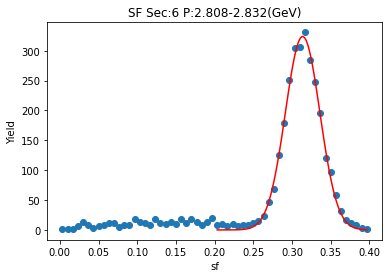

[3.20082404e+02 3.15724648e-01 2.27493741e-02]


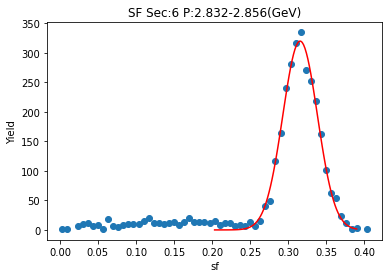

[3.31614288e+02 3.14332105e-01 2.15972800e-02]


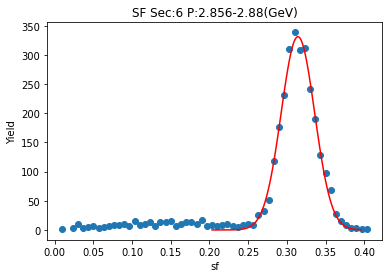

[3.28584913e+02 3.14949016e-01 2.15482859e-02]


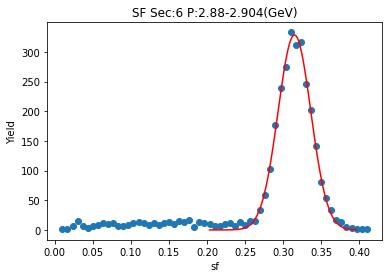

[3.31093271e+02 3.15019524e-01 2.09506291e-02]


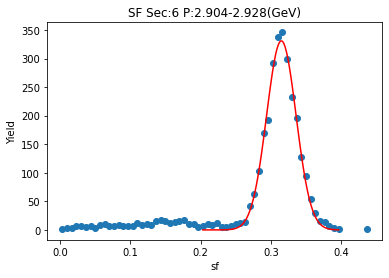

[2.98383133e+02 3.16114793e-01 2.23784246e-02]


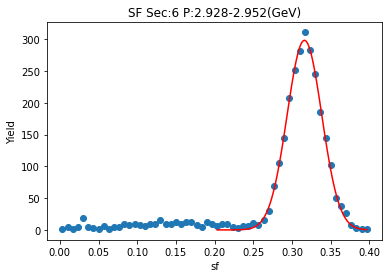

[3.02768232e+02 3.15256841e-01 2.17480037e-02]


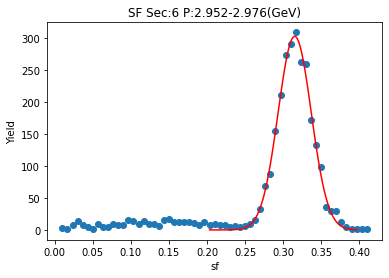

[2.99100427e+02 3.14522819e-01 2.16236060e-02]


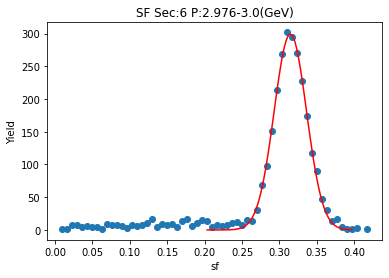

[2.95446710e+02 3.15945266e-01 2.09627823e-02]


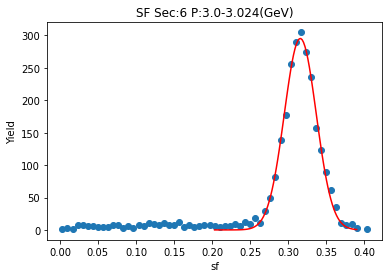

[2.85767032e+02 3.14065161e-01 2.17030853e-02]


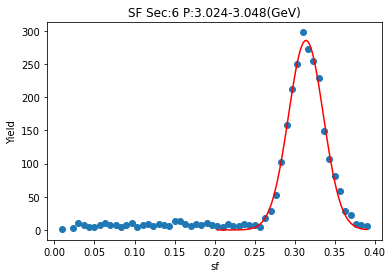

[2.79293030e+02 3.15116947e-01 2.19842474e-02]


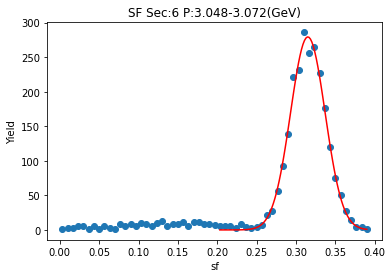

[2.88459218e+02 3.15907827e-01 2.09352510e-02]


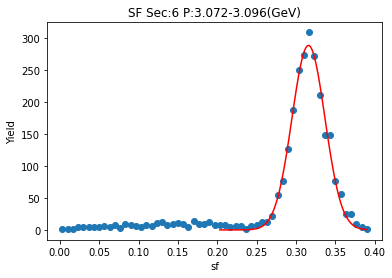

[2.79226382e+02 3.15053737e-01 2.05789617e-02]


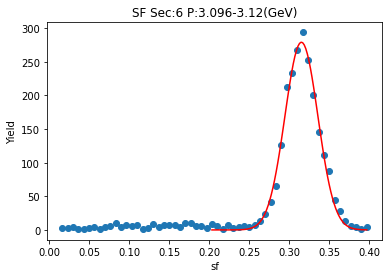

[2.71487631e+02 3.14993105e-01 2.07858119e-02]


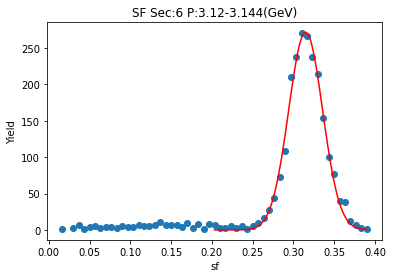

[2.61829362e+02 3.14762004e-01 2.03003771e-02]


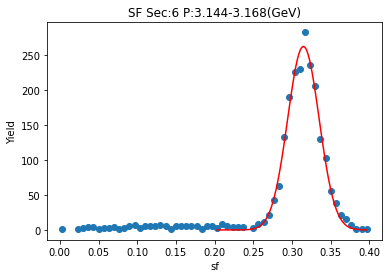

[2.58967251e+02 3.14715722e-01 2.09880667e-02]


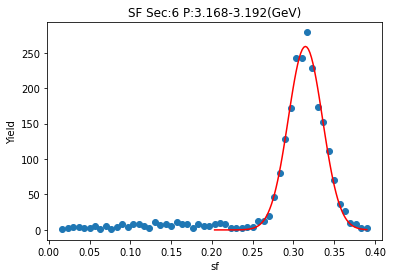

[2.48627406e+02 3.14370580e-01 2.01070324e-02]


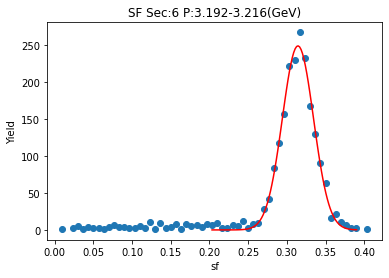

[2.47713249e+02 3.14229895e-01 1.99663499e-02]


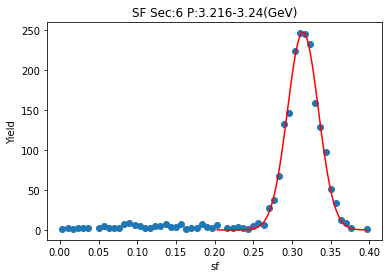

[2.42931619e+02 3.14275361e-01 2.04066482e-02]


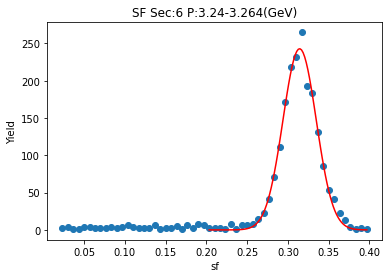

[2.12815762e+02 3.13910615e-01 2.10387348e-02]


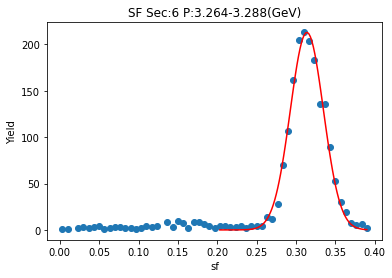

[2.26845891e+02 3.14796922e-01 2.00515866e-02]


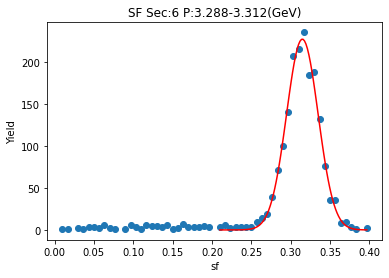

[2.20649518e+02 3.13613539e-01 2.00356068e-02]


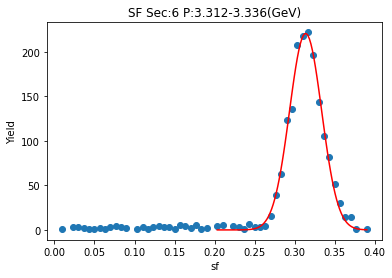

[2.17932853e+02 3.15780753e-01 1.98110464e-02]


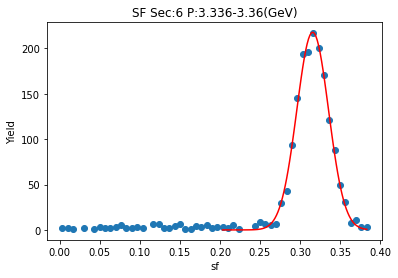

[1.90643226e+02 3.14729300e-01 2.10357869e-02]


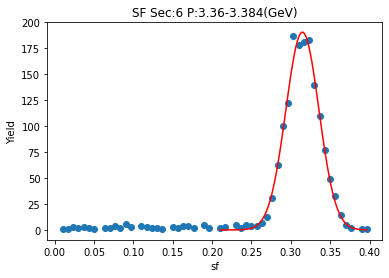

[1.87890671e+02 3.14137476e-01 1.97493806e-02]


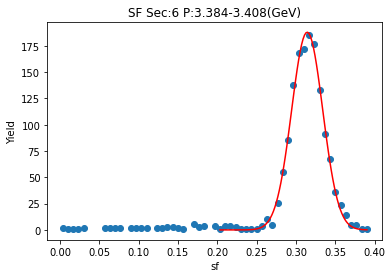

[1.64233700e+02 3.14539922e-01 2.04989740e-02]


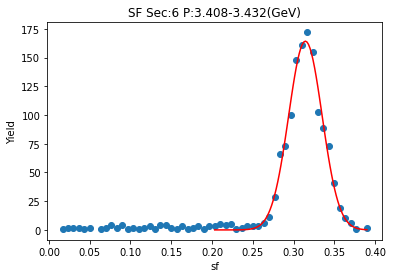

[1.78309078e+02 3.13674438e-01 2.01361143e-02]


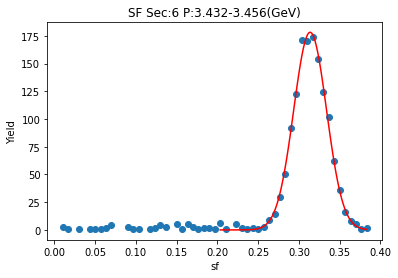

[1.53438947e+02 3.13281406e-01 2.00221224e-02]


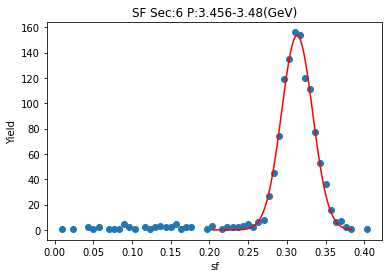

[1.38597030e+02 3.12910549e-01 1.89824024e-02]


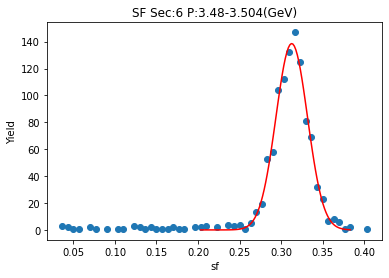

[1.28390181e+02 3.13018263e-01 2.02976113e-02]


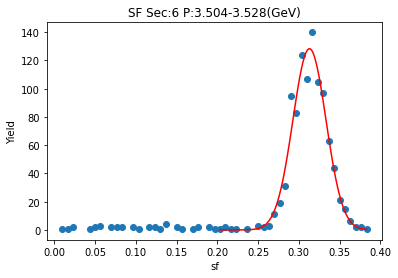

[1.22531315e+02 3.14181484e-01 1.91786584e-02]


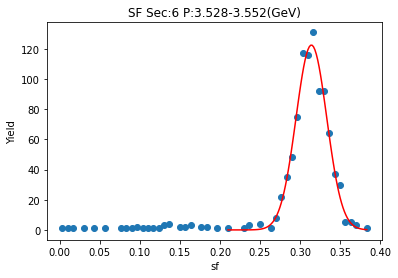

[1.00320334e+02 3.14648012e-01 2.00333278e-02]


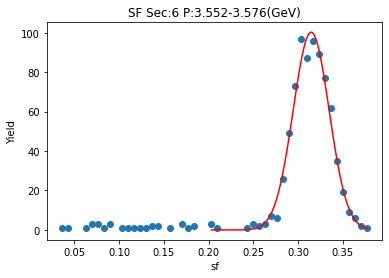

[1.11838839e+02 3.16250461e-01 1.87943960e-02]


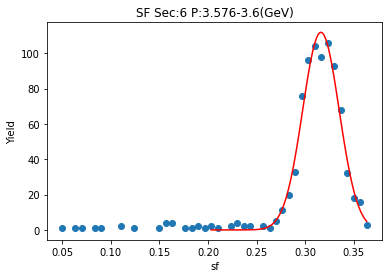

[9.24499326e+01 3.13587086e-01 1.89389280e-02]


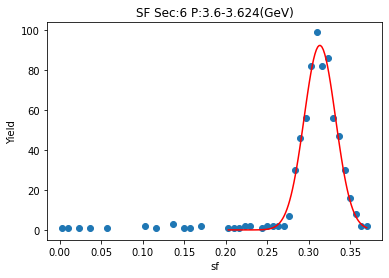

[8.77757488e+01 3.12926221e-01 1.98519903e-02]


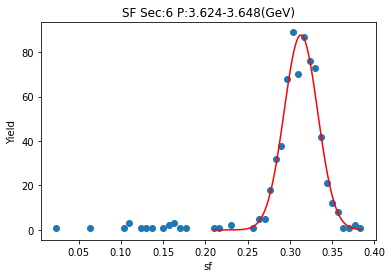

[8.84375014e+01 3.13356873e-01 1.83149393e-02]


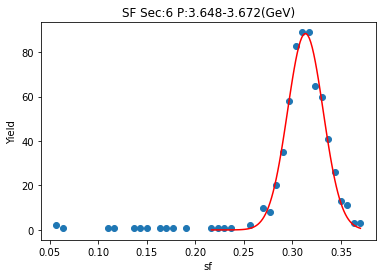

[7.10855644e+01 3.13323637e-01 1.97470218e-02]


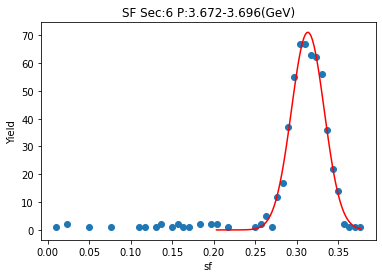

In [26]:
#Initial Guesses for Gaussian Fit
a1=100
m1=0.3
s1=0.05
initial_pars1=[0.0,m1,s1]

#par_bound_low = [0.0,0.0,0.0]
#par_bound_top = [inf,inf,inf]

sf_pars1 = np.zeros((6,len(sf_x),3))
sf_un1 = np.zeros((6,len(sf_x),3))
bound_mod=[0.6,]
low_mod = 1.2
norm_mod=2
min_p = [0.6,0.6,0.6,0.6,1.5,1.5]
mid_p = 1.0

for sec in range(6):
    for xbin in range(len(sf_x)):
        if sf_fit_y[sec][xbin].sum()>500 and sf_x[xbin]>min_p[sec]:
            #Set the amplitude guess to the maximum yield value
            initial_pars1[0] = np.amax(sf_fit_y[sec][xbin])
            plt.scatter(sf_fit_x[sec][xbin],sf_fit_y[sec][xbin])
            #Initial Fitting
            #Set Fit Range
            if sf_x[xbin]>mid_p:  
                sf_fit_x1 = Bounds_on_Y(sf_fit_x[sec][xbin],initial_pars1[1]-norm_mod*initial_pars1[2],initial_pars1[1]+norm_mod*initial_pars1[2])
                sf_fit_y1 = Bounds_on_X_From_Y(sf_fit_y[sec][xbin],sf_fit_x[sec][xbin],initial_pars1[1]-norm_mod*initial_pars1[2],initial_pars1[1]+norm_mod*initial_pars1[2])
            else:
                sf_fit_x1 = Bounds_on_Y(sf_fit_x[sec][xbin],initial_pars1[1]-low_mod*initial_pars1[2],initial_pars1[1]+norm_mod*initial_pars1[2])
                sf_fit_y1 = Bounds_on_X_From_Y(sf_fit_y[sec][xbin],sf_fit_x[sec][xbin],initial_pars1[1]-low_mod*initial_pars1[2],initial_pars1[1]+norm_mod*initial_pars1[2])
            pars1 = op.curve_fit(Gaus,sf_fit_x1,sf_fit_y1,p0=initial_pars1,maxfev=5000)
            #if np.sqrt(pars1[1][1][1])/pars1[0][1] < 0.1:
            for i in range(3):
                sf_pars1[sec][xbin][i]=pars1[0][i]
                sf_un1[sec][xbin][i]=np.sqrt(pars1[1][i][i])
            cont_x1 = np.linspace(sf_fit_x1[0],sf_fit_x1[len(sf_fit_x1)-1],100)
            print(pars1[0])
            plt.plot(cont_x1,Gaus(cont_x1,*pars1[0]),color='r')
            plot_title="SF Sec:{} P:{}-{}(GeV)".format(sec+1,Pbin_low(xbin),Pbin_top(xbin))
            plt.title(plot_title)
            plt.xlabel(_sf_yname)
            plt.ylabel("Yield")
            plt.show()

In [27]:
sf_num_sigma1 = 3
sf_bounds1 = np.zeros((6,2,len(sf_x)))
sf_sigma1= np.zeros((6,2,len(sf_x)))
for sec in range(6):
    for xbin in range(len(sf_x)):
        sf_bounds1[sec][0][xbin] = sf_pars1[sec][xbin][1]-sf_num_sigma1*sf_pars1[sec][xbin][2]
        sf_sigma1[sec][0][xbin] = sf_un1[sec][xbin][1]+sf_un1[sec][xbin][2]
        sf_bounds1[sec][1][xbin] = sf_pars1[sec][xbin][1]+sf_num_sigma1*sf_pars1[sec][xbin][2]
        sf_sigma1[sec][1][xbin] = sf_un1[sec][xbin][1]+sf_un1[sec][xbin][2]

In [28]:
#Might do 2nd fit here, but not sure yet

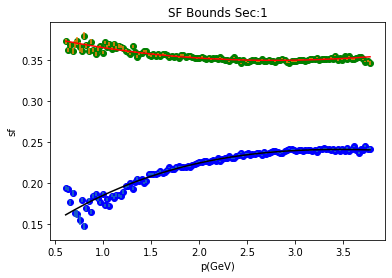

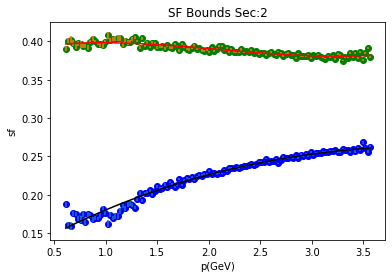

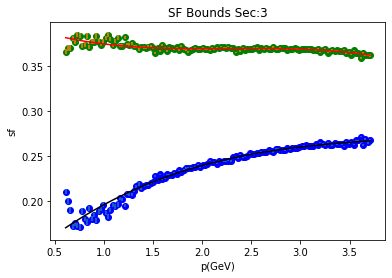

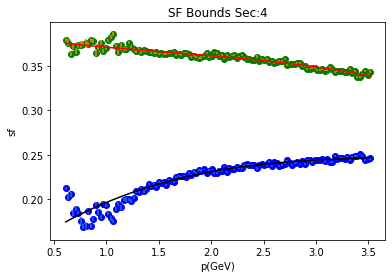

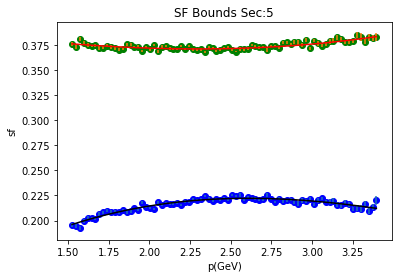

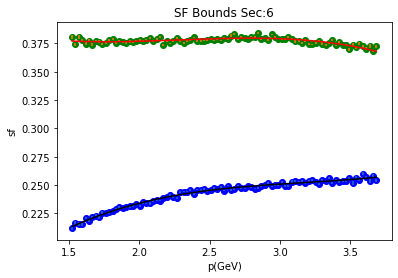

In [29]:
l0=0.0
l1=0.5
l2=-0.2
l3=0.2
initial_low_par2=[l0,l1,l2,l3]
t0=0.0
t1=0.5
t2=-0.2
t3=0.2
initial_top_par2=[t0,t1,t2,t3]

low_par_fit= np.zeros((6,4))
top_par_fit = np.zeros((6,4))

for sec in range(6):
    plt.scatter(Remove_Zeros_X(sf_x,sf_bounds1[sec][0]),Remove_Zeros(sf_bounds1[sec][0]),color='b')
    plt.scatter(Remove_Zeros_X(sf_x,sf_bounds1[sec][1]),Remove_Zeros(sf_bounds1[sec][1]),color='g')
    plt.errorbar(Remove_Zeros_X(sf_x,sf_bounds1[sec][0]),Remove_Zeros(sf_bounds1[sec][0]),yerr=Remove_Zeros_X(sf_sigma1[sec][0],sf_bounds1[sec][0]),fmt='',linestyle='')
    plt.errorbar(Remove_Zeros_X(sf_x,sf_bounds1[sec][1]),Remove_Zeros(sf_bounds1[sec][1]),yerr=Remove_Zeros_X(sf_sigma1[sec][1],sf_bounds1[sec][1]),fmt='',linestyle='')
    #Fit with 3rd order Polynomial 
    sf_par_low1=op.curve_fit(Poly3,Remove_Zeros_X(sf_x,sf_bounds1[sec][0]),Remove_Zeros(sf_bounds1[sec][0]),p0=initial_low_par2,sigma=Remove_Zeros_X(sf_sigma1[sec][0],sf_bounds1[sec][0]),maxfev=5000)
    sf_par_top1=op.curve_fit(Poly3,Remove_Zeros_X(sf_x,sf_bounds1[sec][1]),Remove_Zeros(sf_bounds1[sec][1]),p0=initial_top_par2,sigma=Remove_Zeros_X(sf_sigma1[sec][1],sf_bounds1[sec][1]),maxfev=5000)
    for i in range(4):
        low_par_fit[sec][i] = sf_par_low1[0][i]
        top_par_fit[sec][i] = sf_par_top1[0][i]
    cont_x_low = np.linspace(Remove_Zeros_X(sf_x,sf_bounds1[sec][0])[0],Remove_Zeros_X(sf_x,sf_bounds1[sec][0])[len(Remove_Zeros_X(sf_x,sf_bounds1[sec][0]))-1],200)
    cont_x_top = np.linspace(Remove_Zeros_X(sf_x,sf_bounds1[sec][1])[0],Remove_Zeros_X(sf_x,sf_bounds1[sec][1])[len(Remove_Zeros_X(sf_x,sf_bounds1[sec][1]))-1],200)
    plt.plot(cont_x_low,Poly3(cont_x_low,*low_par_fit[sec]),color='k')
    plt.plot(cont_x_top,Poly3(cont_x_top,*top_par_fit[sec]),color='r')
    plot_title="SF Bounds Sec:{}".format(sec+1)
    plt.title(plot_title)
    plt.xlabel(_sf_xname)
    plt.ylabel(_sf_yname)
    plt.show()

In [30]:
#Stuff to make it so I can plot a 2d Histogram with data in the format I have
#Would be a lot easier if I had uproot 4 working 
dumb_x= np.zeros((6,len(sf_xbins)*len(sf_ybins)))
dumb_y= np.zeros((6,len(sf_xbins)*len(sf_ybins)))
dense2 = np.zeros((6,len(sf_xbins)*len(sf_ybins)))
for sec in range(6):
    for i in range(len(sf_xbins)):
        for j in range(len(sf_ybins)):
            dumb_x[sec][i+j*len(sf_xbins)]+=sf_xbins[i]
            dumb_y[sec][i+j*len(sf_xbins)]+=sf_ybins[j]
            dense2[sec][i+j*len(sf_xbins)]+=sf_zvals_xy[sec][i][j]

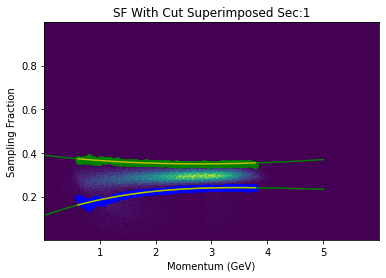

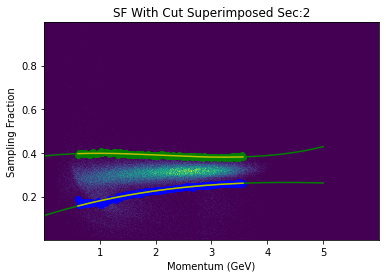

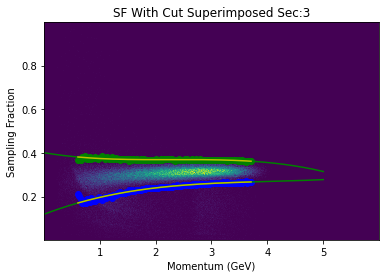

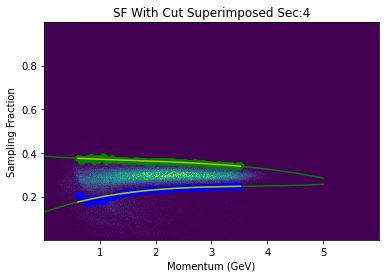

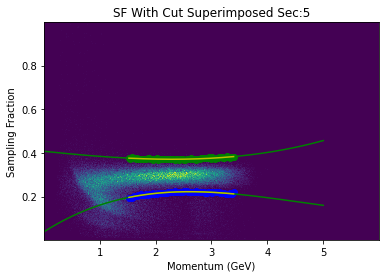

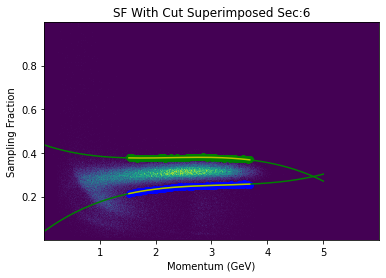

In [35]:
for sec in range(6):
    plt.hist2d(dumb_x[sec], dumb_y[sec], bins=(len(sf_xbins), len(sf_ybins)), weights=dense2[sec])
    plt.scatter(Remove_Zeros_X(sf_x,sf_bounds1[sec][0]),Remove_Zeros(sf_bounds1[sec][0]),color='b')
    plt.scatter(Remove_Zeros_X(sf_x,sf_bounds1[sec][1]),Remove_Zeros(sf_bounds1[sec][1]),color='g')
    cont_x_low2 = np.linspace(0.0,5.0,200)
    cont_x_top2 = np.linspace(0.0,5.0,200)
    plt.plot(cont_x_low2,Poly3(cont_x_low2,*low_par_fit[sec]),color='g')
    plt.plot(cont_x_top2,Poly3(cont_x_top2,*top_par_fit[sec]),color='g')
    cont_x_low = np.linspace(Remove_Zeros_X(sf_x,sf_bounds1[sec][0])[0],Remove_Zeros_X(sf_x,sf_bounds1[sec][0])[len(Remove_Zeros_X(sf_x,sf_bounds1[sec][0]))-1],200)
    cont_x_top = np.linspace(Remove_Zeros_X(sf_x,sf_bounds1[sec][1])[0],Remove_Zeros_X(sf_x,sf_bounds1[sec][1])[len(Remove_Zeros_X(sf_x,sf_bounds1[sec][1]))-1],200)
    plt.plot(cont_x_low,Poly3(cont_x_low,*low_par_fit[sec]),color='y')
    plt.plot(cont_x_top,Poly3(cont_x_top,*top_par_fit[sec]),color='y')
    plt.title("SF With Cut Superimposed Sec:{}".format(sec+1))
    plt.xlabel("Momentum (GeV)")
    plt.ylabel("Sampling Fraction")
    plt.show()
    
    

In [32]:
print("SF Cut Parameters for ",sf_num_sigma1," sigma cut using 3rd order Polynomial")
print("Lower Bound in order of increasing exponent")
for i in range(6):
    if i == 0:
        print("[[",low_par_fit[i][0],",",low_par_fit[i][1],",",low_par_fit[i][2],",",low_par_fit[i][3],"],")
    elif i==5:
        print("[",low_par_fit[i][0],",",low_par_fit[i][1],",",low_par_fit[i][2],",",low_par_fit[i][3],"]]")
    else:
        print("[",low_par_fit[i][0],",",low_par_fit[i][1],",",low_par_fit[i][2],",",low_par_fit[i][3],"],")
print("Upper Bound in order of increasing exponent")
for i in range(6):
    if i == 0:
        print("[[",top_par_fit[i][0],",",top_par_fit[i][1],",",top_par_fit[i][2],",",top_par_fit[i][3],"],")
    elif i==5:
        print("[",top_par_fit[i][0],",",top_par_fit[i][1],",",top_par_fit[i][2],",",top_par_fit[i][3],"]]")
    else:
        print("[",top_par_fit[i][0],",",top_par_fit[i][1],",",top_par_fit[i][2],",",top_par_fit[i][3],"],")
#print(low_par_fit)
#print(top_par_fit)

SF Cut Parameters for  3  sigma cut using 3rd order Polynomial
Lower Bound in order of increasing exponent
[[ 0.11254435235629823 , 0.09195273193068429 , -0.02096053391176168 , 0.001478333497263235 ],
[ 0.11217500932938243 , 0.08034221401753719 , -0.012700874192544986 , 0.0005261671565294426 ],
[ 0.11818902586350817 , 0.09886440631030419 , -0.022882394750943717 , 0.001897311625188021 ],
[ 0.12822238651203177 , 0.0895232545558494 , -0.02320524276887876 , 0.0020867571142023813 ],
[ 0.03792165053024606 , 0.16328458826976763 , -0.04394571055437047 , 0.0032314989160281116 ],
[ 0.03916774939292153 , 0.18675565607784728 , -0.05660322639212833 , 0.005959170423511862 ]]
Upper Bound in order of increasing exponent
[[ 0.38939348796612616 , -0.030549738625718092 , 0.006491327629397111 , -0.00023647500135070583 ],
[ 0.38567500446840003 , 0.02841434695995756 , -0.019021388814852224 , 0.003012075074665607 ],
[ 0.4010494315227712 , -0.04318418064013612 , 0.01918211454815412 , -0.002800367792067719 ],


/var/folders/9h/zwsh0vf94zxdp3tw1qp_dcjw0000gn/T/ipykernel_17397/580422124.py:5: RuntimeWarning: invalid value encountered in divide
  plt.scatter(sf_x,sf_sigma1[sec][side]/sf_bounds1[sec][side],label=sig_label[side])


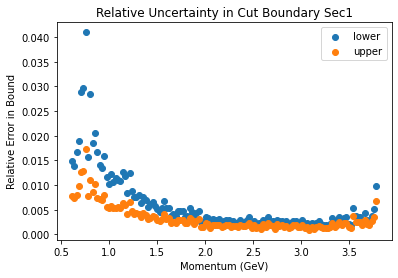

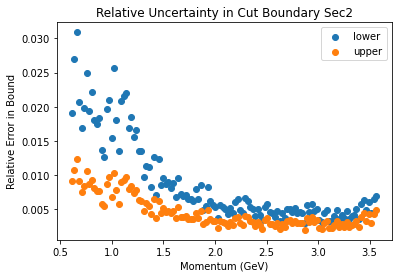

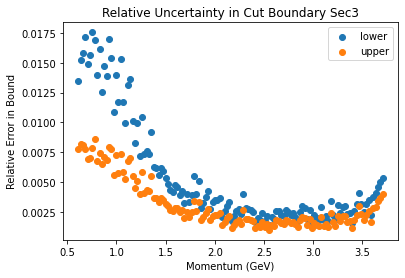

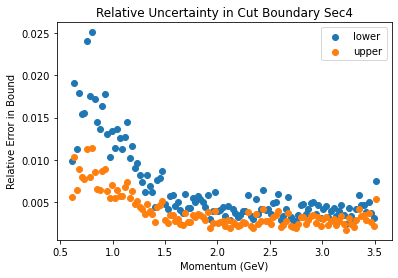

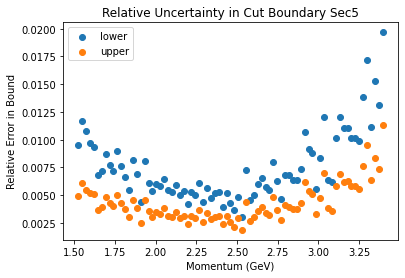

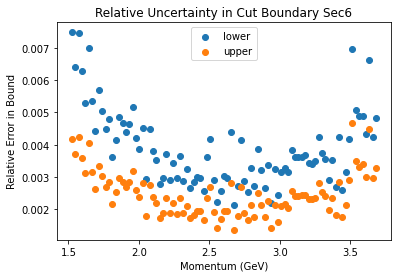

In [33]:
#Looking at relative errors for the bounds 
sig_label=['lower','upper']
for sec in range(6):
    for side in range(2):
        plt.scatter(sf_x,sf_sigma1[sec][side]/sf_bounds1[sec][side],label=sig_label[side])
    plot_name="Relative Uncertainty in Cut Boundary Sec{}".format(sec+1)
    plt.title(plot_name)
    plt.xlabel("Momentum (GeV)")
    plt.ylabel("Relative Error in Bound")
    plt.legend()
    plt.show()